# Preamble

In [449]:
import xarray as xr
import matplotlib.pyplot as plt
import os
import sys
import numpy as np
import cmocean.cm as ocm
from scipy import stats
import seaborn as sns
import pandas as pd

proj_dir = os.path.join(os.pardir,os.pardir)
data_dir = os.path.join(proj_dir,'data')
ext_dir = os.path.join(data_dir,'analysis','external')
int_dir = os.path.join(data_dir,'analysis','interim')
pro_dir = os.path.join(data_dir,'analysis','processed')
fig_dir = os.path.join(os.pardir,os.pardir,'reports','relation_melting','figures')
tab_dir = os.path.join(os.pardir,os.pardir,'reports','relation_melting','tables')

src_dir = os.path.join(proj_dir,'src')
sys.path.append(src_dir)

from tools.log_progress import log_progress
from visualization.shiftedColorMap import shiftedColorMap
from tools.calc_melt_frc import calc_ustar,calc_frc,calc_insituTemp

%load_ext autoreload
%autoreload 2
#%aimport tools.calc_melt_frc

s2a = 3600*24*365.25

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
grid_path = os.path.join(int_dir,'grd2_dV.nc')
u_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_u_avg.nc')
v_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_v_avg.nc')
temp_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_temp_avg.nc')
salt_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_salt_avg.nc')
m_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_m_avg.nc')
sector_masks_path = os.path.join(int_dir,'mask_sector_2.npy') 
shelves_masks_path = os.path.join(int_dir,'shelves2.npy') 

# Boundary layer

## maps of annual averaged ustar, Tstar, etc 

### full spatial variability

In [3]:
grd2 = xr.open_dataset(grid_path)
u2 = xr.open_dataset(u_path).u.squeeze()
v2 = xr.open_dataset(v_path).v.squeeze()
temp2 = xr.open_dataset(temp_path).temp
salt2 = xr.open_dataset(salt_path).salt
m2 = xr.open_dataset(m_path).m
sector2 = np.load(sector_masks_path,allow_pickle=True).item()
shelves2 = np.load(shelves_masks_path,allow_pickle=True).item()
shelves2 = {k: v for k, v in shelves2.items() if v['mask'].any()}

mask2 = ((grd2.zice<0) & (grd2.mask_rho==1))
m2 = m2.where(mask2).squeeze()
Sm2 = salt2.isel(s_rho=30).where(mask2).squeeze()
Tpot2 = temp2.isel(s_rho=30).where(mask2).squeeze()
zice2 = grd2.zice.where(mask2)

#Tm2 = calc_insituTemp(mask2,Tpot2,Sm2,zice2)
#Tm2.to_netcdf(os.path.join(int_dir,'situTemp2.nc'))
Tm2 = xr.open_dataarray(os.path.join(int_dir,'situTemp2.nc')).where(mask2)
ustar2 = calc_ustar(u2,v2,mask2)
Tdr2,Tfr2 = calc_frc(Tm2,Sm2,zice2,ustar2,grd2.f.where(mask2),m2,mask2)

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/xarray/core/computation.py:560: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


In [19]:
def plot_map(da,grd,title,cbar_label,cmap,vrange,save=False):
    #matplotlib.rcParams.update({'font.size': 22}) 
    plt.close()
    fig,ax = plt.subplots(figsize=(10,8))
    ax.axis('off')
    ax.set_aspect('equal')
    ax.contourf(grd.mask_rho.where(grd.mask_rho==0),colors=(('0.6','0.6','0.6')))
    if vrange==None:
        mean = da.mean(dim=da.dims)
        std = da.std(dim=da.dims)
        vmin=max(da.min(),mean-2*std)
        vmax=min(da.max(),mean+2*std)
    elif vrange=='sat':
        vmax = max(da.max(),np.abs(da.min()))
        vmin = -vmax
    else:
        vmin,vmax=vrange
    plot = da.plot(ax=ax,vmin=vmin,vmax=vmax,cmap=cmap,cbar_kwargs={'label': cbar_label})
    ax.set_title(title,fontsize=22)
    ax.set_ylim([250,2500])
    ax.set_xlim([200,2900])
    plt.tight_layout()
    if save:
        plt.savefig(os.path.join(fig_dir,'map_'+title.replace('/','_')+'.png'),format='png',bbox_inches = "tight")
    plt.show()

#### general plots

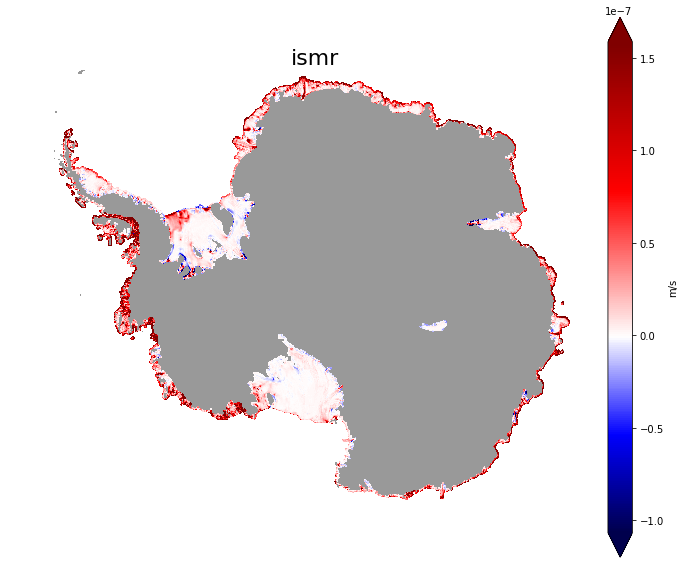

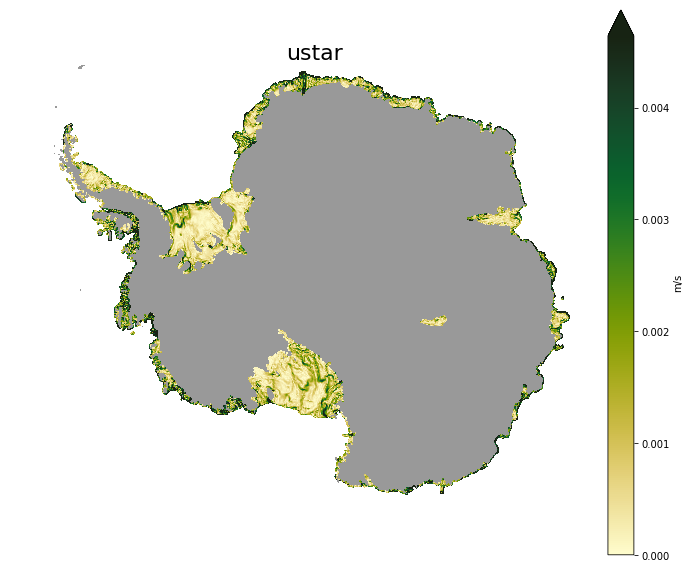

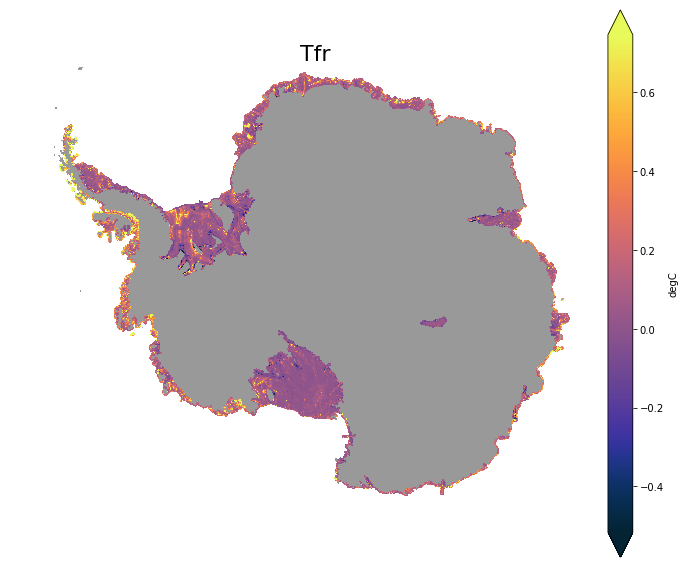

In [34]:
m_mean = m2.mean(dim=m2.dims)
m_std = m2.std(dim=m2.dims)
m_min=m_mean-2*m_std
m_max=m_mean+2*m_std
m_cmap = shiftedColorMap(plt.cm.seismic,midpoint = (1 - m_max/(m_max + abs(m_min))))

ustar_max=ustar2.mean(dim=ustar2.dims)+2*ustar2.std(dim=ustar2.dims)

for da,title,cbt,cmap,vrange in [[m2,'ismr','m/s',m_cmap,(m_min,m_max)],
                                 [ustar2,'ustar','m/s',ocm.speed,(0,ustar_max)],
                                 [Tfr2,'Tfr','degC',ocm.thermal,None]]:
    plot_map(da,grd2,title,cbt,cmap,vrange)

#### neglecting salinity diffusion

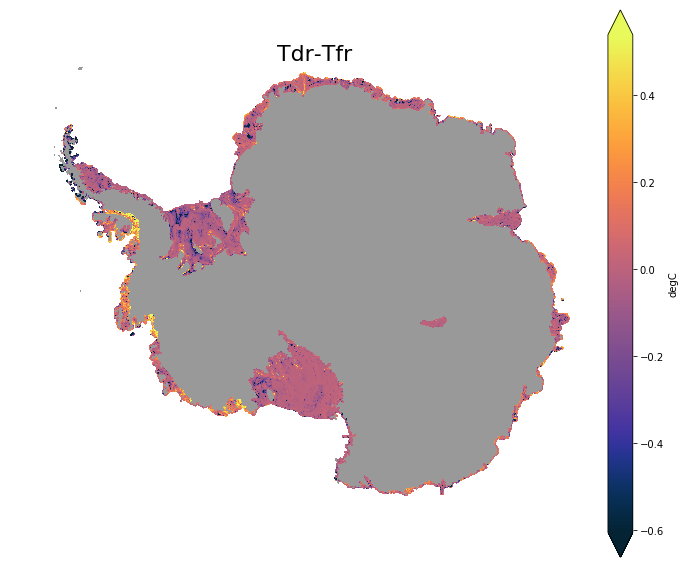

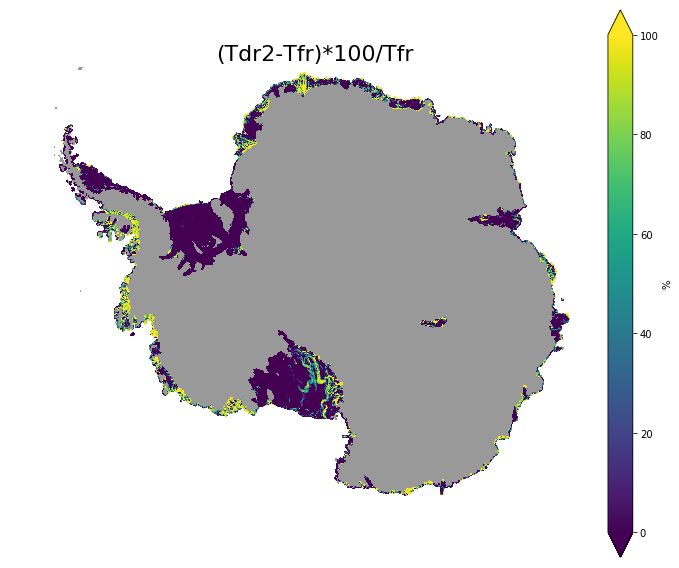

In [35]:
for da,title,cbt,cmap,vrange in [[Tdr2-Tfr2,'Tdr-Tfr','degC',ocm.thermal,None],
                                 [(Tdr2-Tfr2)*100/Tfr2,'(Tdr2-Tfr)*100/Tfr','%','viridis',(0,100)]]:
    plot_map(da,grd2,title,cbt,cmap,vrange)

### ice shelf averages

In [312]:
avg = pd.DataFrame.from_dict(shelves2).T[['A','ismr','ustar','Tfr','Tdr','<Tfr*ustar>','<Tdr*ustar>']].dropna(axis=0,how='any').astype(float)
avg['ismr'] *= s2a
avg['<Tfr><ustar>'] = avg['Tfr']*avg['ustar']
avg['<Tdr><ustar>'] = avg['Tdr']*avg['ustar']

## ice shelf classification using ustar vs Tfr relation and baysain gausian clustering

In [237]:
%matplotlib inline
import seaborn as sns; sns.set()
from sklearn.mixture import GaussianMixture

def BIC_AIC_test(data,cvtype='full'):
    n_components = np.arange(1, 21)
    models = [GaussianMixture(n, covariance_type=cvtype, random_state=0).fit(data)
              for n in n_components]
    plt.figure(figsize=(10,6))
    plt.plot(n_components, [m.bic(data) for m in models], label='BIC')
    plt.plot(n_components, [m.aic(data) for m in models], label='AIC')
    plt.legend(loc='best')
    plt.xlabel('n_components');
    
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    #ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor,ax=ax)
    
    ax.set_xlim([min(x)-0.5*np.std(x),max(x)+0.5*np.std(x)])
    ax.set_ylim([min(y)-0.5*np.std(y),max(y)+0.5*np.std(y)])

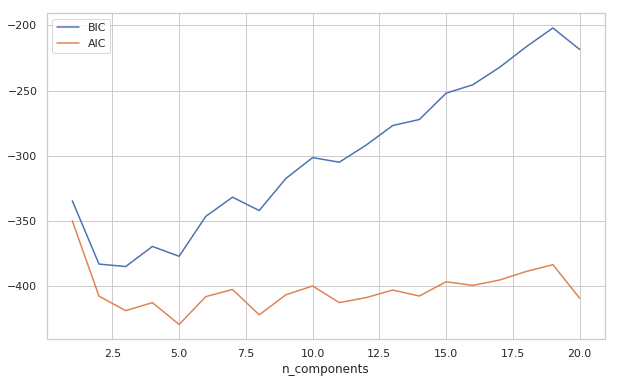

In [433]:
k = np.array([k for k,v in shelves2.items()]).squeeze()
y = np.sqrt(np.array([v['ustar']*100 for k,v in shelves2.items()]).squeeze())
x = np.array([v['Tdr'] for k,v in shelves2.items()]).squeeze()

data = np.vstack([x, y]).T

BIC_AIC_test(data,cvtype='tied')

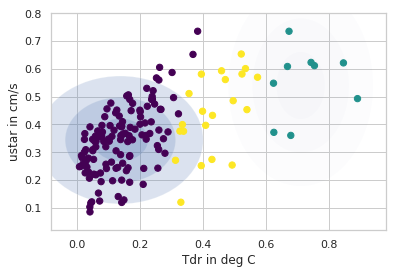

In [438]:
model = GaussianMixture(n_components=3,covariance_type='tied').fit(data)
#sns.set(style='whitegrid')
fig,ax = plt.subplots()
plot_gmm(model,data,ax=ax)
ax.set_xlabel('Tdr in deg C')
ax.set_ylabel('ustar in cm/s')
plt.savefig(os.path.join(fig_dir,'scatter_avg_Tdr_ustar_categories.png'),format='png',bbox_inches = "tight")
plt.show()

In [439]:
drops = []
for i,key in enumerate(k):
    gm = model.predict(data)[i]
    shelves2[key]['gm'] = gm
    if gm in [1]:
        print(key)
        drops.append(key)

Alison
Ferrigno
Fox Ice Stream
George VI
Pine Island
Swinburne
Thwaites
Verdi
Walgreen Coast 1


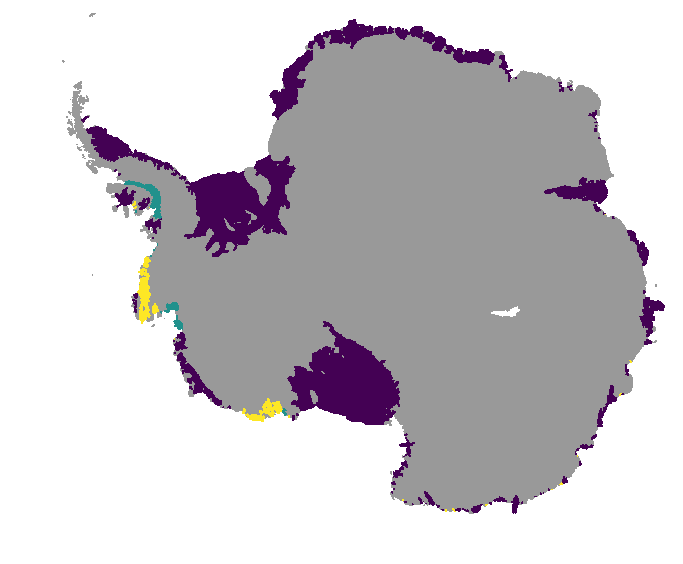

In [440]:
shelf_map = np.zeros_like(grd2.mask_rho)
shelf_map[:] = np.nan

for key,values in log_progress(shelves2.items(),every=2):
    shelf_map[values['mask']]=values['gm']
    
shelf_map =  xr.DataArray(shelf_map,dims=('eta_rho','xi_rho')).where((grd2.zice<0)&(grd2.mask_rho==1))

plt.close()
fig,ax = plt.subplots(figsize=(10,8))
ax.axis('off')
ax.set_aspect('equal')
ax.contourf(grd2.mask_rho.where(grd2.mask_rho==0),colors=(('0.6','0.6','0.6')))
plot = shelf_map.plot(ax=ax,add_colorbar=False)
ax.set_ylim([250,2500])
ax.set_xlim([200,2900])
plt.tight_layout()
plt.savefig(os.path.join(fig_dir,'map_avg_Tdr_Ustar_categories.png'),format='png',bbox_inches = "tight")
plt.show()

In [287]:
avg = avg.drop(drops)

#### general plots

In [288]:
def make_avg_map(df):
    shelf_map = np.zeros_like(grd2.mask_rho)
    mask_map = np.zeros_like(shelf_map)
    for k,v in df.iteritems():
        shelf_map[shelves2[k]['mask']]=v
        mask_map[shelves2[k]['mask']]=1
        
    return xr.DataArray(shelf_map,dims=('eta_rho','xi_rho')).where(mask_map)

def map_shelves_avg(df,title,cbar_label,cmap,vrange,save=False):
    
    shelf_map = make_avg_map(df)
    
    plt.close()
    fig,ax = plt.subplots(figsize=(10,8))
    ax.axis('off')
    ax.set_aspect('equal')
    ax.contourf(grd2.mask_rho.where(grd2.mask_rho==0),colors=(('0.6','0.6','0.6')))
    if vrange==None:
        mean = df.mean()
        std = df.std()
        vmin=max(df.min(),mean-2*std)
        vmax=min(df.max(),mean+2*std)
    elif vrange=='sat':
        vmax = max(df.max(),np.abs(df.min()))
        vmin = -vmax
    else:
        vmin,vmax=vrange
        
    plot = shelf_map.plot(ax=ax,vmin=vmin,vmax=vmax,cmap=cmap,cbar_kwargs={'label': cbar_label})
    ax.set_title(title,fontsize=18)
    ax.set_ylim([250,2500])
    ax.set_xlim([200,2900])
    plt.tight_layout()
    if save:
        plt.savefig(os.path.join(fig_dir,'avgmap_'+title.replace('/','_')+'.png'),format='png',bbox_inches = "tight")
    plt.show()

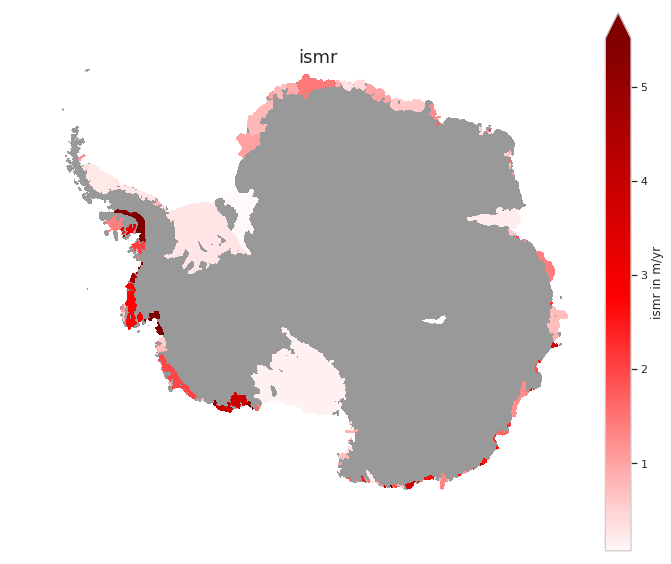

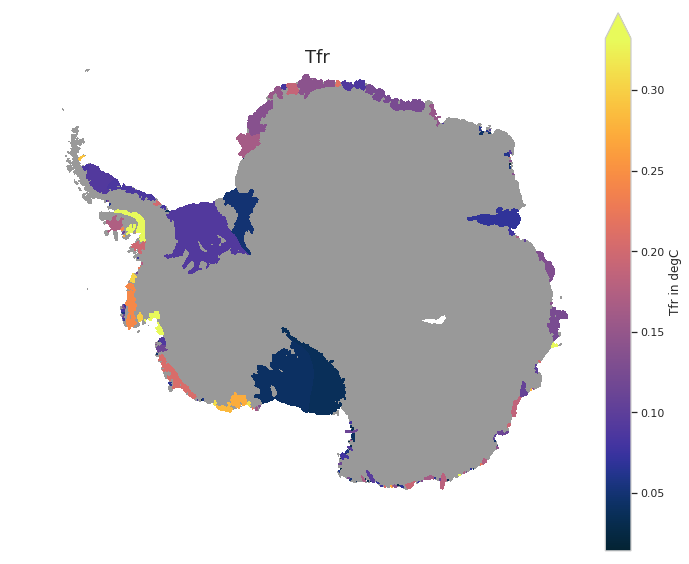

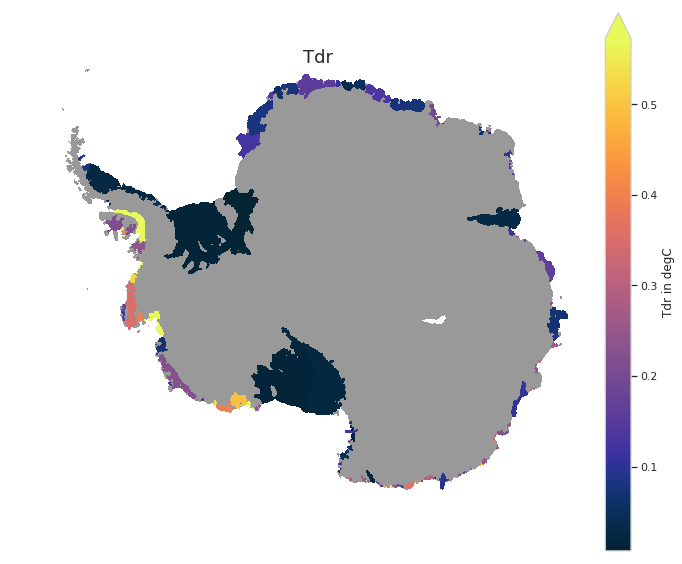

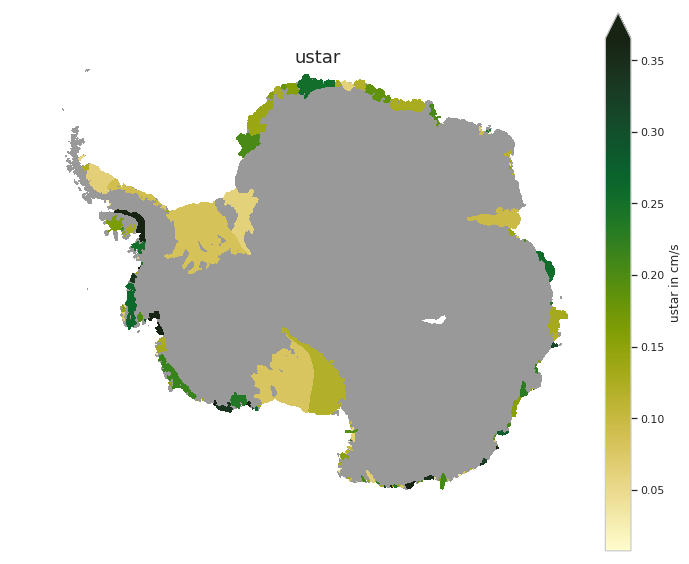

In [316]:
m_cmap = shiftedColorMap(plt.cm.seismic,start = 0.5+(1-(avg['ismr'].max()-avg['ismr'].min())/avg['ismr'].max()))
for df,title,cbt,cmap in [
                        [avg['ismr'],'ismr','ismr in m/yr',m_cmap],
                        [avg['Tfr'],'Tfr','Tfr in degC',ocm.thermal],
                        [avg['Tdr'],'Tdr','Tdr in degC',ocm.thermal],
                        [avg['ustar']*100,'ustar','ustar in cm/s',ocm.speed]
                     ]:
    map_shelves_avg(df,title,cbt,cmap,None,save=True)

## Relations between ice shelf averages

### disregarding outliers using zscore

Tdr z_score > 3:  ['Alison' 'Ferrigno' 'George VI']
ustar z_score > 3:  ['Fox Glacier' 'Thwaites']
ismr z_score > 3:  ['Alison' 'Ferrigno' 'Swinburne' 'Thwaites']
Tfr z_score > 3:  ['Bach' 'George VI' 'Zelee']


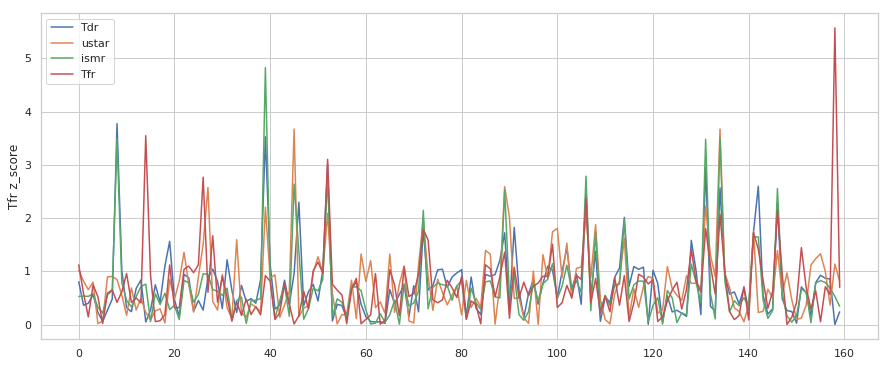

In [317]:
from scipy import stats
avgs = avg.copy()

fig,ax = plt.subplots(figsize=(15,6))
for quant in ['Tdr','ustar','ismr','Tfr']:
    z_score = np.abs(stats.zscore(avg[quant]))
    ax.plot(z_score,label=quant)
    ax.set_ylabel(quant+' z_score')
    ax.legend()
    print(quant+" z_score > 3: ",avg.index.values[z_score>3])
    avgs = avgs.drop(avg[z_score>3].index.values,errors='ignore')

### plotting functions

In [ ]:
# Polynomial Regression
def polyfit(x, y, degree):
    results = {}
    coeffs = np.polyfit(x, y, degree)
     # r-squared
    p = np.poly1d(coeffs)
    # fit values, and mean
    yhat = p(x)                         # or [p(z) for z in x]
    ybar = np.sum(y)/len(y)          # or sum(y)/len(y)
    ssreg = np.sum((yhat-ybar)**2)   # or sum([ (yihat - ybar)**2 for yihat in yhat])
    sstot = np.sum((y - ybar)**2)    # or sum([ (yi - ybar)**2 for yi in y])
    Rsquared = ssreg / sstot
    
    xp =np.linspace(min(x),max(x),100)
    
    return xp,p,Rsquared

def plot_regres(ax,x_all,y_all,deg):
    xp,p,Rsquared = polyfit(x_all,y_all,deg)        
    ax.plot(xp,p(xp),'-')
    ax.text(0.05,0.8,str(p)+'\n($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes)
    
    return p
    
def scatter_shelves_avg(x_all,y_all,title,xlab,ylab,deg,save=False):
    
    plt.close()
    fig,ax = plt.subplots()
    
    ax.scatter(x_all,y_all)
        
    p = plot_regres(ax,x_all,y_all,deg)
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title)
    ax.set_xlim([min(x_all)-0.5*np.std(x_all),max(x_all)+0.5*np.std(x_all)])
    ax.set_ylim([min(y_all)-0.5*np.std(y_all),max(y_all)+0.5*np.std(y_all)])
   
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_shelves_avg_'+title.replace('/','_')+'.png'),format='png',bbox_inches = "tight")    

    plt.show()
    
    return p

### relations between ismr, Tdr and ustar

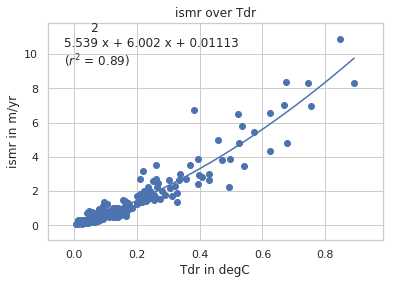

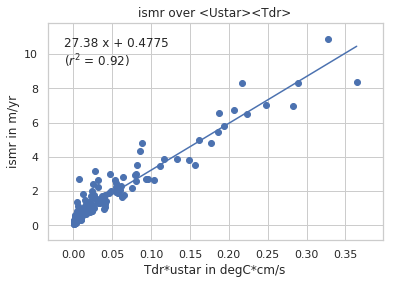

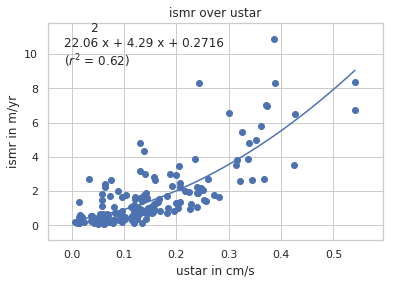

In [457]:
for df_x,df_y,title,xlab,ylab,deg in [
                                      #[avg['Tfr'],avg['ismr'],'ismr over Tfr','Tfr in degC','ismr in m/yr',2],
                                      #[avg['<Tfr><ustar>']*100,avg['ismr'],'ismr over <Ustar><Tfr>','Tfr*ustar in degC*cm/s','ismr in m/yr',1],      
                                      #[avg['<Tfr*ustar>']*100,avg['ismr'],'ismr over <Ustar*Tfr>','Tfr*ustar in degC*cm/s','ismr in m/yr',1],
                                      [avg['Tdr'],avg['ismr'],'ismr over Tdr','Tdr in degC','ismr in m/yr',2],
                                      [avg['<Tdr><ustar>']*100,avg['ismr'],'ismr over <Ustar><Tdr>','Tdr*ustar in degC*cm/s','ismr in m/yr',1],
                                      [avg['ustar']*100,avg['ismr'],'ismr over ustar','ustar in cm/s','ismr in m/yr',2]
                                      #[avg['<Tdr*ustar>']*100,avg['ismr'],'ismr over <Ustar*Tdr>','Tdr*ustar in degC*cm/s','ismr in m/yr',1]
                                        ]:
    scatter_shelves_avg(df_x,df_y,title,xlab,ylab,deg,save=False)

#### realtions between thermal forcing and ustar

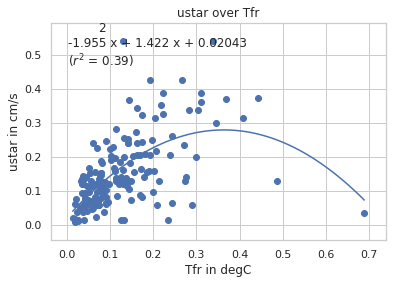

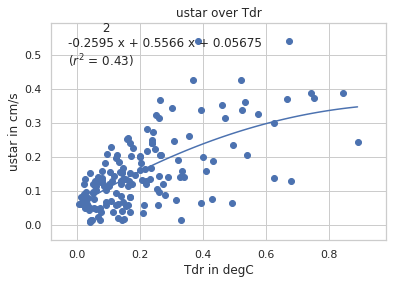

In [459]:
for df_x,df_y,title,xlab,ylab,deg in [[avg['Tfr'],avg['ustar']*100,'ustar over Tfr','Tfr in degC','ustar in cm/s',2],
                                      [avg['Tdr'],avg['ustar']*100,'ustar over Tdr','Tdr in degC','ustar in cm/s',2],
                                      #[avg['Tdr']-avg['Tfr'],avg['ustar']*100,'ustar over Tdr-Tfr','Tdr diff in degC','ustar in cm/s',1]
                                     ]:
    scatter_shelves_avg(df_x,df_y,title,xlab,ylab,deg,save=False)

### effects of salinity diffusion and spatial averaging

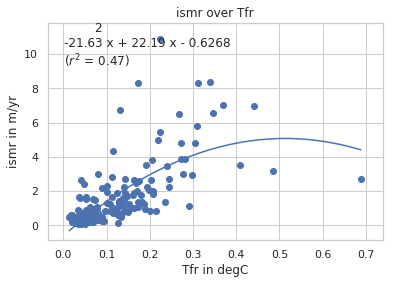

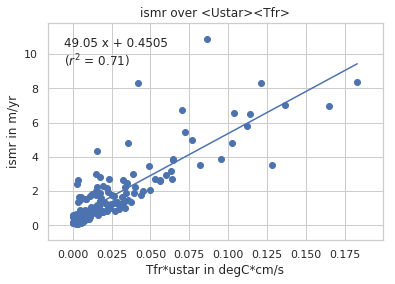

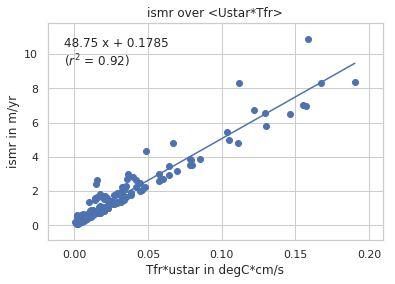

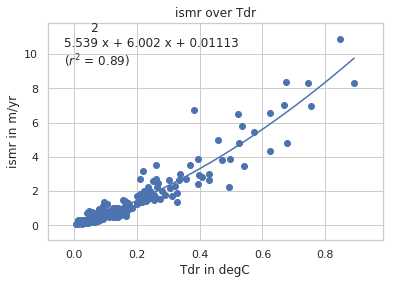

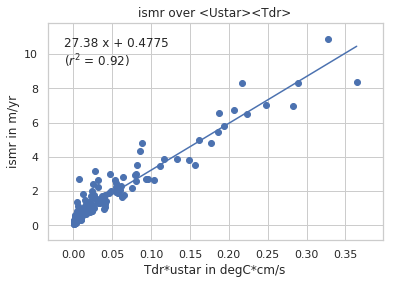

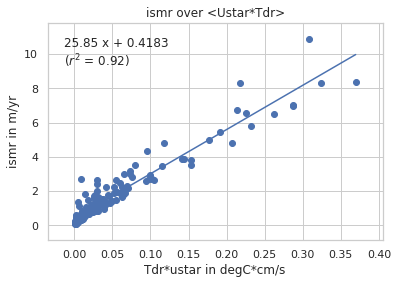

In [415]:
for df_x,df_y,title,xlab,ylab,deg in [
                                      [avg['Tfr'],avg['ismr'],'ismr over Tfr','Tfr in degC','ismr in m/yr',2],
                                      [avg['<Tfr><ustar>']*100,avg['ismr'],'ismr over <Ustar><Tfr>','Tfr*ustar in degC*cm/s','ismr in m/yr',1],      
                                      [avg['<Tfr*ustar>']*100,avg['ismr'],'ismr over <Ustar*Tfr>','Tfr*ustar in degC*cm/s','ismr in m/yr',1],
                                      [avg['Tdr'],avg['ismr'],'ismr over Tdr','Tdr in degC','ismr in m/yr',2],
                                      [avg['<Tdr><ustar>']*100,avg['ismr'],'ismr over <Ustar><Tdr>','Tdr*ustar in degC*cm/s','ismr in m/yr',1],
                                      [avg['<Tdr*ustar>']*100,avg['ismr'],'ismr over <Ustar*Tdr>','Tdr*ustar in degC*cm/s','ismr in m/yr',1]
                                        ]:
    scatter_shelves_avg(df_x,df_y,title,xlab,ylab,deg,save=True)

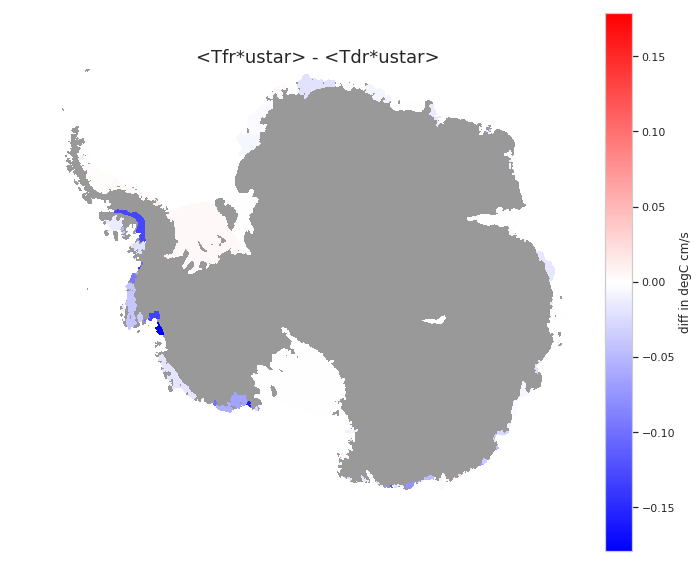

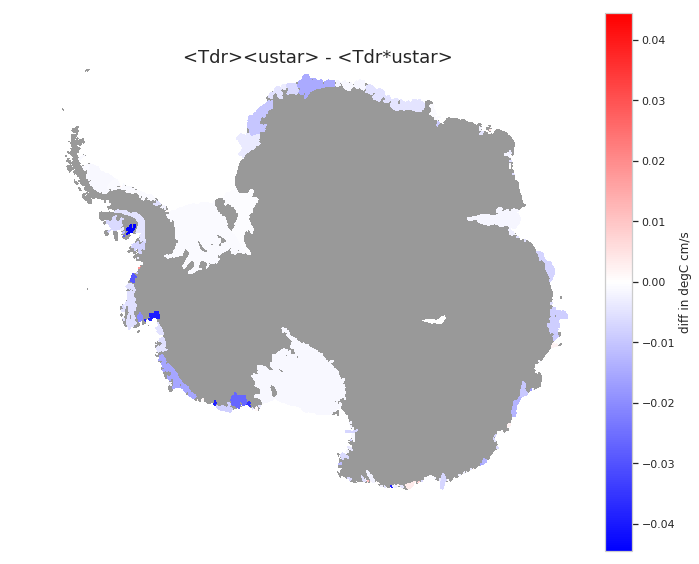

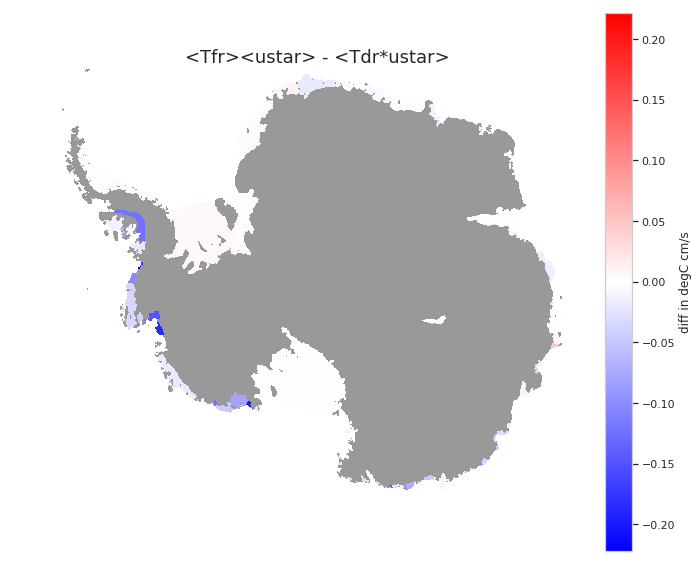

In [495]:
for df,title,cbt,cmap,vrange in [[(avg['<Tfr*ustar>']-avg['<Tdr*ustar>'])*100,'<Tfr*ustar> - <Tdr*ustar>',
                                  "diff in degC cm/s",'bwr','sat'],
                                 #[(avg['<Tfr*ustar>']-avg['<Tdr*ustar>'])*100/avg['<Tdr*ustar>'],
                                 # '(<Tfr*ustar> - <Tdr*ustar>)*100/<Tdr*ustar>',"rel diff in %",'bwr',(-100,100)],
                                 [(avg['Tdr']*avg['ustar']-avg['<Tdr*ustar>'])*100,
                                   '<Tdr><ustar> - <Tdr*ustar>','diff in degC cm/s','bwr','sat'],
                                 #[(avg['Tdr']*avg['ustar']-avg['<Tdr*ustar>'])*100/avg['<Tdr*ustar>'],
                                 #  '(<Tdr><ustar> - <Tdr*ustar>)*100/<Tdr*ustar>','rel diff in %','bwr',(-100,100)],
                                [(avg['Tfr']*avg['ustar']-avg['<Tdr*ustar>'])*100,'<Tfr><ustar> - <Tdr*ustar>',
                                 'diff in degC cm/s','bwr','sat']
                                #[(avg['Tfr']*avg['ustar']-avg['<Tdr*ustar>'])*100/avg['<Tdr*ustar>'],
                                #   '(<Tfr><ustar> - <Tdr*ustar>)*100/<Tdr*ustar>','rel diff in %','bwr',(-100,100)]
                                ]:
    map_shelves_avg(df,title,cbt,cmap,vrange,save=True)

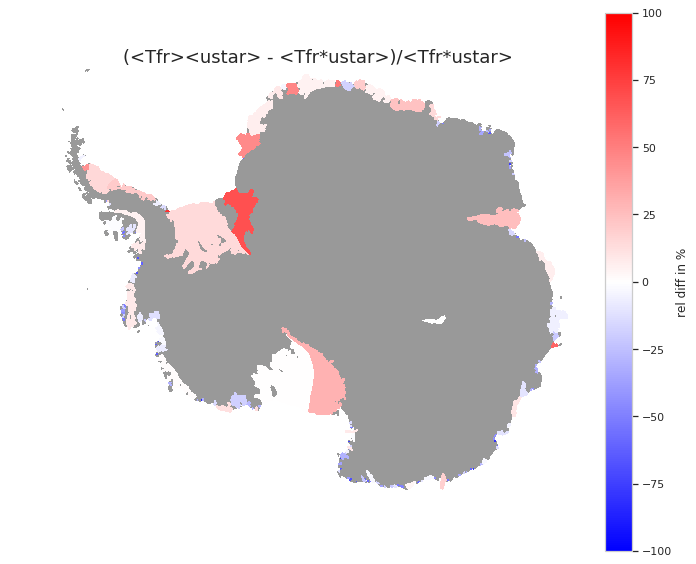

In [478]:
for df,title,cbt,cmap,vrange in [:
    map_shelves_avg(df,title,cbt,cmap,vrange,save=False)

### melt as function of Tfr*ustar(Tfr)

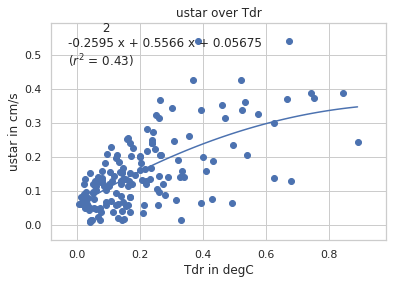

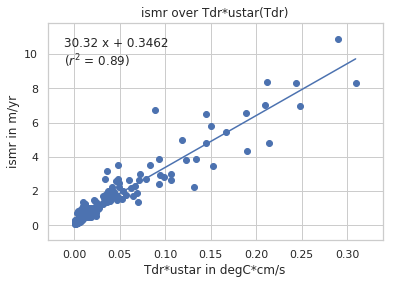

In [424]:
ustar_from_Tdr = scatter_shelves_avg(avg['Tdr'],avg['ustar']*100,'ustar over Tdr','Tdr in degC','ustar in cm/s',2)
avg['Tdr*ustar(Tdr)'] = avg['Tdr']*ustar_from_Tdr(avg['Tdr'])
ismr_from_rel = scatter_shelves_avg(avg['Tdr*ustar(Tdr)'],avg['ismr'],'ismr over Tdr*ustar(Tdr)',
                                    'Tdr*ustar in degC*cm/s','ismr in m/yr',1,True)
avg['ismr_rel'] = ismr_from_rel(avg['Tdr*ustar(Tdr)'])

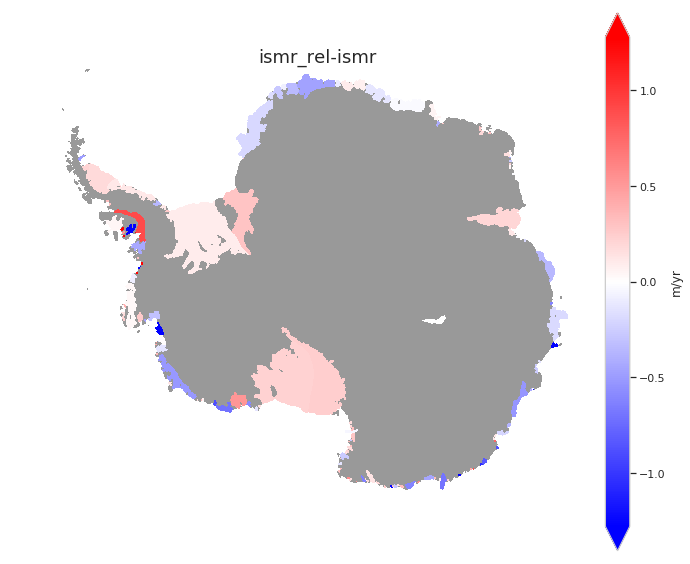

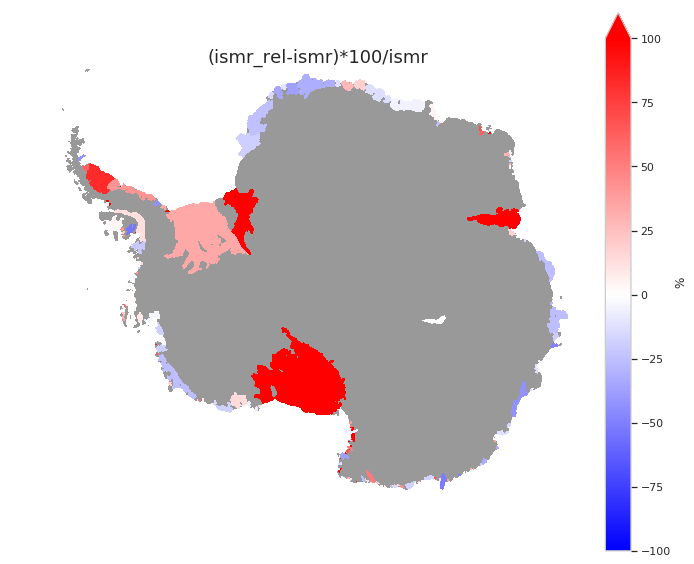

In [484]:
map_shelves_avg((avg['ismr_rel']-avg['ismr']),'ismr_rel-ismr','m/yr','bwr',None,save=True)
map_shelves_avg((avg['ismr_rel']-avg['ismr'])*100/avg['ismr'],'(ismr_rel-ismr)*100/ismr','%','bwr',[-100,100],save=True)

In [486]:
(avg['ismr_rel']-avg['ismr'])[avg['ismr_rel']-avg['ismr']>1]

Alison            1.389228
Britten           2.112954
Fox Ice Stream    1.771783
Hovde             1.117162
Mendelssohn       1.480938
Verdi             2.007758
dtype: float64

# Cavity behaviour

## Temperature at the cavity entry

In [3]:
grd2 = xr.open_dataset(grid_path)
shelves2 = np.load(shelves_masks_path,allow_pickle=True).item()

In [350]:
from scipy.ndimage.morphology import binary_dilation as bd

def make_open_ocean_mask(shelves_dict,grd,iterations=10):
    for key,data in log_progress(shelves_dict.items(),every=2):
        mask_is = data['mask']
        mask_bd = bd(mask_is,iterations=iterations)
        mask_fr = (mask_bd) & (~mask_is) & (grd.mask_rho==1) & (grd.zice==0) 
        shelves_dict[key]['mask_ocean'] = xr.DataArray(mask_fr==1,dims=('eta_rho','xi_rho'))
    return shelves_dict

shelves2 = make_open_ocean_mask(shelves2,grd2,15)

In [ ]:
front_map = np.zeros_like(grd2.mask_rho)
for key,values in log_progress(shelves2.items(),every=2):
        front_map[values['mask_ocean'].values==1]=1
front_map = xr.DataArray(front_map,dims=('eta_rho','xi_rho')).where(front_map==1)
plt.close()

fig,ax = plt.subplots(figsize=(12,10))
ax.axis('off')
ax.set_aspect('equal')
ax.contourf(grd2.mask_rho.where(grd2.mask_rho==0),colors=(('0.6','0.6','0.6')))
ax.contourf(grd2.mask_rho.where((grd2.zice<0)&(grd2.mask_rho==1)),colors=(('0.8','0.8','0.8')))
front_map.plot(ax=ax,add_colorbar=False)
ax.set_ylim([250,2500])
ax.set_xlim([200,2900])
#plt.save()
plt.show()

In [359]:
avg[['Tm','To','So','depth']] = pd.DataFrame.from_dict(shelves2).T[['Tm','Tm_front','Salt_front','depth']].astype(float)

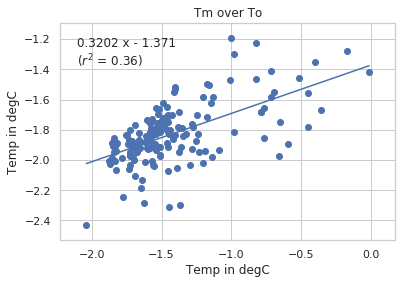

In [371]:
_ = scatter_shelves_avg(avg['To'],avg['Tm'],'Tm over To','Temp in degC','Temp in degC',1,save=False)

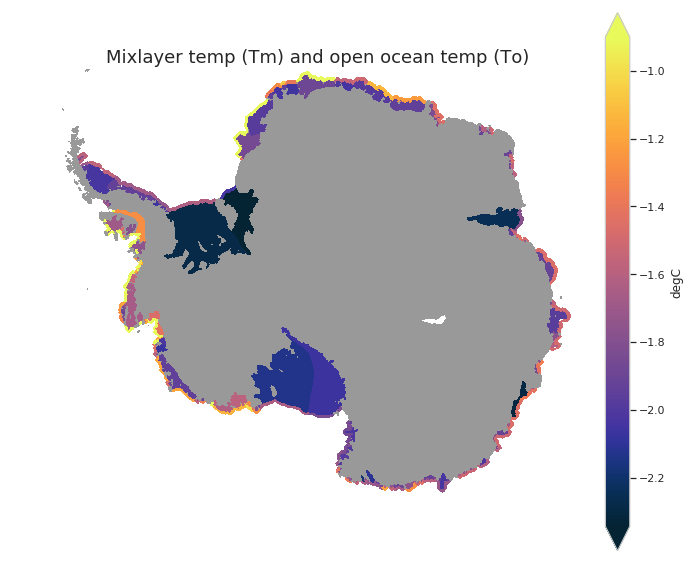

In [217]:
def make_avg_so_map(dfs,dfo):
    shelf_map = np.zeros_like(grd2.mask_rho)
    mask_map = np.zeros_like(shelf_map)
    for k,v in dfs.iteritems():
        shelf_map[shelves2[k]['mask']]=v
        mask_map[shelves2[k]['mask']]=1
    for k,v in dfo.iteritems():
        shelf_map[shelves2[k]['mask_ocean']]=v
        mask_map[shelves2[k]['mask_ocean']]=1
        
    return xr.DataArray(shelf_map,dims=('eta_rho','xi_rho')).where(mask_map)

shelf_map = make_avg_so_map(avg['Tm'],avg['To'])

vrange = None

plt.close()
fig,ax = plt.subplots(figsize=(10,8))
ax.axis('off')
ax.set_aspect('equal')
ax.contourf(grd2.mask_rho.where(grd2.mask_rho==0),colors=(('0.6','0.6','0.6')))
all_temps = np.hstack([avg['To'].values,avg['Tm'].values])
if vrange==None:
    mean = all_temps.mean()
    std = all_temps.std()
    vmin=max(all_temps.min(),mean-2*std)
    vmax=min(all_temps.max(),mean+2*std)
elif vrange=='sat':
    vmax = max(all_temps.max(),np.abs(all_temps.min()))
    vmin = -vmax
else:
    vmin,vmax=vrange

plot = shelf_map.plot(ax=ax,vmin=vmin,vmax=vmax,cmap=ocm.thermal,cbar_kwargs={'label': "degC"})


ax.set_title('Mixlayer temp (Tm) and open ocean temp (To)',fontsize=18)
ax.set_ylim([250,2500])
ax.set_xlim([200,2900])
plt.tight_layout()
#plt.savefig(os.path.join(fig_dir,'avgmap_'+'Mixlayer temp (Tm) and open ocean temp (To)'.replace(' ','_')+'.png'),format='png',bbox_inches = "tight")
plt.show()

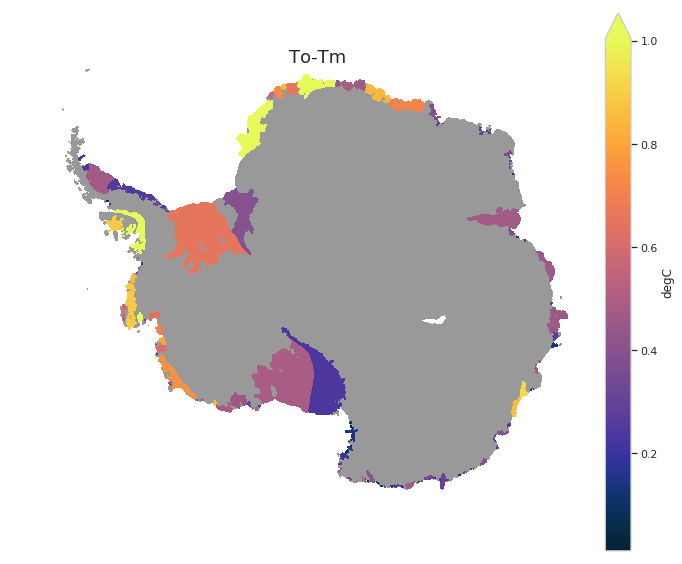

In [496]:
map_shelves_avg(avg.To-avg.Tm,'To-Tm','degC',ocm.thermal,None,save=True)

## Open ocean thermal driving and cavity sensitivity to ocean warming

In [366]:
def calc_Tstar(Tm,zice,Sm):
    a = -0.057
    b = 0.0939
    c = 7.61e-4
    return Tm - (a*Sm + b + c*zice)

avg['Tdro'] = calc_Tstar(avg['To'],avg['depth'],avg['So'])
avg['omega'] = avg['ismr'] / avg['Tdro']

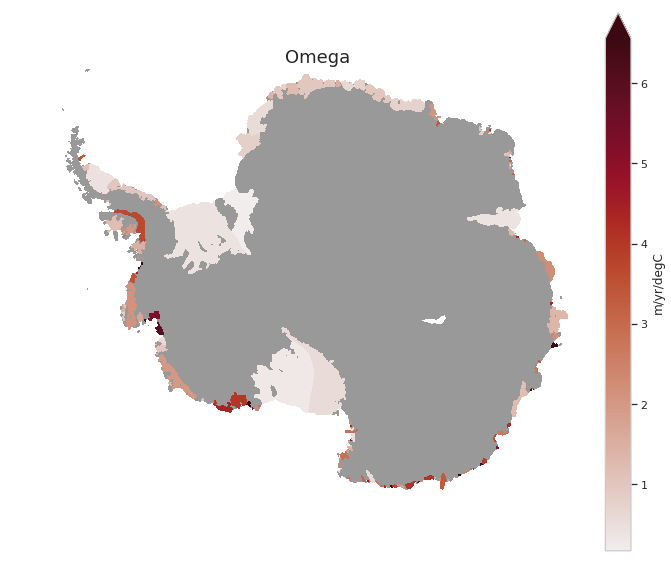

In [498]:
#map_shelves_avg(avg['Tdro'],'Thermal driving from the open ocean (Tdro)','degC',ocm.thermal,None,save=True)
map_shelves_avg(avg['omega'],'Omega','m/yr/degC',ocm.amp,None,save=True)

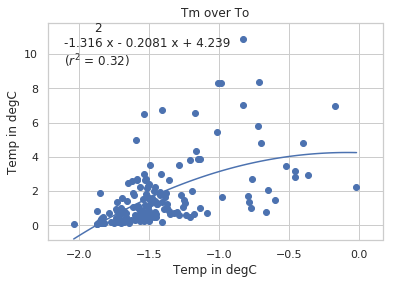

In [505]:
_ = scatter_shelves_avg(avg['To'],avg['ismr'],'Tm over To','Temp in degC','Temp in degC',2,save=False)

### Relation of cavity sensitivity to other parameters

In [380]:
def drop_outlier(df,x,y,txt=False):
    df_tmp = df.copy()
    for quant in [x,y]:
        z_score = np.abs(stats.zscore(df[quant]))
        if txt:
            print(quant+" z_score > 3: ",df.index.values[z_score>3])
        df_tmp = df_tmp.drop(df[z_score>3].index.values,errors='ignore')    
    return df_tmp

def scatter_shelves_avg_out(df,x,y,title,xlab,ylab,deg,save=False):
    df_sel = drop_outlier(df,x,y,txt=True)
    rel = scatter_shelves_avg(df_sel[x],df_sel[y],title,xlab,ylab,deg,save=False)
    return rel

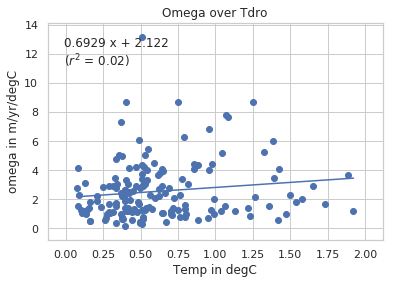

In [407]:
_ = scatter_shelves_avg(avg['Tdro'],avg['omega'],'Omega over Tdro','Temp in degC','omega in m/yr/degC',1,save=True)

In [ ]:
ubar_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_ubar_avg.nc')
vbar_path = os.path.join(data_dir,'analysis','raw','waom2','ocean_avg_0538-0610_vbar_avg.nc')

ubar = xr.open_dataset(ubar_path).ubar.squeeze()
vbar = xr.open_dataset(vbar_path).vbar.squeeze()

def make_uv_mag(u, v):

    # Interpolate u to the rho-grid
    w_bdry_u = u[:,0]
    middle_u = 0.5*(u[:,0:-1] + u[:,1:])
    e_bdry_u = u[:,-1]
    u_rho = np.ma.concatenate((w_bdry_u[:,np.newaxis], middle_u, e_bdry_u[:,np.newaxis]), axis=1)
    # Interplate v to the rho-grid
    s_bdry_v = v[0,:]
    middle_v = 0.5*(v[0:-1,:] + v[1:,:])
    n_bdry_v = v[-1,:]
    v_rho = np.ma.concatenate((s_bdry_v[np.newaxis,:], middle_v, n_bdry_v[np.newaxis,:]), axis=0)

    return xr.DataArray(xr.ufuncs.sqrt(xr.ufuncs.square(u_rho)+xr.ufuncs.square(v_rho)),dims=('eta_rho','xi_rho'))

ubar_mag = make_uv_mag(ubar.values,vbar.values)

A = (grd2.pm*grd2.pn)**-1
avg['u'] = np.nan
avg['u_tide'] = np.nan

for k,v in log_progress(shelves2.items(),every=2):
    mask = v['mask']
    weights = A.where(mask)/A.where(mask).sum()
    avg['u'][k]=(ubar_mag*weights).sum().values
    avg['u_tide'][k] = shelves2[k]['tv4']
    
avg['u+u_tide'] = avg['u'] + avg['u_tide']

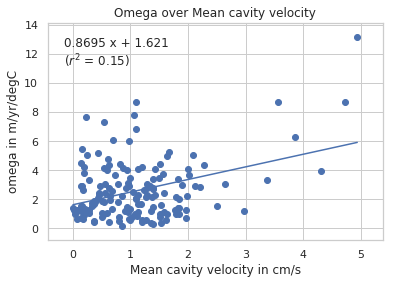

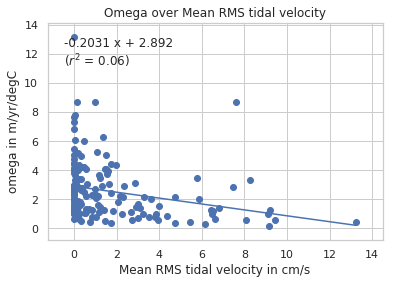

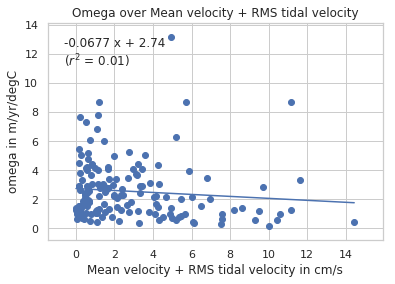

In [405]:
for name,tit in [['u','Mean cavity velocity'],
                    ['u_tide','Mean RMS tidal velocity'],
                    ['u+u_tide','Mean velocity + RMS tidal velocity']]:
    scatter_shelves_avg(avg[name]*100,avg['omega'],'Omega over '+tit,
                        tit+' in cm/s','omega in m/yr/degC',1,True)

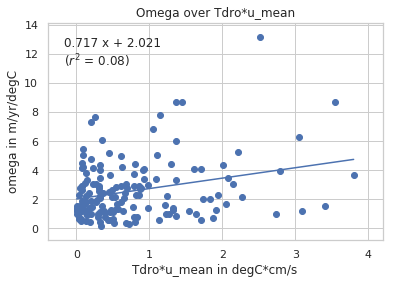

In [467]:
_ = scatter_shelves_avg(avg['Tdro']*avg['u']*100,avg['omega'],'Omega over Tdro*u_mean','Tdro*u_mean in degC*cm/s',
                        'omega in m/yr/degC',1,save=False)

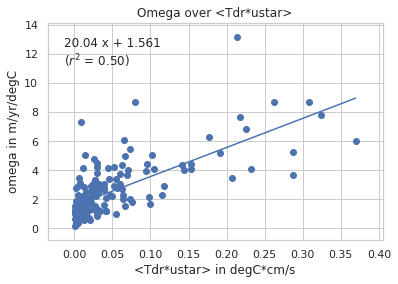

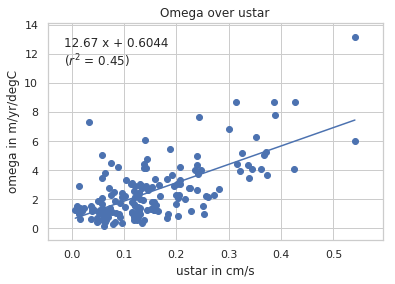

In [406]:
_ = scatter_shelves_avg(avg['<Tdr*ustar>']*100,avg['omega'],'Omega over <Tdr*ustar>','<Tdr*ustar> in degC*cm/s',
                        'omega in m/yr/degC',1,save=True)
_ = scatter_shelves_avg(avg['ustar']*100,avg['omega'],'Omega over ustar','ustar in cm/s',
                        'omega in m/yr/degC',1,save=True)

# Leftovers


#### Omega vs velocities (tidal, cavity, front)

In [453]:
out_path = os.path.join(tab_dir,'avg.csv')
avg.to_csv(out_path)

In [475]:
avg['sector']

KeyError: 'sector'

NameError: name 'ubar' is not defined

In [45]:


for k,v in log_progress(shelves2.items(),every=2):
    mask = v['front_mask']
    weights = grd2.dV.where(mask)/grd2.dV.where(mask).sum()
    shelves2[k]['u_front']=(u_mag*weights).sum()
    
avg['u'] = pd.DataFrame.from_dict(shelves2).T['u'].astype(float)    
avg['u_front'] = pd.DataFrame.from_dict(shelves2).T['u_front'].astype(float)
avg['u+u_tide'] = avg['tv4']+avg['u'][avg['tv4']]
avg['u+u_tide'] = avg['tv4']+avg['u'][avg['tv4'].index]

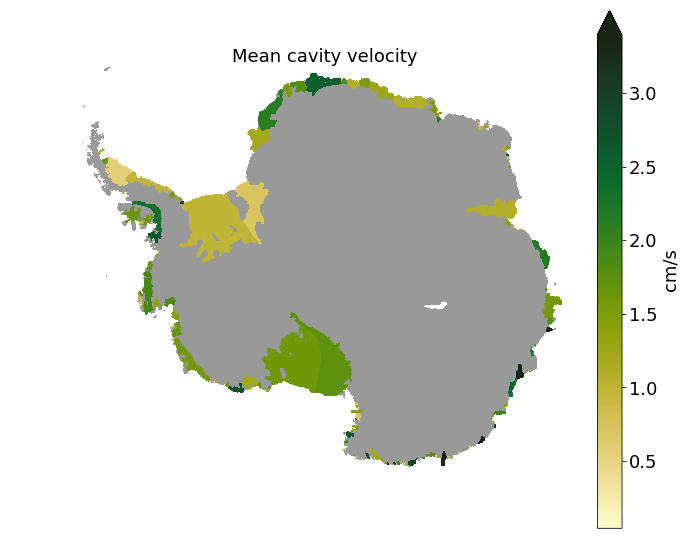

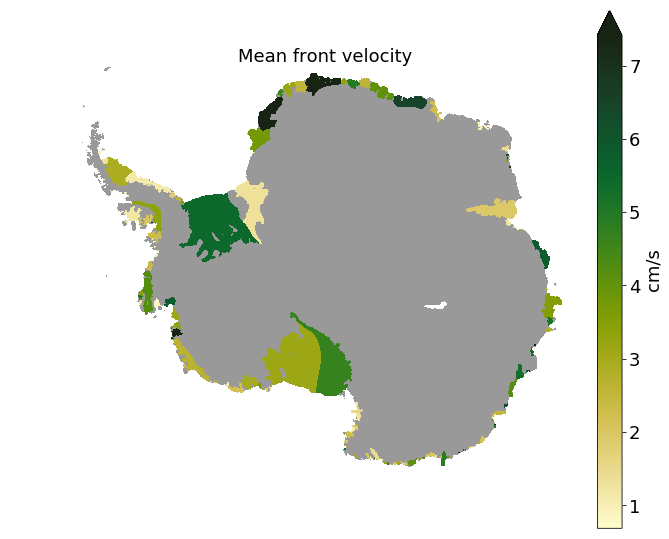

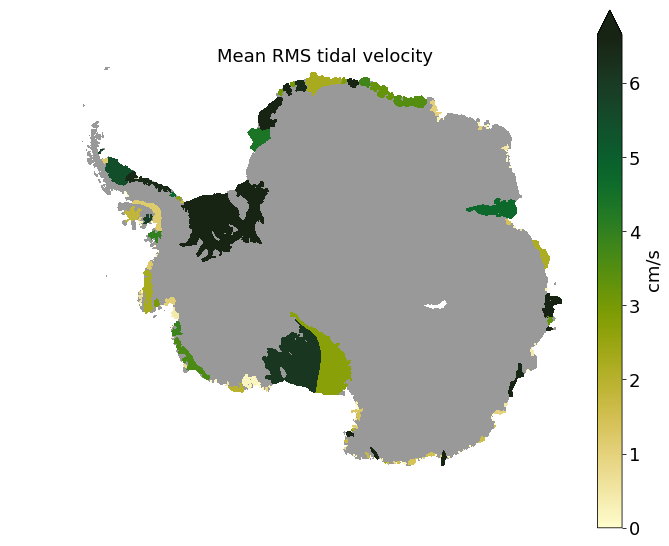

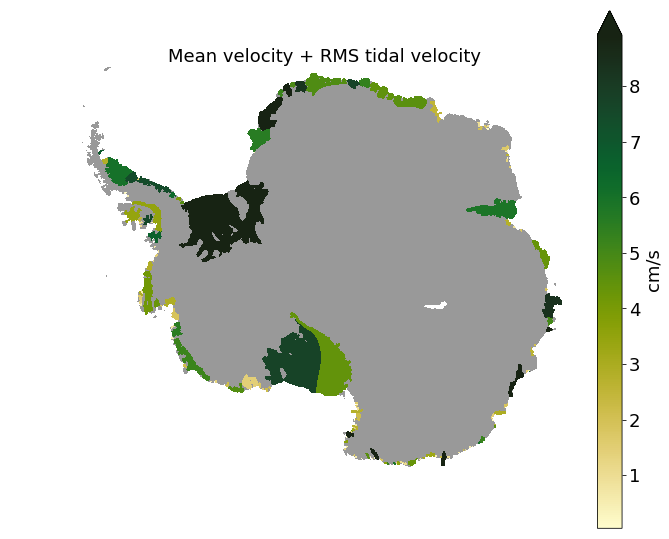

In [66]:
for name,tit in [['u','Mean cavity velocity'],
                    ['u_front','Mean front velocity'],
                    ['tv4','Mean RMS tidal velocity'],
                    ['u+u_tide','Mean velocity + RMS tidal velocity']]:
    map_shelves_avg(avg[name]*100,tit,'cm/s',ocm.speed,None,save=False)

Omega z_score > 3:  ['Conger Glenzer' 'Ferrigno' 'Fox Glacier' 'Matusevitch']
u z_score > 3:  ['Conger Glenzer' 'Fox Glacier' 'Matusevitch' 'PourquoiPas']


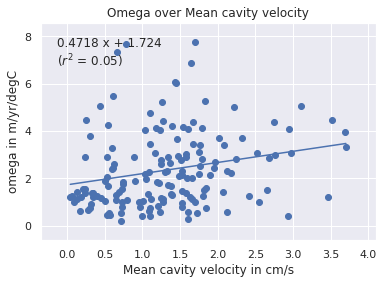

Omega z_score > 3:  ['Conger Glenzer' 'Ferrigno' 'Fox Glacier' 'Matusevitch']
u_front z_score > 3:  ['Fimbul' 'Riiser-Larsen']


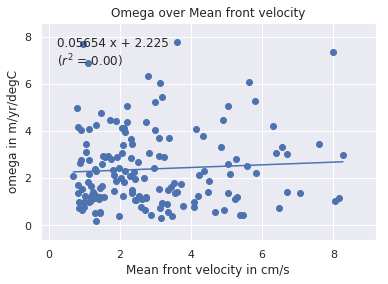

Omega z_score > 3:  ['Conger Glenzer' 'Ferrigno' 'Fox Glacier' 'Matusevitch']
tv4 z_score > 3:  ['Filchner' 'Moscow University' 'Rennick' 'Ronne']


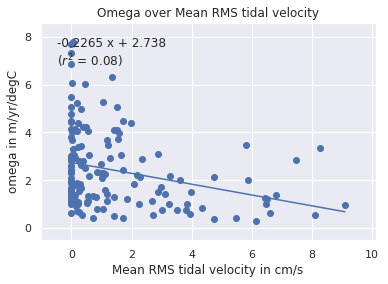

Omega z_score > 3:  ['Conger Glenzer' 'Ferrigno' 'Fox Glacier' 'Matusevitch']
u+u_tide z_score > 3:  ['Conger Glenzer' 'Mertz' 'Ronne']


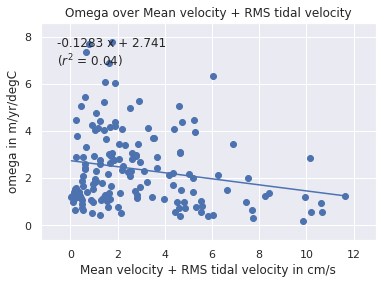

In [74]:
sns.set();
for name,tit in [['u','Mean cavity velocity'],
                    ['u_front','Mean front velocity'],
                    ['tv4','Mean RMS tidal velocity'],
                    ['u+u_tide','Mean velocity + RMS tidal velocity']]:
    
    avg_sel = drop_outlier(avg,'Omega',name,True)
    scatter_shelves_avg(avg_sel[name]*100,avg_sel['Omega']*s2a,'Omega over '+tit,
                        tit+' in cm/s','omega in m/yr/degC',1)

#### Omega vs u* and u*(Tfr)

In [73]:
avg['ustar(Tfro)'] = ustar_from_Tfr(avg['Tfro'])

NameError: name 'ustar_from_Tfr' is not defined

Omega z_score > 3:  ['Conger Glenzer' 'Ferrigno' 'Fox Glacier' 'Matusevitch']
ustar z_score > 3:  ['Fox Glacier' 'Thwaites']


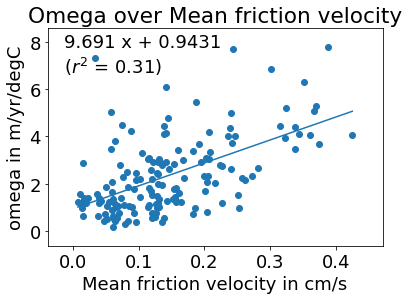

Omega z_score > 3:  ['Conger Glenzer' 'Ferrigno' 'Fox Glacier' 'Matusevitch']


KeyError: 'ustar(Tfro)'

In [71]:
for name,tit in [['ustar','Mean friction velocity'],
                    ['ustar(Tfro)','Mean friction velocity from ustar(Tfro)']]:
    
    avg_sel = drop_outlier(avg,'Omega',name,True)
    scatter_shelves_avg(avg_sel[name]*100,avg_sel['Omega']*s2a,'Omega over '+tit,
                        tit+' in cm/s','omega in m/yr/degC',1)

## Temperatures at the calving front and their relation to melting

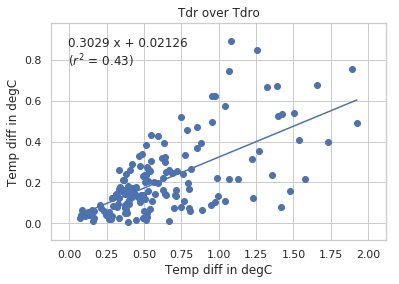

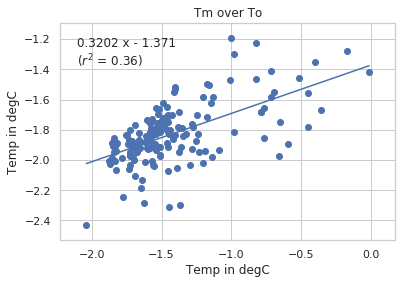

In [195]:
Tdr_from_Tdro = scatter_shelves_avg(avg['Tdro'],avg['Tdr'],'Tdr over Tdro','Temp diff in degC','Temp diff in degC',1,save=False)
Tm_from_To = scatter_shelves_avg(avg['To'],avg['Tm'],'Tm over To','Temp in degC','Temp in degC',1,save=False)

In [192]:
avg['Tdr(Tdro)'] = Tdr_from_To(avg['Tdro'])
avg['ustar(Tdro)'] = ustar_from_Tdr(avg['Tdr(Tdro)'])

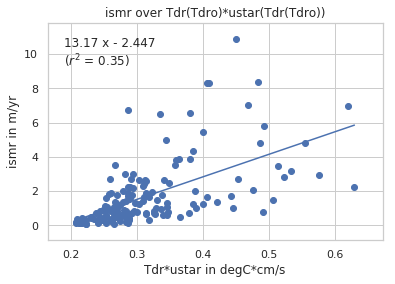

In [226]:
ismr_from_rel2 = scatter_shelves_avg(avg['Tdr(Tdro)']*avg['ustar(Tdro)'],avg['ismr'],'ismr over Tdr(Tdro)*ustar(Tdr(Tdro))','Tdr*ustar in degC*cm/s','ismr in m/yr',1,save=False)
avg['ismr_rel2'] = ismr_from_rel2(avg['Tdr(Tdro)']*avg['ustar(Tdro)'])

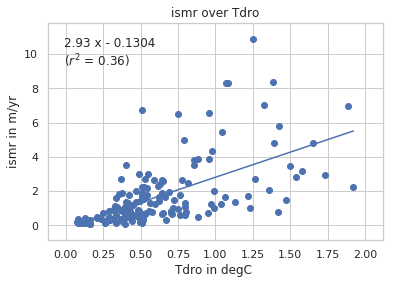

In [197]:
ismr_from_rel3 = scatter_shelves_avg(avg['Tdro'],avg['ismr'],'ismr over Tdro','Tdro in degC ','ismr in m/yr',1,save=False)
avg['ismr_rel3'] = ismr_from_rel3(avg['Tdro'])

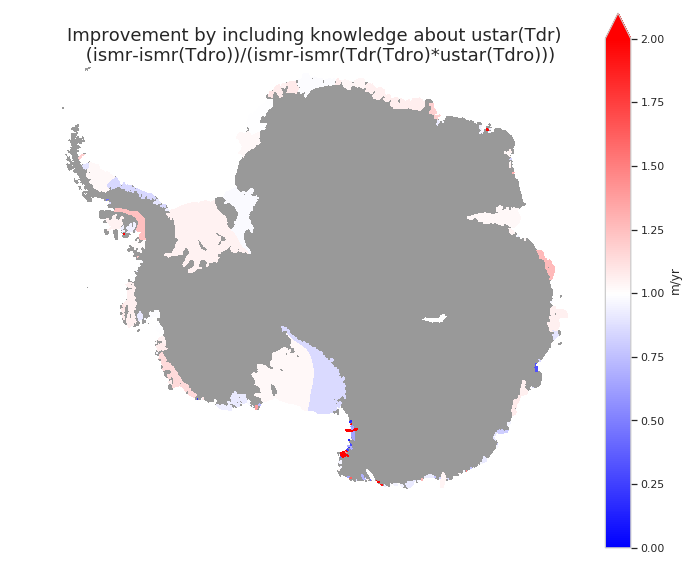

In [222]:
map_shelves_avg(abs(avg['ismr']-avg['ismr_rel3'])/abs(avg['ismr']-avg['ismr_rel2']),'Improvement by including knowledge about ustar(Tdr) \n (ismr-ismr(Tdro))/(ismr-ismr(Tdr(Tdro)*ustar(Tdro)))','m/yr','bwr',[0,2],save=False)

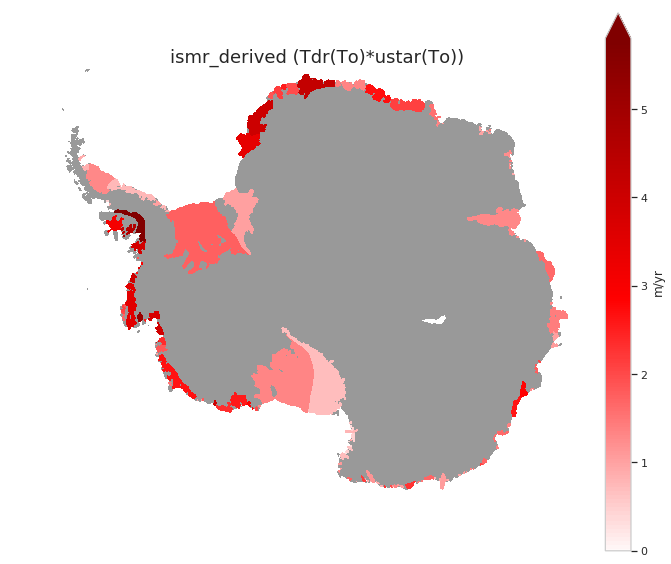

In [219]:
map_shelves_avg(avg['ismr_rel2'],'ismr_derived (Tdr(To)*ustar(To))','m/yr',m_cmap,[0,5.8],save=True)

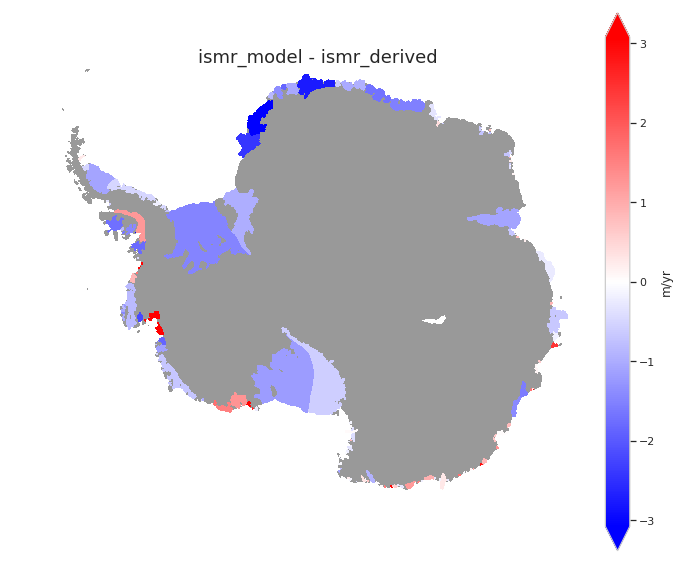

In [225]:
map_shelves_avg(avg['ismr']-avg['ismr_rel2'],'ismr_model - ismr_derived','m/yr','bwr',None,save=False)

In [296]:
scatter_shelves_avg?

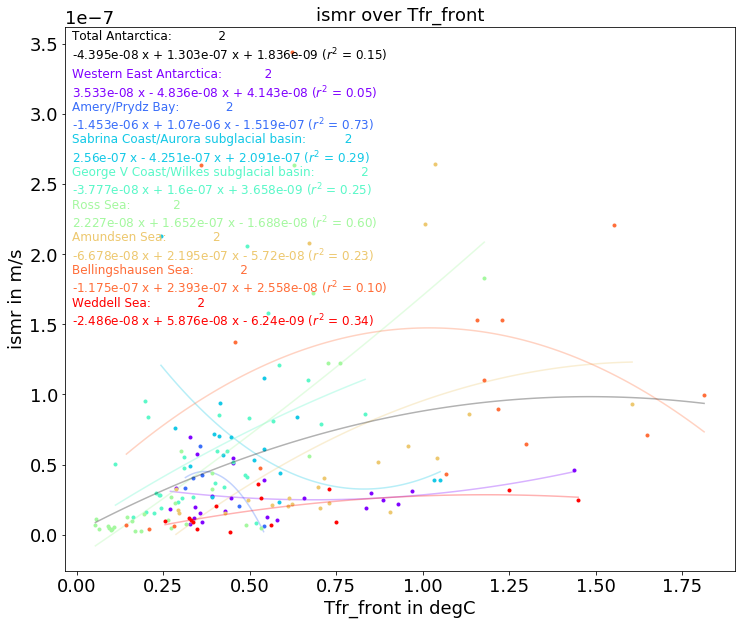

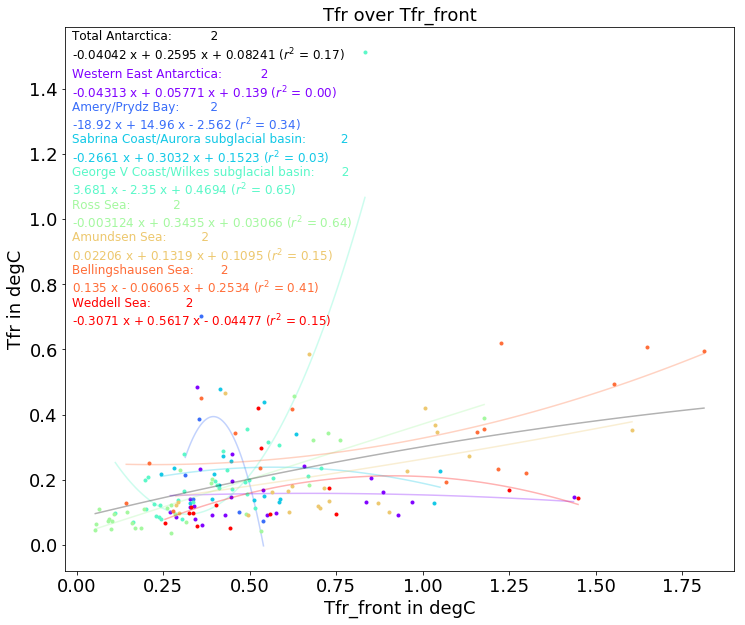

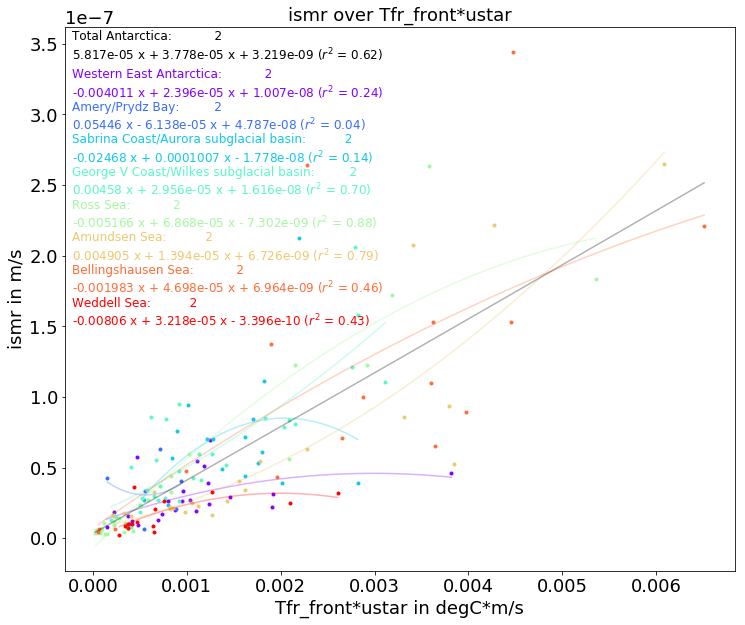

In [298]:
for x_name,xlab,y_name,ylab in zip(['Tfr_front','Tfr_front','Tfr_front*ustar'],
                                    ['degC','degC','degC*m/s'],
                                    ['ismr','Tfr','ismr'],
                                    ['m/s','degC','m/s']):
    scatter_shelves_avg(x_name,y_name,y_name+' over '+x_name,x_name+' in '+xlab,y_name+' in '+ylab,save=True)

## improving melt as a function of thermal forcing alone using ice shelf classification

In [ ]:
for k,v in shelves2.items():
        shelves2[k]['Tfr*ustar(Tfr)'] = v['Tfr']*regress['ustar('+x_name+')']['Total Antarctica'](v[x_name])

In [256]:
def get_regress(x_name,y_name,shelves_dict=shelves2,sector_dict=sector2):
    
    regress = {}
    x_all = []
    y_all = []
    
    for sec_key,sec_data in sector_dict.items():
        
        if sec_key=='Total Antarctica': continue
        
        x_sec = []
        y_sec = []
        
        shelves_dict_sel = {k:v for k,v in shelves_dict.items() if v['sector']==sec_key}

        for shelf_key,shelf_data in shelves_dict_sel.items():

            x = shelf_data[x_name]
            y = shelf_data[y_name]

            x_sec.append(x)
            y_sec.append(y)
            
            x_all.append(x)
            y_all.append(y)
    
        x_sec = np.array(x_sec).squeeze()
        y_sec = np.array(y_sec).squeeze()
    
        x,p,r2 = polyfit(x_sec,y_sec,2)
        regress[sec_key] = p   

    x_all = np.array(x_all).squeeze()
    y_all = np.array(y_all).squeeze()
    
    x,p,r2 = polyfit(x_all,y_all,2)
    regress['Total Antarctica'] = p  
    
    return regress

In [257]:
regress = {}
mean = np.mean([shelves2[k]['ustar'] for k,v in shelves2.items()])
for x_name in ['Tfr','Tdr']:
    regress['ustar('+x_name+')'] = get_regress(x_name,'ustar')
    
    for k,v in shelves2.items():
        shelves2[k][x_name+'*ustar('+x_name+')'] = v[x_name]*regress['ustar('+x_name+')']['Total Antarctica'](v[x_name])
        shelves2[k][x_name+'*ustar('+x_name+')_sec'] = v[x_name]*regress['ustar('+x_name+')'][v['sector']](v[x_name])
        shelves2[k][x_name+'*ustar_mean'] = v[x_name]*ustar_mean['Total Antarctica']
        shelves2[k][x_name+'*ustar_mean_sec'] = v[x_name]*ustar_mean[v['sector']]

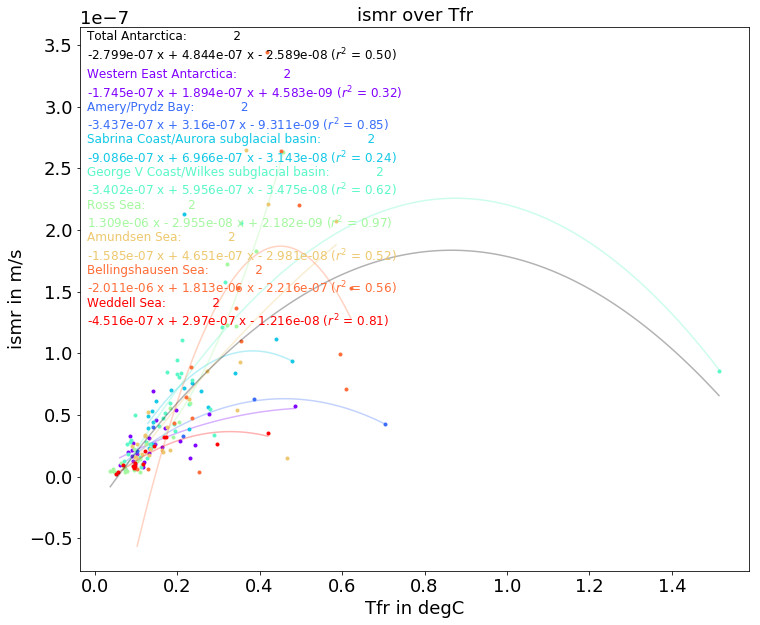

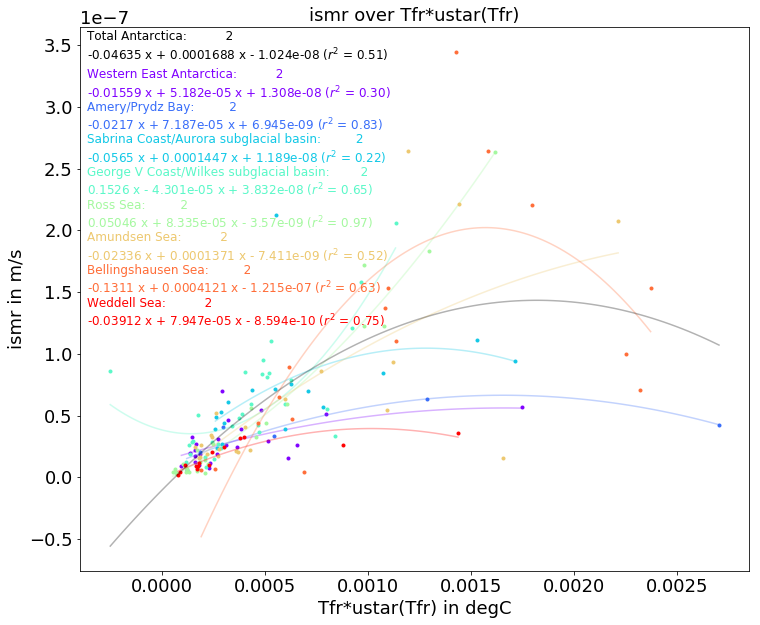

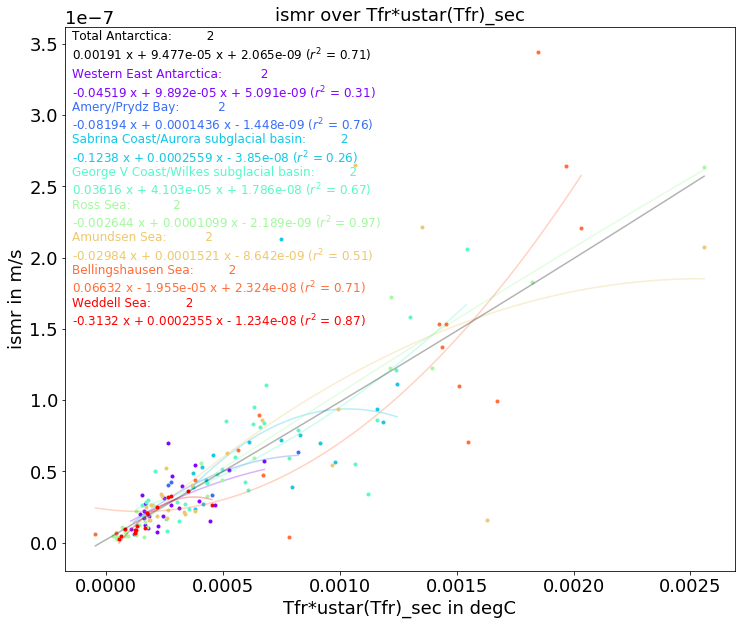

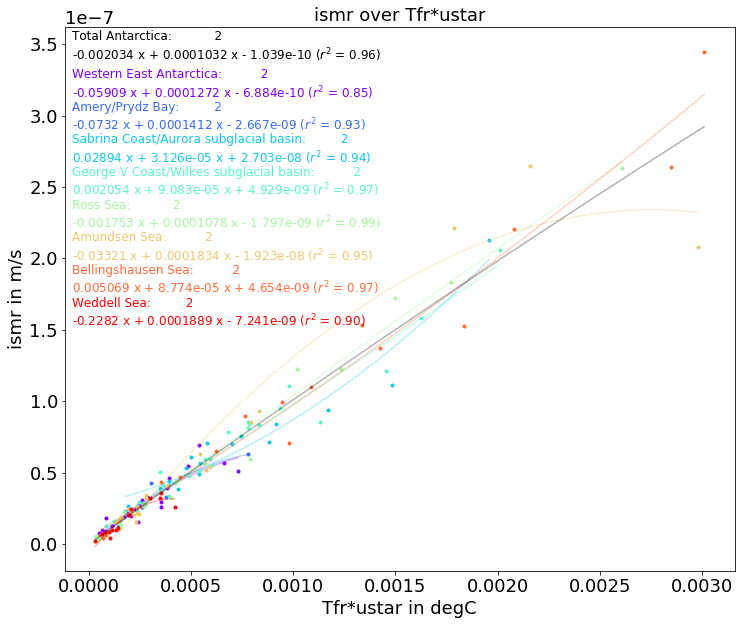

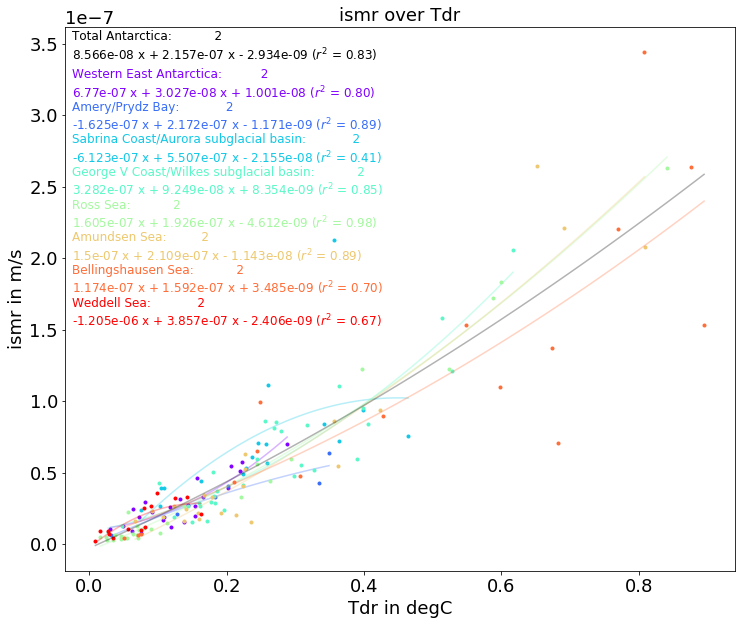

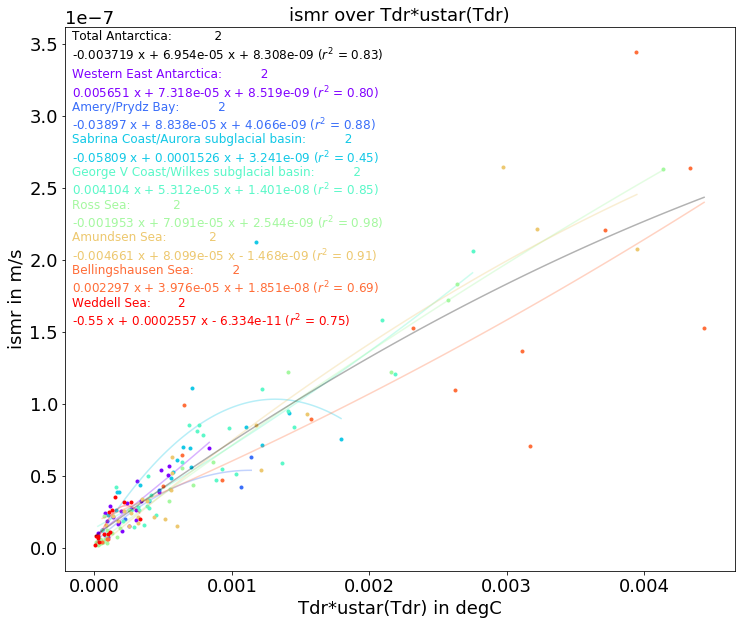

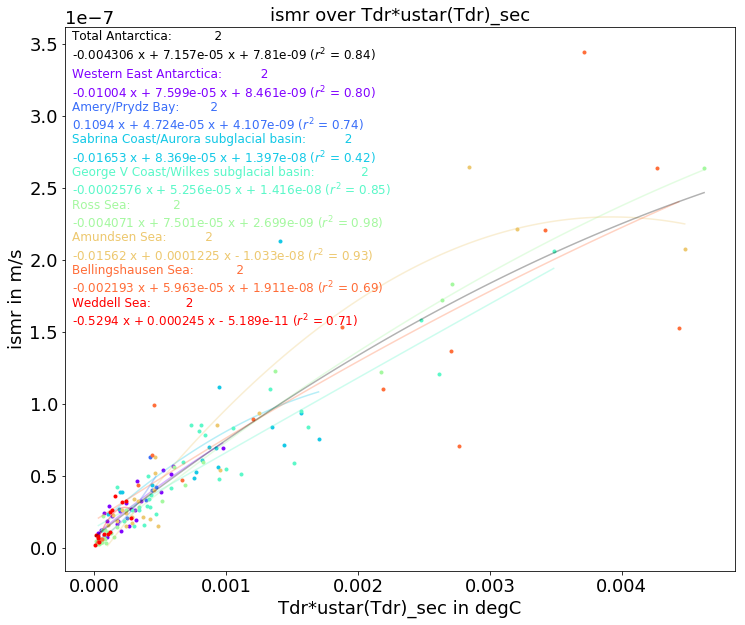

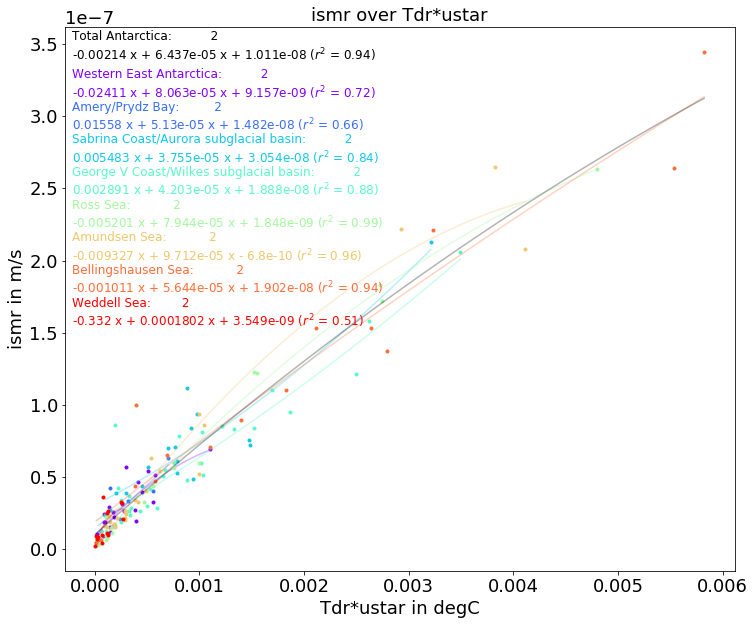

In [175]:
for x1 in ['Tfr','Tdr']:
    for x2 in [x1,x1+'*ustar('+x1+')',x1+'*ustar('+x1+')_sec',x1+'*ustar']:
        scatter_shelves_avg(x2,'ismr','ismr over '+x2,x2+' in '+xlab,'ismr in m/s')

In [258]:
def scatter_improve(x1,x2,x3,y_quant,title,xlab,ylab,shelves_dict=shelves2,save=False,big=False):
    
    matplotlib.rcParams.update({'font.size': 18})
    
    plt.close()
    fig,ax = plt.subplots(figsize=(12,10))
    
    x_ar={}
    y_ar={}
    
    for x_key,c,pos in zip([x1,x2,x3],['r','g','k'],[0.9,0.8,0.7]):
        
        x_all=[]
        y_all=[]

        for shelf_key,data in shelves2.items():
        
            if x_key == x1:
                x_ar[shelf_key]=[]
                y_ar[shelf_key]=[]
        
            x=shelves_dict[shelf_key][x_key]
            y=shelves_dict[shelf_key][y_quant]
                   
            ax.plot(x,y,'.',c=c)
            #if res == '2':
            #    ax.annotate(key,(x,y),size='x-small')

            x_ar[shelf_key].append(x)
            y_ar[shelf_key].append(y)
        
            x_all.append(x)
            y_all.append(y)
            
        x_all = np.array(x_all).squeeze()
        y_all = np.array(y_all).squeeze()
    
        xp,p,Rsquared = polyfit(x_all,y_all,2)        
        ax.plot(xp,p(xp),'-',label='constrained poly fit',alpha=0.3,c=c)
        ax.text(0.01,pos,x_key+': '+str(p)+'\n ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,
                fontsize=12,color=c)       

        #xp,p,Rsquared = polyfit(x_all,y_all,1)        
        #ax.plot(xp,p(xp),'-',label='constrained poly fit',alpha=0.3,c=c)
        #ax.text(0.1,pos-0.05,str(p)+'\n ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,
        #        fontsize=12,color=c,alpha=0.3)      
    
    for key in x_ar:
        ax.annotate("", xy=(x_ar[key][1],y_ar[key][1]), xytext=(x_ar[key][0],y_ar[key][0]),
                    arrowprops=dict(arrowstyle="->",color='k',alpha=0.3))
        ax.annotate("", xy=(x_ar[key][2],y_ar[key][2]), xytext=(x_ar[key][1],y_ar[key][1]),
                        arrowprops=dict(arrowstyle="->",color='k',alpha=0.3))
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title,fontsize=18)
    
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_improve_'+title.replace('/','_').replace(' ','_')+'.png'),format='png',dpi=400,bbox_inches = "tight")    
    plt.show()

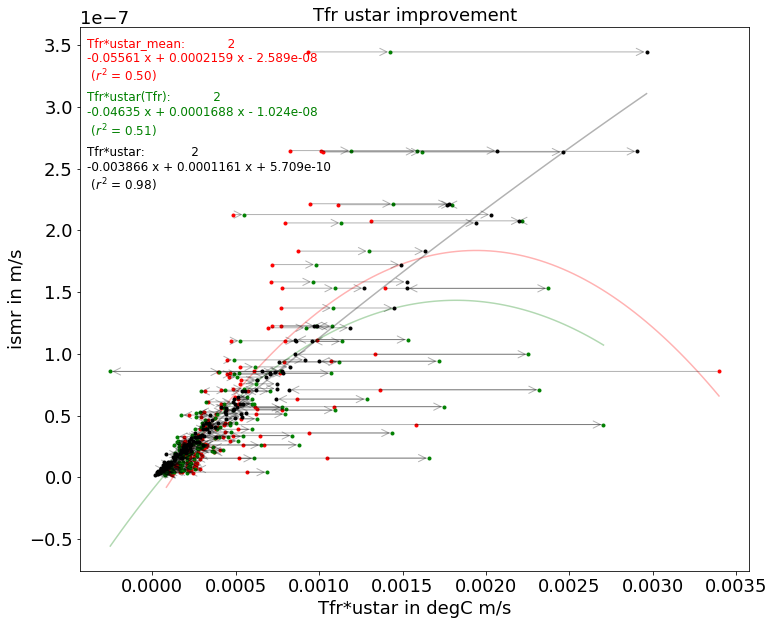

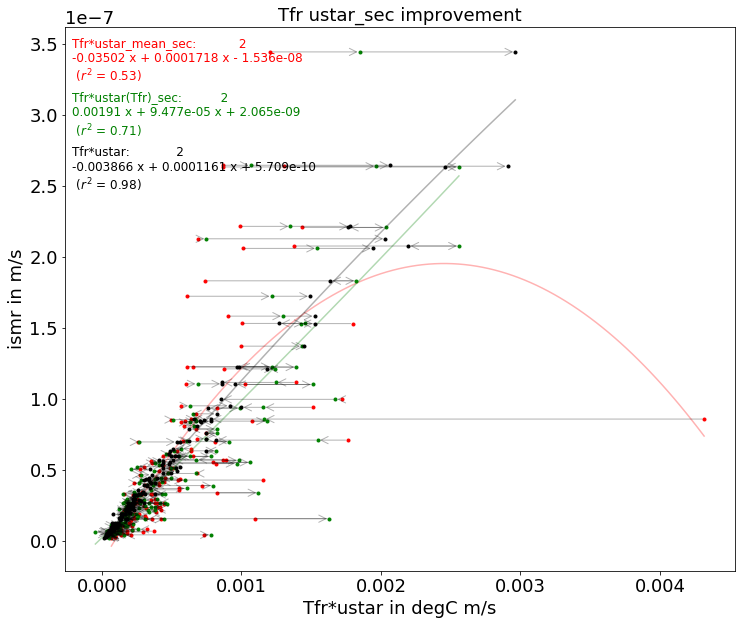

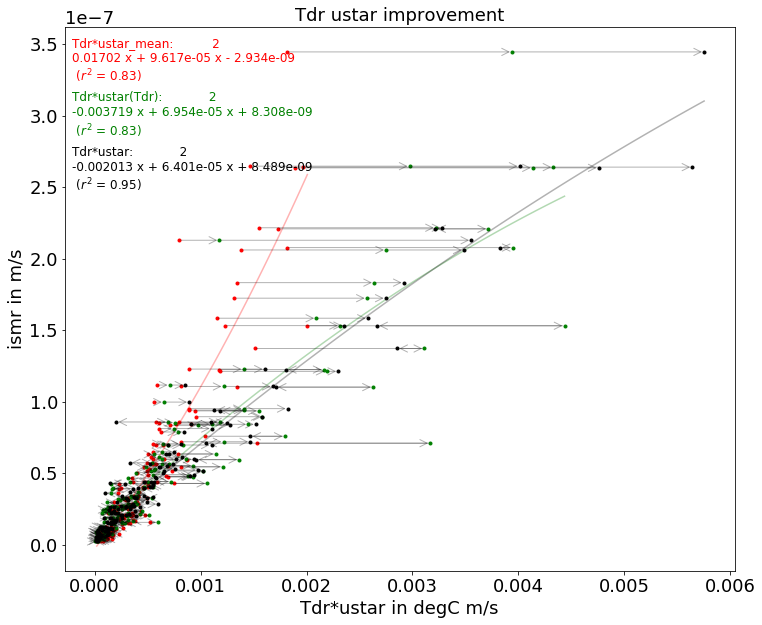

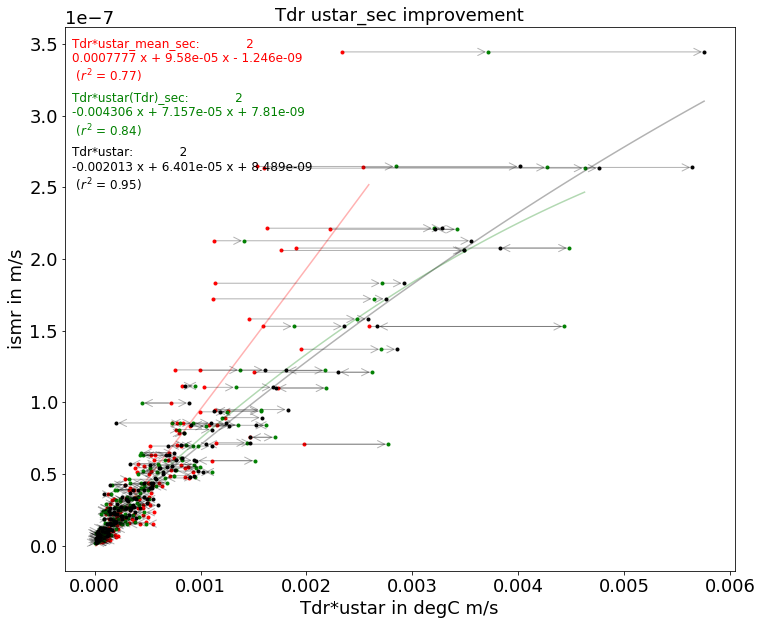

In [259]:
for x1 in ['Tfr','Tdr']:
    scatter_improve(x1+'*ustar_mean',x1+'*ustar('+x1+')',x1+'*ustar','ismr',x1+' ustar improvement',x1+'*ustar in degC m/s','ismr in m/s',save=True)
    scatter_improve(x1+'*ustar_mean_sec',x1+'*ustar('+x1+')_sec',x1+'*ustar','ismr',x1+' ustar_sec improvement',x1+'*ustar in degC m/s','ismr in m/s',save=True)

## ice shelf categories

In [49]:
#%%writefile ../../src/visualization/scatter_shelves_avg.py
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from tools.log_progress import log_progress

# Polynomial Regression
def polyfit(x, y, degree, zeroCept=False):
    results = {}

    if zeroCept==False:
        coeffs = np.polyfit(x, y, degree)
    else:
        coeffs = np.append(np.polyfit(x, y/x, degree-1),0)

    # r-squared
    p = np.poly1d(coeffs)
    # fit values, and mean
    yhat = p(x)                         # or [p(z) for z in x]
    ybar = np.sum(y)/len(y)          # or sum(y)/len(y)
    ssreg = np.sum((yhat-ybar)**2)   # or sum([ (yihat - ybar)**2 for yihat in yhat])
    sstot = np.sum((y - ybar)**2)    # or sum([ (yi - ybar)**2 for yi in y])
    Rsquared = ssreg / sstot
    
    xp =np.linspace(min(x),max(x),100)
    
    return xp,p,Rsquared

def find_sector(shelves_dict,sector_dict):
    
    n = len(sector_dict)-1
    colors = iter(ocm.phase(np.linspace(0,1,n)))
    seccol = {} 
    for key,data in sector_dict.items():
        if key == 'Total Antarctica': continue
        sector_dict[key].attrs['color'] = next(colors)
    
    for key_shelf,data_shelf in shelves_dict.items():
        mask_shelf = data_shelf['mask']
        nb_shelf = np.count_nonzero(mask_shelf)
        for key_sec,mask_sec in sector_dict.items():
            if key_sec == 'Total Antarctica': continue
            nb_overlap = np.count_nonzero(mask_sec & mask_shelf)
            if nb_shelf-nb_overlap < (nb_shelf/2):
                shelves_dict[key_shelf]['sector']=key_sec
                shelves_dict[key_shelf]['sector_color']=sector_dict[key_sec].attrs['color']
                continue
                
       
    return shelves_dict,sector_dict


def make_shelves_avg(da,shelves_dict,name):
    for k,v in log_progress(shelves_dict.items(),every=2):       
        if v['mask'].any()==False:
            print('No mask for '+k)
            continue
        shelves_dict[k][name] = da.squeeze().where(v['mask']).mean().values
    return shelves_dict

def plot_regres(ax,x_all,y_all,tit,ypos,color,poly_print=False):
    xp,p,Rsquared = polyfit(x_all,y_all,2)        
    ax.plot(xp,p(xp),'-',label='constrained poly fit',alpha=0.3,c=color)
    if poly_print:
        ax.text(0.01,ypos,tit+':'+str(p)+' ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,fontsize=12,color=color)
    else:
        ax.text(0.01,ypos,tit+': ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,fontsize=12,color=color)
        
    return p

def scatter_shelves_avg(x_name,y_name,title,xlab,ylab,shelves_dict=shelves2,sector_dict=sector2,big=False,save=False):
    
    matplotlib.rcParams.update({'font.size': 18})
    
    plt.close()
    fig,ax = plt.subplots(figsize=(12,10))
    
    ypos=0.87
    
    x_all = []
    y_all = []
    
    for sec_key,sec_data in sector_dict.items():
        
        if sec_key=='Total Antarctica': continue
        
        x_sec = []
        y_sec = []
        
        shelves_dict_sel = {k:v for k,v in shelves_dict.items() if v['sector']==sec_key}

        for shelf_key,shelf_data in shelves_dict_sel.items():

            if big:
                if shelf_data['A'] > 5:
                    continue

            x = shelf_data[x_name]
            y = shelf_data[y_name]

            ax.plot(x,y,'.',c=sec_data.color)
            #        ax.annotate(key,(x,y),size='x-small')

            x_sec.append(x)
            y_sec.append(y)
            
            x_all.append(x)
            y_all.append(y)
    
        x_sec = np.array(x_sec).squeeze()
        y_sec = np.array(y_sec).squeeze()
    
        plot_regres(ax,x_sec,y_sec,sec_key,ypos,sec_data.color,poly_print=True)    
        ypos=ypos-0.06
    
    x_all = np.array(x_all).squeeze()
    y_all = np.array(y_all).squeeze()
    
    plot_regres(ax,x_all,y_all,'Total Antarctica',0.94,'k',poly_print=True)
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title,fontsize=18)
    
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_shelfavg_'+title.replace('/','_').replace(' ','_')+'.png'),format='png',dpi=300,bbox_inches = "tight")    
    
    plt.show()
    
    return

In [105]:
shelves2,sector2=find_sector(shelves2,sector2)

In [232]:
for da,name in zip([m2,Tdr2,ustar2,Tfr2,Sfr2,Tdr2*ustar2,Tfr2*ustar2],
                   ['ismr','Tdr','ustar','Tfr','Sfr','Tdr*ustar','Tfr*ustar']):
    print('processing '+name)
    shelves2 = make_shelves_avg(da,shelves2,name)
    
shelves2 = {k:v for k,v in shelves2.items() if np.isnan(v['ustar'])==False} 

processing ismr


processing Tdr


processing ustar


processing Tfr


processing Sfr


processing Tdr*ustar


processing Tfr*ustar


In [106]:
shelves2 = np.load(os.path.join(int_dir,'shelves2+.npy')).item()
sector2 = np.load(os.path.join(int_dir,'sector2+.npy')).item()

In [107]:
shelves2['Abbot'].keys()

dict_keys(['lat', 'lon', 'eta', 'xi', 'mask', 'xi_mid', 'eta_mid', 'A', 'ismr', 'ismr_l', 'ismr_g', 'bmb', 'bml', 'bmg', 'ismr_max', 'ismr_min', 'sector', 'sector_color', 'Tdr', 'ustar', 'Tfr', 'Sfr', 'Tdr*ustar', 'Tfr*ustar'])

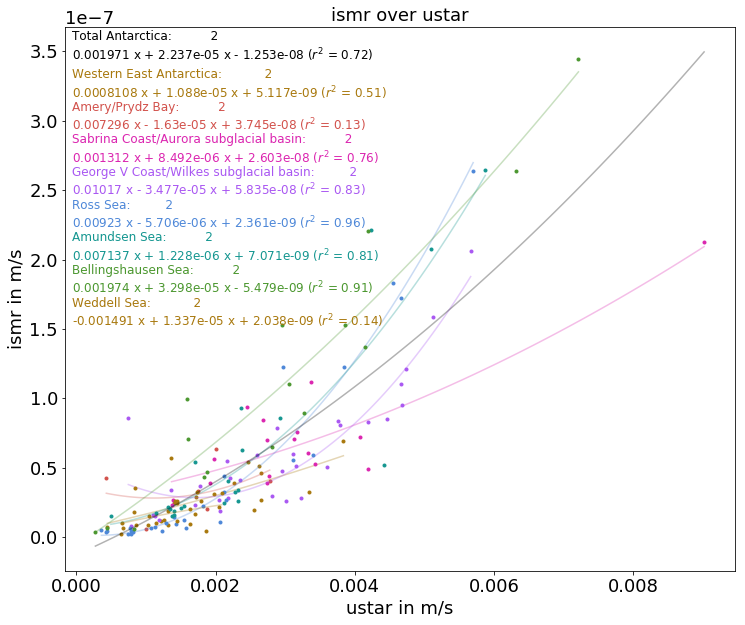

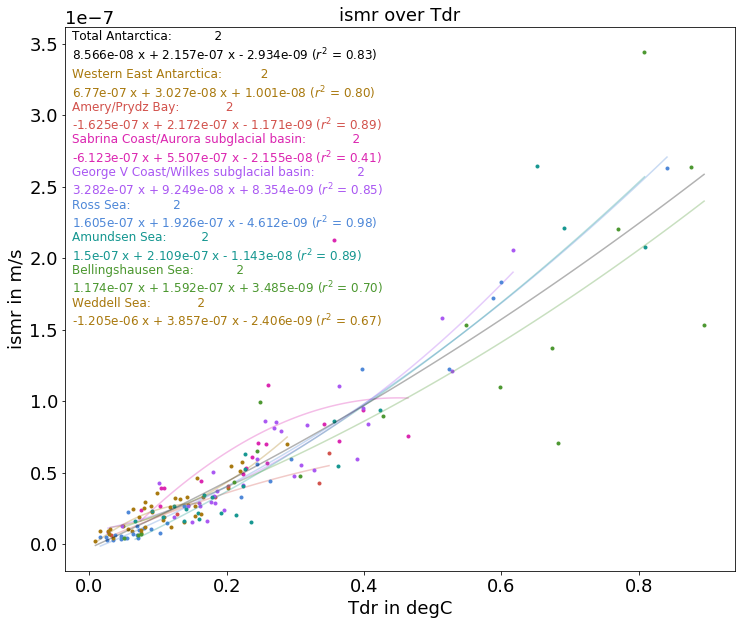

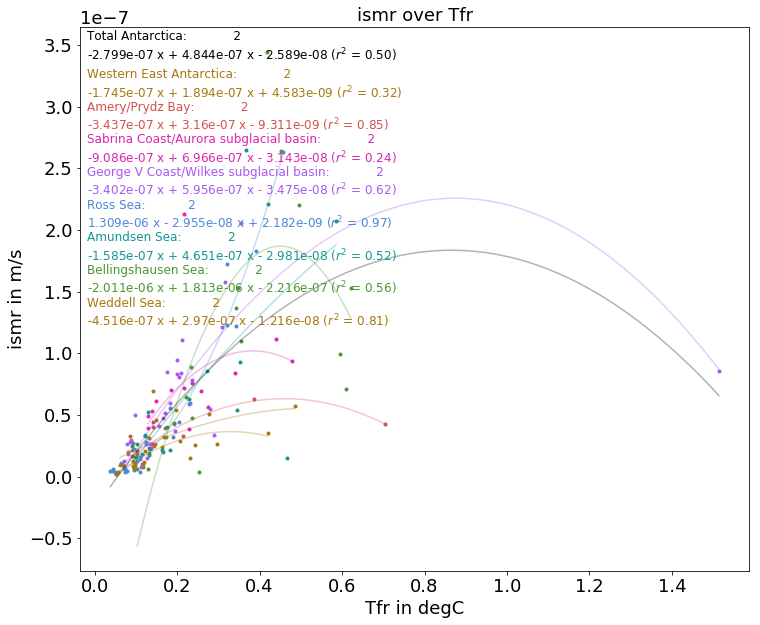

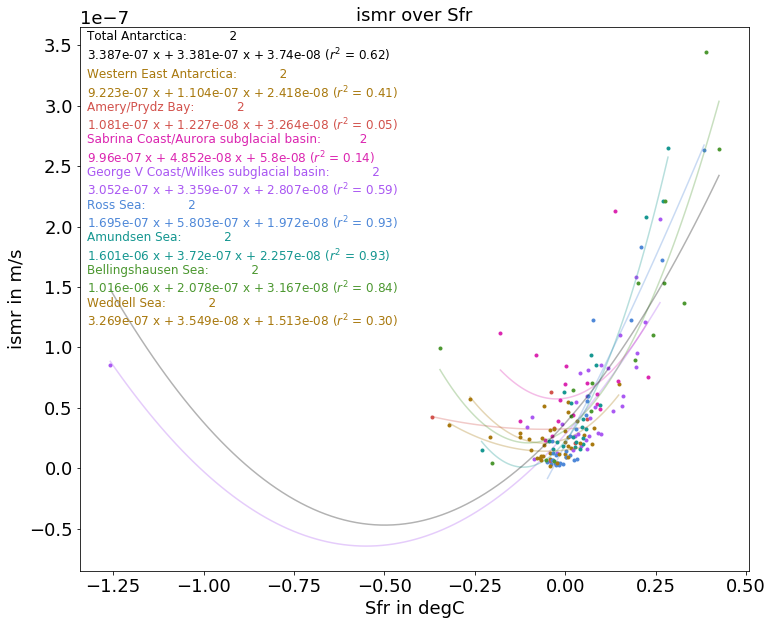

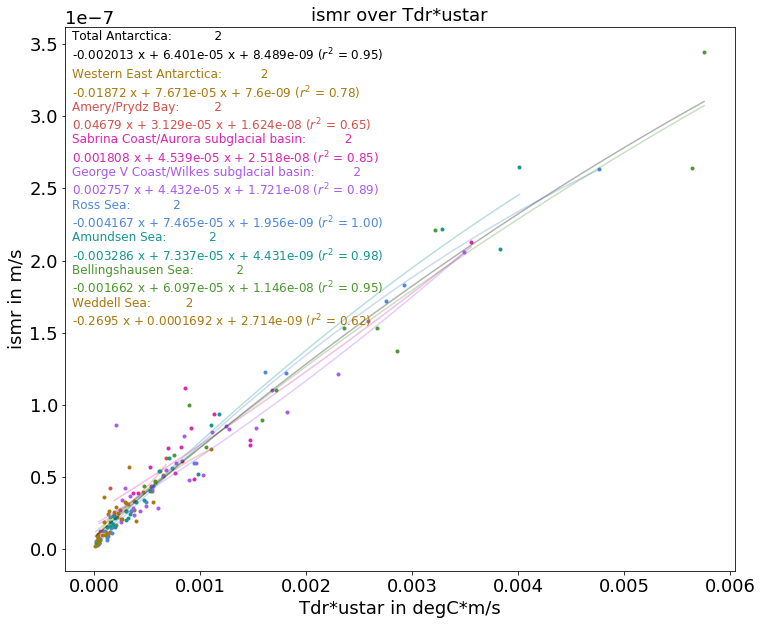

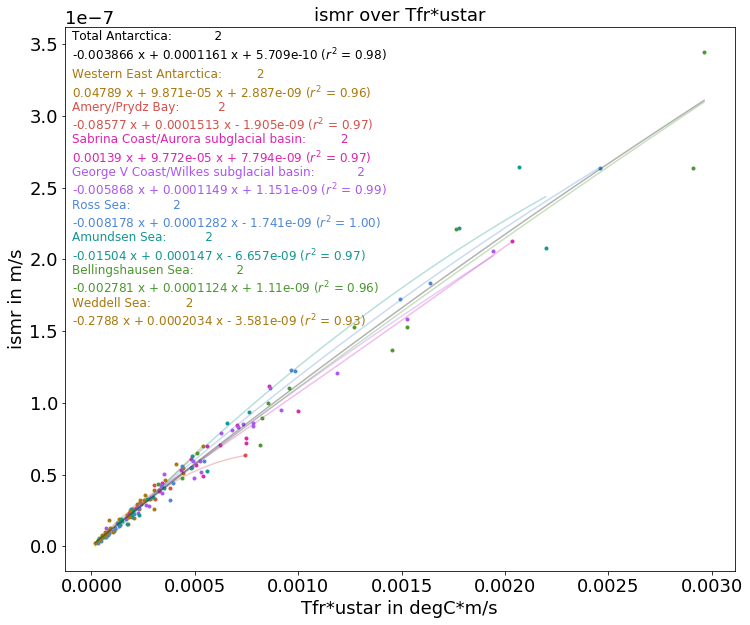

In [108]:
for x_name,xlab in zip(['ustar','Tdr','Tfr','Sfr','Tdr*ustar','Tfr*ustar'],
                       ['m/s','degC','degC','degC','degC*m/s','degC*m/s']):
    scatter_shelves_avg(x_name,'ismr','ismr over '+x_name,x_name+' in '+xlab,'ismr in m/s',save=True)

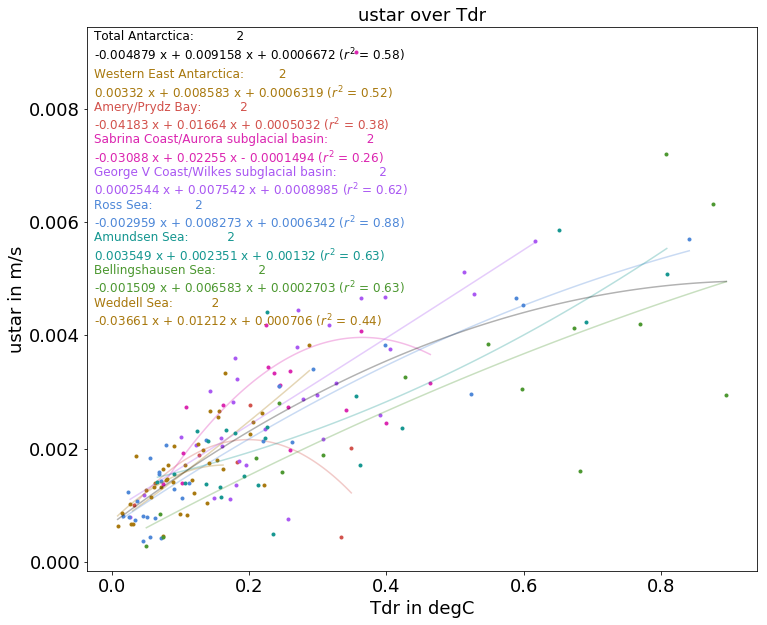

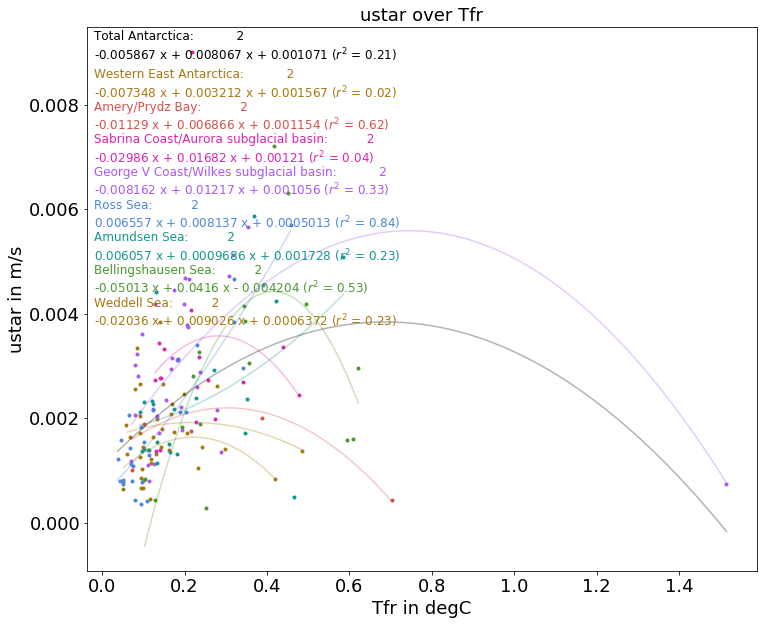

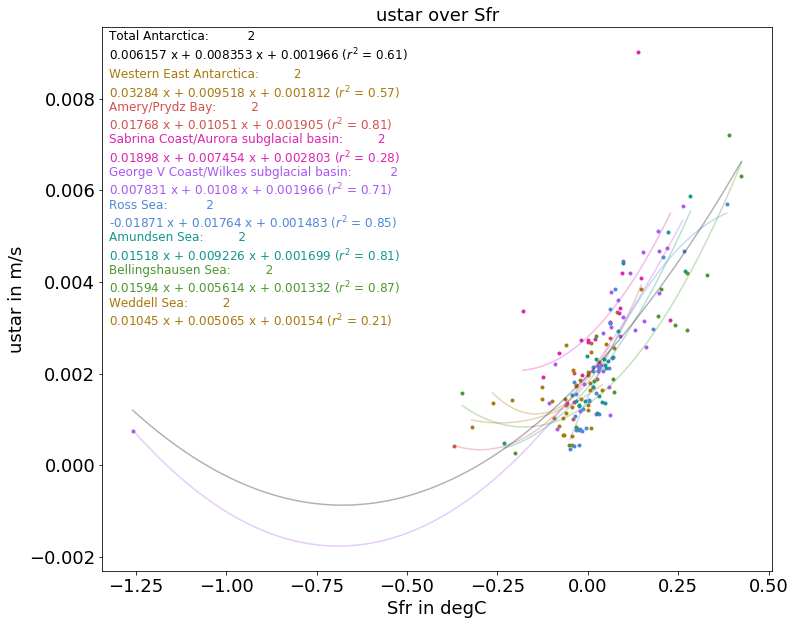

In [109]:
regres_ustar = {}
for x_name,xlab in zip(['Tdr','Tfr','Sfr'],
                       ['degC','degC','degC']):
    regres_ustar[x_name] = scatter_shelves_avg(x_name,'ustar','ustar over '+x_name,x_name+' in '+xlab,'ustar in m/s')

# relations for different resolutions

In [261]:
grid_path = os.path.join(int_dir,'grd4_dV.nc')
avg_path = os.path.join(data_dir,'analysis','raw','waom4','ocean_avg_0009_avg.nc')
shelves_masks_path = os.path.join(int_dir,'shelves4.npy') 

grd4 = xr.open_dataset(grid_path)
avg4 = xr.open_dataset(avg_path)
shelves4 = np.load(shelves_masks_path).item()
shelves4 = {k: v for k, v in shelves4.items() if v['mask'].any() and k in shelves2}

grid_path = os.path.join(int_dir,'grd10_dV.nc')
avg_path = os.path.join(data_dir,'analysis','raw','waom10','ocean_avg_0009.nc')
shelves_masks_path = os.path.join(int_dir,'shelves10.npy') 

grd10 = xr.open_dataset(grid_path)
avg10 = xr.open_dataset(avg_path)
shelves10 = np.load(shelves_masks_path).item()
shelves10 = {k: v for k, v in shelves10.items() if v['mask'].any() and k in shelves2}

In [262]:
mask4 = ((grd4.zice<0) & (grd4.mask_rho==1))
m4 = avg4.m.where(mask4).squeeze()
Sm4 = avg4.salt.isel(s_rho=30).where(mask4).squeeze()
Tpot4 = avg4.temp.isel(s_rho=30).where(mask4).squeeze()
zice4 = grd4.zice.where(mask4)

#Tm4 = calc_insituTemp(mask4,Tpot4,Sm4,zice4)
#Tm4.to_netcdf(os.path.join(int_dir,'situTemp4.nc'))
Tm4 = xr.open_dataarray(os.path.join(int_dir,'situTemp4.nc')).where(mask4)

u4 = avg4.u.mean('ocean_time')
v4 = avg4.v.mean('ocean_time')
ustar4 = calc_ustar(u4,v4,mask4)
Tfr4,Sfr4,Tdr4 = calc_frc(Tm4,Sm4,zice4,ustar4,grd4.f.where(mask4),m4,mask4)

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/xarray/core/computation.py:560: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


In [263]:
mask10 = ((grd10.zice<0) & (grd10.mask_rho==1))
m10 = avg10.m.where(mask10).mean('ocean_time')
Sm10 = avg10.salt.isel(s_rho=30).where(mask10).mean('ocean_time')
Tpot10 = avg10.temp.isel(s_rho=30).where(mask10).mean('ocean_time')
zice10 = grd10.zice.where(mask10)

#Tm10 = calc_insituTemp(mask10,Tpot10,Sm10,zice10)
#Tm10.to_netcdf(os.path.join(int_dir,'situTemp10.nc'))
Tm10 = xr.open_dataarray(os.path.join(int_dir,'situTemp10.nc')).where(mask10)
u10 = avg10.u.mean('ocean_time')
v10 = avg10.v.mean('ocean_time')
ustar10 = calc_ustar(u10,v10,mask10)
Tfr10,Sfr10,Tdr10 = calc_frc(Tm10,Sm10,zice10,ustar10,grd10.f.where(mask10),m10,mask10)

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/xarray/core/computation.py:560: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


In [264]:
for da,name in zip([m10,Tdr10,ustar10,Tfr10,Sfr10,Tdr10*ustar10,Tfr10*ustar10],
                   ['ismr','Tdr','ustar','Tfr','Sfr','Tdr*ustar','Tfr*ustar']):
    print('processing '+name)
    shelves10 = make_shelves_avg(da,shelves10,name)
    
shelves10 = {k:v for k,v in shelves10.items() if np.isnan(v['ustar'])==False} 

processing ismr


processing Tdr


processing ustar


processing Tfr


processing Sfr


processing Tdr*ustar


processing Tfr*ustar


In [265]:
for da,name in zip([m4,Tdr4,ustar4,Tfr4,Sfr4,Tdr4*ustar4,Tfr4*ustar4],
                   ['ismr','Tdr','ustar','Tfr','Sfr','Tdr*ustar','Tfr*ustar']):
    print('processing '+name)
    shelves4 = make_shelves_avg(da,shelves4,name)

shelves4 = {k:v for k,v in shelves4.items() if np.isnan(v['ustar'])==False}

processing ismr


processing Tdr


processing ustar


processing Tfr


processing Sfr


processing Tdr*ustar


processing Tfr*ustar


In [266]:
shelves_all = {'10':shelves10,'4':shelves4,'2':shelves2}

def scatter_resolution(x_quant,y_quant,title,xlab,ylab,shelves_all=shelves_all,save=False,big=False):
    
    matplotlib.rcParams.update({'font.size': 18})
    
    plt.close()
    fig,ax = plt.subplots(figsize=(12,10))
    
    x_ar={}
    y_ar={}
    
    for res,c,pos in zip(['10','4','2'],['r','g','k'],[0.9,0.8,0.7]):
        
        x_all=[]
        y_all=[]

        for key,data in shelves2.items():
            
            if big:
                if data['A']<5: continue
            
            if key not in shelves_all['10'] or key not in shelves_all['4']:
                continue
        
            if res == '10':
                x_ar[key]=[]
                y_ar[key]=[]
        
            x=shelves_all[res][key][x_quant]
            y=shelves_all[res][key][y_quant]
                   
            ax.plot(x,y,'.',label=key,c=c)
            #if res == '2':
            #    ax.annotate(key,(x,y),size='x-small')

            x_ar[key].append(x)
            y_ar[key].append(y)
        
            x_all.append(x)
            y_all.append(y)
            
        x_all = np.array(x_all).squeeze()
        y_all = np.array(y_all).squeeze()
    
        xp,p,Rsquared = polyfit(x_all,y_all,2)        
        ax.plot(xp,p(xp),'-',label='constrained poly fit',alpha=0.3,c=c)
        ax.text(0.01,pos,res+' km: '+str(p)+'\n ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,
                fontsize=12,color=c)       

        #xp,p,Rsquared = polyfit(x_all,y_all,1)        
        #ax.plot(xp,p(xp),'-',label='constrained poly fit',alpha=0.3,c=c)
        #ax.text(0.1,pos-0.05,str(p)+'\n ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,
        #        fontsize=12,color=c,alpha=0.3)      
    
    for key in x_ar:
        ax.annotate("", xy=(x_ar[key][1],y_ar[key][1]), xytext=(x_ar[key][0],y_ar[key][0]),
                    arrowprops=dict(arrowstyle="->",color='k',alpha=0.3))
        ax.annotate("", xy=(x_ar[key][2],y_ar[key][2]), xytext=(x_ar[key][1],y_ar[key][1]),
                        arrowprops=dict(arrowstyle="->",color='k',alpha=0.3))
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title,fontsize=18)
    
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_resolution'+title.replace('/','_').replace(' ','_')+'.png'),format='png',dpi=400,bbox_inches = "tight")    
    plt.show()

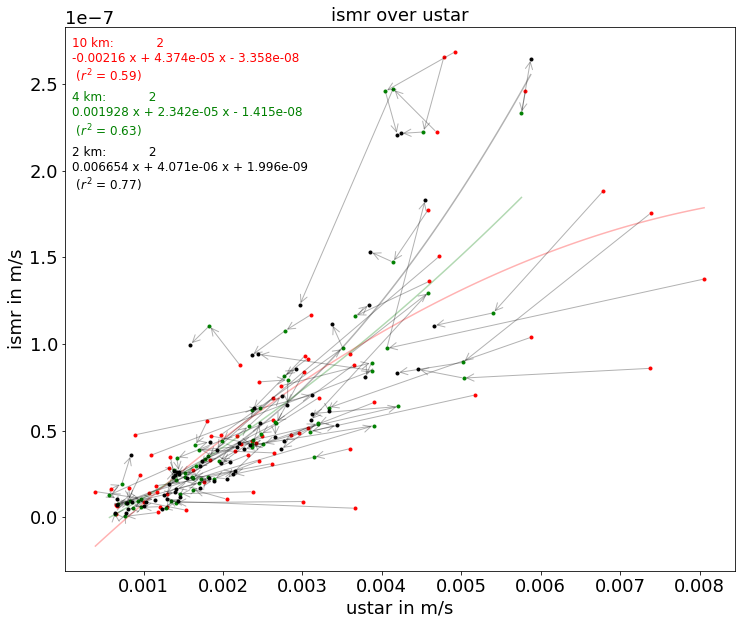

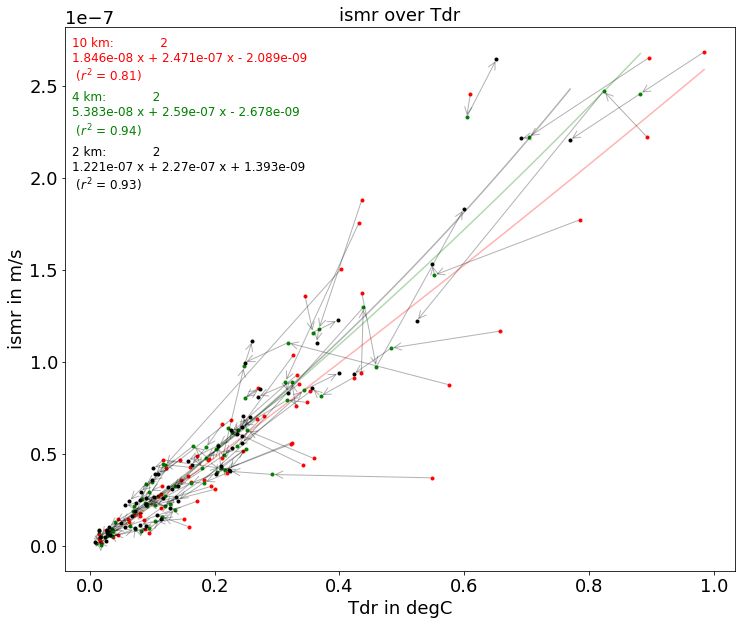

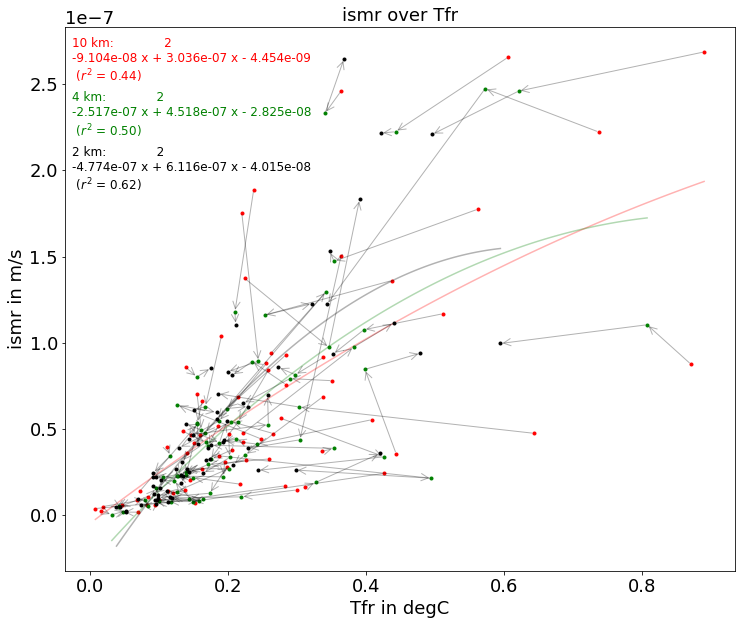

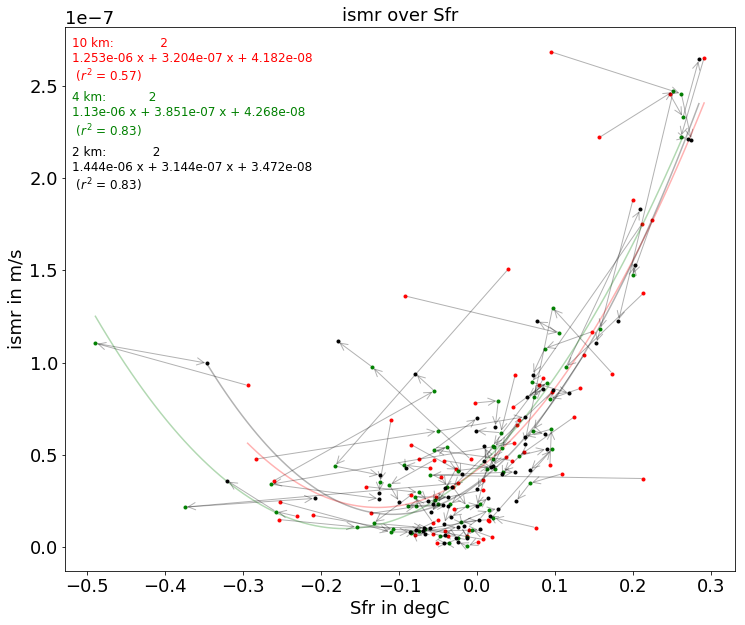

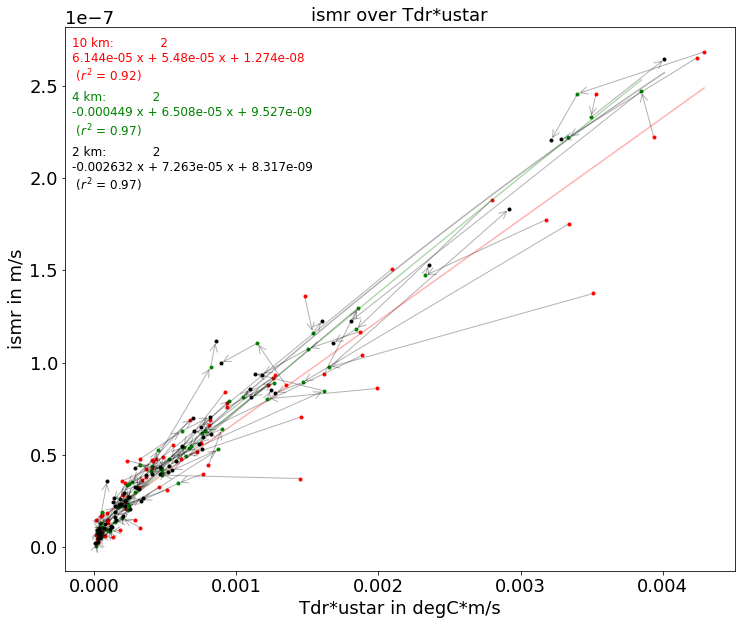

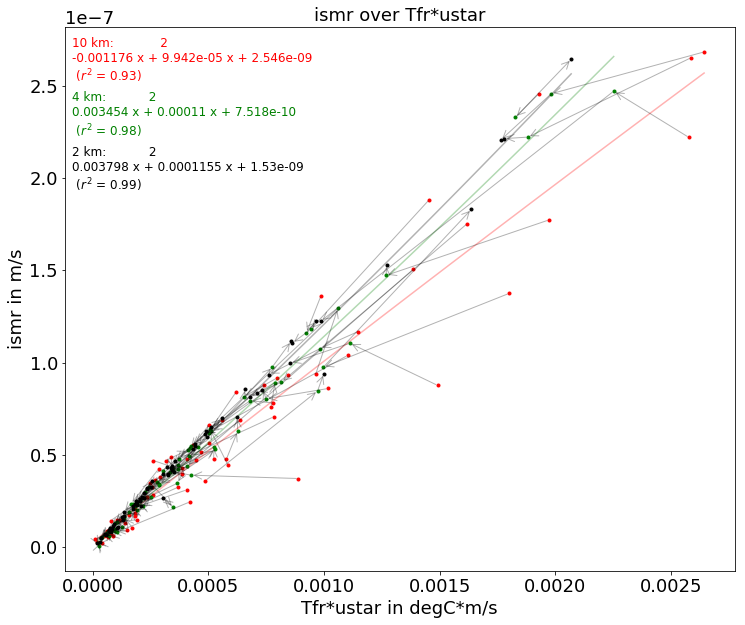

In [267]:
for x_name,xlab in zip(['ustar','Tdr','Tfr','Sfr','Tdr*ustar','Tfr*ustar'],
                       ['m/s','degC','degC','degC','degC*m/s','degC*m/s']):
    scatter_resolution(x_name,'ismr','ismr over '+x_name,x_name+' in '+xlab,'ismr in m/s',save=True)

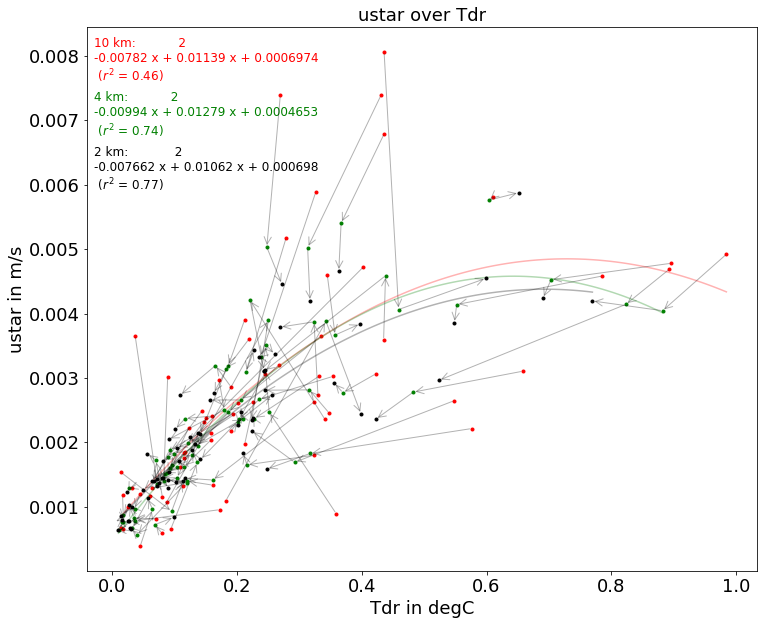

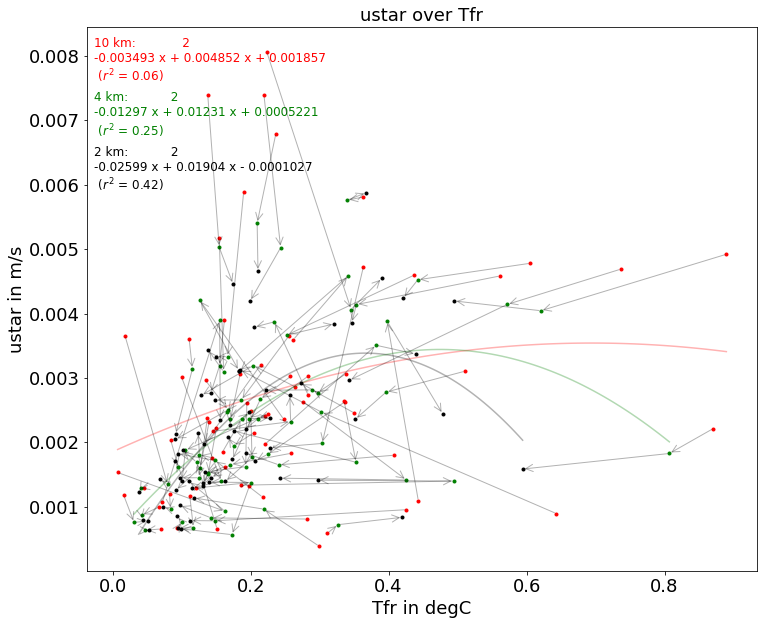

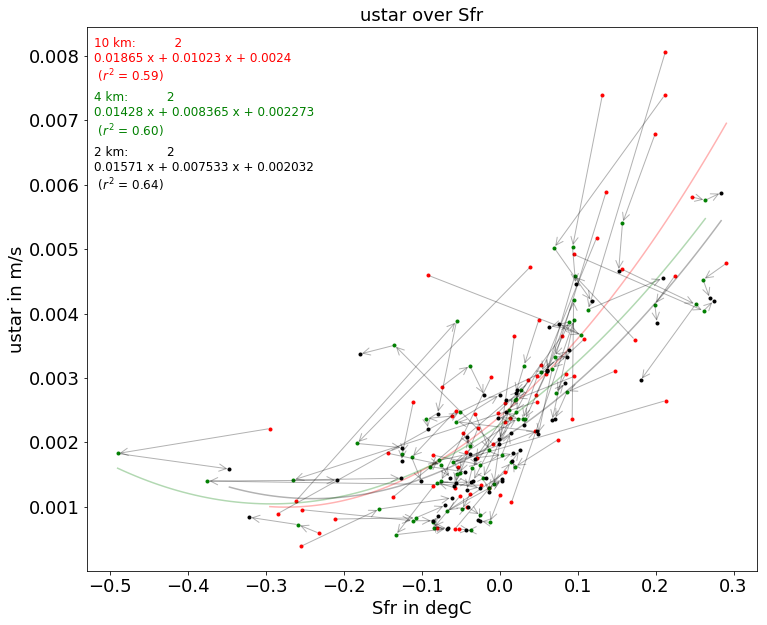

In [268]:
for x_name,xlab in zip(['Tdr','Tfr','Sfr'],
                       ['degC','degC','degC']):
    scatter_resolution(x_name,'ustar','ustar over '+x_name,x_name+' in '+xlab,'ustar in m/s',save=True)

In [235]:
import scipy.io as sio
from scipy.interpolate import griddata

bfr_path = os.path.join(ext_dir,'reese','ButtressingFluxResponseNumbers.mat')
bfr = sio.loadmat(bfr_path)

mr=2
x,y = np.meshgrid(np.arange(-3000,3300+mr/2,mr/2),np.arange(-2700,2600+mr/2,mr/2))
x_rho = x[1::2,1::2]*1000
y_rho = y[1::2,1::2]*1000

bfr_rho = griddata((bfr['x'].flatten(),bfr['y'].flatten()),bfr['BFRN'].flatten(),(x_rho,y_rho),method='nearest')
bfr = xr.DataArray(bfr_rho,dims=('eta_rho','xi_rho')).where((grd2.mask_rho ==1 ) & (grd2.zice<0))

In [244]:
bfr_raw = sio.loadmat(bfr_path)
print(bfr_raw['BFRN'].max(),bfr_raw['BFRN'].min())

20.628187856142514 -0.13594143168421077


/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


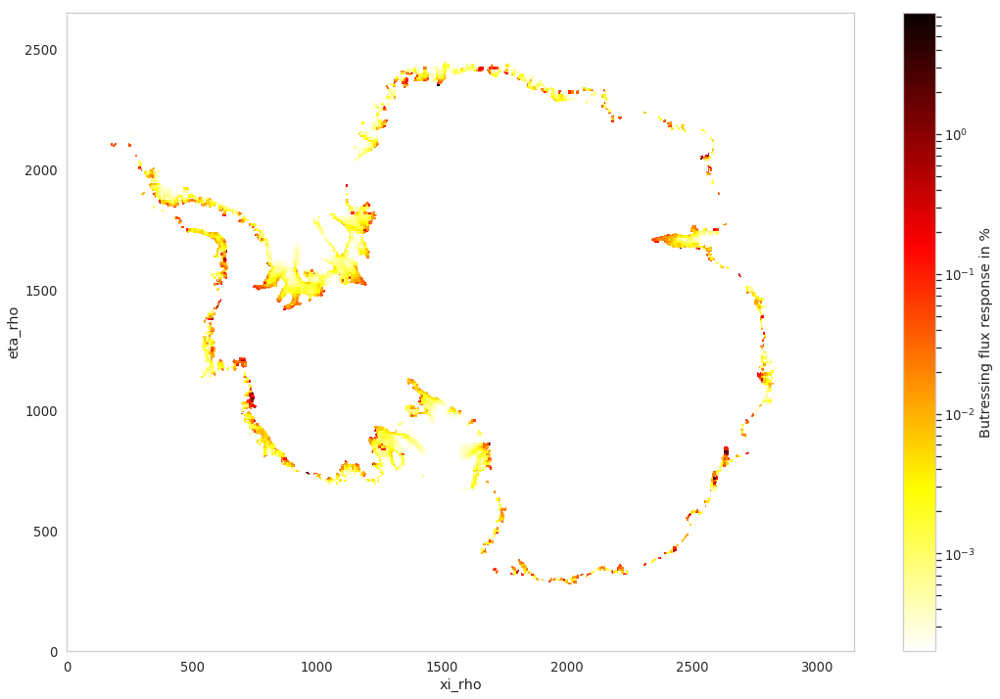

In [238]:
%matplotlib inline
import matplotlib.colors as colors
mask = (grd2.mask_rho == 1) & (grd2.zice < 0)
bfr.where(mask & (bfr > 0))[::,::].plot(norm=colors.LogNorm(vmin=0,vmax=1),size=12,cmap='hot_r',cbar_kwargs={'label': 'Butressing flux response in %'})

In [241]:
sns.set(style='whitegrid',font_scale=1.2)
def plot_hist(quant,weights,title,xlab,ylab,xlim=None,bins=100,density=False,cum=False,log=False,save=False):
    plt.close()
    fig,ax = plt.subplots()
    mask = ~quant.isnull()
    X = quant.values[mask]
    weights = weights[mask]
    ax.hist(X,bins=bins,weights=weights,density=density,log=log)
    if xlim:
        ax.set_xlim(xlim)
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    if cum==True:
        ax2 = ax.twinx()
        n,x,_ = ax2.hist(X,bins=bins,weights=weights,density=True,cumulative=True,alpha=0.0,color='k',log=log)
        x = 0.5*(x[1:]+x[:-1])
        ax2.plot(x,n,color='r')
        ax2.set_ylabel('Cumulative in %',color='r')
    if save:
        plt.savefig(os.path.join(fig_dir,'hist_'+title.replace('/','_')+'.png'),format='png',bbox_inches = "tight",
                   transparent=True)
    plt.show()

In [94]:
s2a = 3600*24*365.25
rhoi = 916
mask = (grd2.mask_rho ==1) & (grd2.zice<0)
dA = (1/(grd2.pm*grd2.pn)).where(mask)
ismr2bmb = dA*rhoi*(10**-12)
bmb = m2*s2a*ismr2bmb

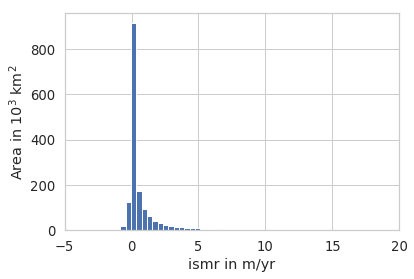

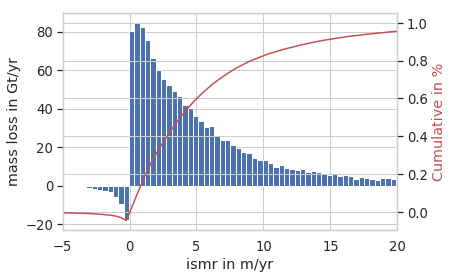

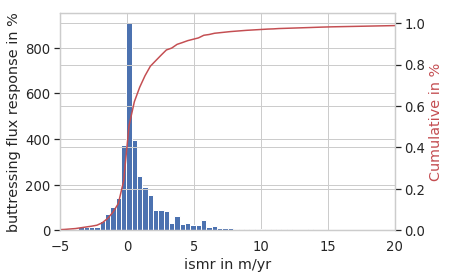

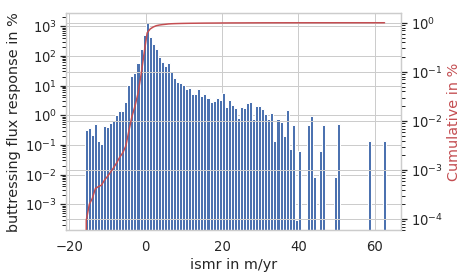

In [242]:
 The gray contour lines on the original image might bias things a bit, but could also be quite balanced since they are in the deep and shallow parts.%matplotlib inline
plot_hist(m2*s2a,dA.values*10**-9,'ismr_area','ismr in m/yr','Area in $10^3$ km$^2$',xlim=(-5,20),bins=200,save=False)
plot_hist(m2*s2a,bmb.values,'ismr_bmb','ismr in m/yr','mass loss in Gt/yr',xlim=(-5,20),bins=200,cum=True,save=False)
plot_hist(m2*s2a,bfr.values,'ismr_bfr','ismr in m/yr','buttressing flux response in %',xlim=(-5,20),cum=True,bins=200,save=False)
plot_hist(m2*s2a,bfr.values,'ismr_bfr_log','ismr in m/yr','buttressing flux response in %',log=True,cum=True,save=False)

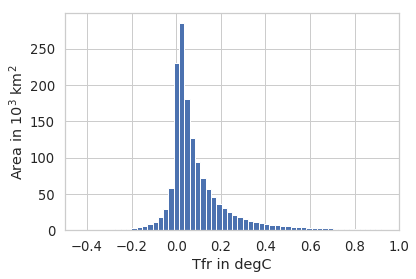

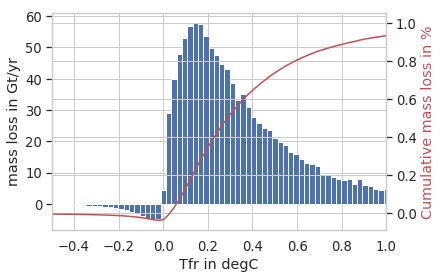

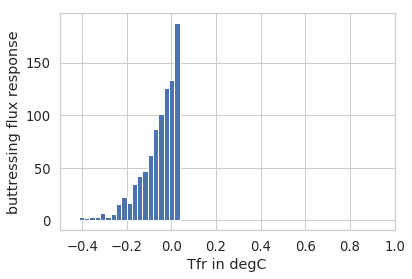

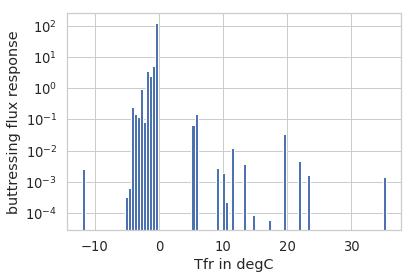

In [140]:
plot_hist(Tfr2,dA.values*10**-9,'Tfr_area','Tfr in degC','Area in $10^3$ km$^2$',xlim=(-0.5,1),bins=2000,save=True)
plot_hist(Tfr2,bmb.values,'Tfr_bmb','Tfr in degC','mass loss in Gt/yr',xlim=(-0.5,1),bins=2000,cum=True,save=True)
plot_hist(Tfr2,bfr.values,'Tfr_bfr','Tfr in degC','buttressing flux response',xlim=(-0.5,1),bins=2000,save=True)
plot_hist(Tfr2,bfr.values,'Tfr_bfr_log','Tfr in degC','buttressing flux response',save=True,log=True)

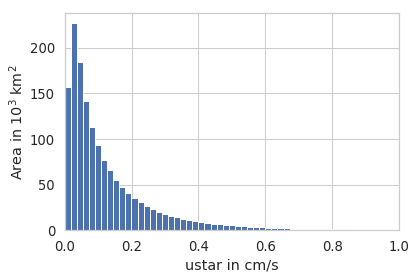

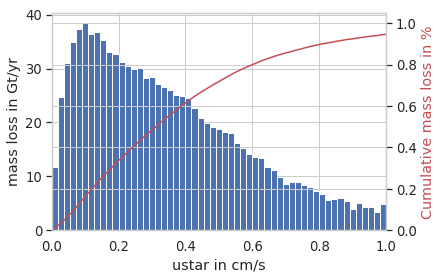

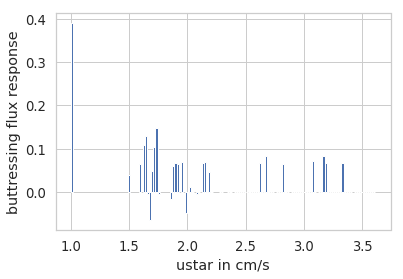

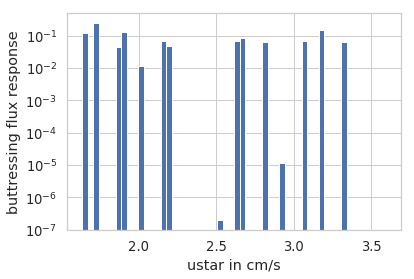

In [146]:
plot_hist(ustar2*100,dA.values*10**-9,'ustar_area','ustar in cm/s','Area in $10^3$ km$^2$',xlim=(-0.0,1),bins=200,save=True)
plot_hist(ustar2*100,bmb.values,'ustar_bmb','ustar in cm/s','mass loss in Gt/yr',xlim=(-0.0,1),bins=200,cum=True,save=True)
plot_hist(ustar2*100,bfr.values,'ustar_bfr','ustar in cm/s','buttressing flux response',bins=200,save=True)
plot_hist(ustar2*100,bfr.values,'ustar_bfr_log','ustar in cm/s','buttressing flux response',save=True,log=True)

In [254]:
def plot_std_over_mean(name,shelves_dict=shelves2,save=False):
    y = [v[name+'_mean'] for k,v in shelves_dict.items()]
    x = [v[name+'_std'] for k,v in shelves_dict.items()]

    fig,ax = plt.subplots()
    ax.plot(x,y,'k.')
    plot_regres(ax,x,y,'all',0.05,0.90,'k',1,True)
    ax.set_xlabel(name+' mean in m/yr')
    ax.set_ylabel(name+' std in m/yr')
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_std_over_mean'+name.replace('/','_')+'.png'),format='png',bbox_inches = "tight")
    plt.show()

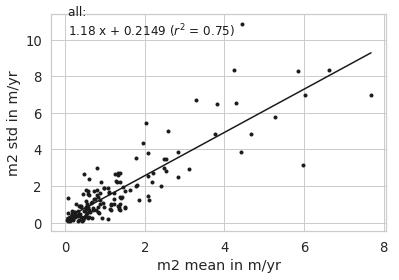

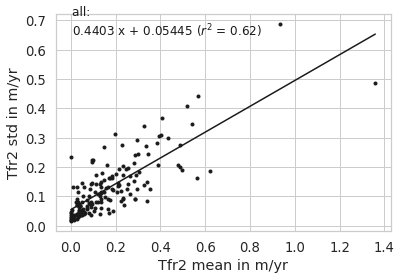

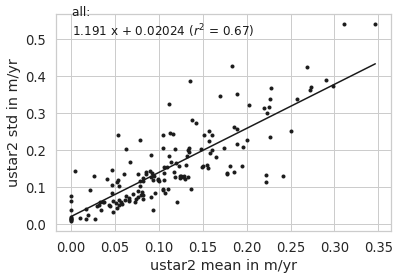

In [256]:
for name in ['m2','Tfr2','ustar2']:
    plot_std_over_mean(name,save=True)

## for different depth ranges

In [194]:
def calc_front_situTemp_depth(temp,salt,grd,shelves_dict):
    for k,v in log_progress(shelves_dict.items(),every=2):
        for key,mask in zip(['shallow','deep'],[grd.z>-400,grd.z<=-400]):
            mask = (v['front_mask']) & mask
            dV = grd.dV.where(mask)
            weights=dV/dV.sum()
            situTemp= calc_insituTemp(mask,temp,salt,grd.z)
            shelves_dict[k]['Tm_front_'+key] = (situTemp*weights).sum().load()
    return shelves_dict

In [195]:
shelves2 = calc_front_situTemp_depth(temp2,salt2,grd2,shelves2)

In [196]:
def calc_melt_frc_front_depth(Tm_base,Tfr_base,ustar_base,salt,grd,shelves_dict):
    
    dA =(grd.pm*grd.pn)**-1
    a = -0.057
    b = 0.0939
    c = 7.61e-4
    
    for k,v in log_progress(shelves_dict.items(),every=2):
        for depth_key,depth_mask in zip(['shallow','deep'],[grd.z>-400,grd.z<=-400]):
            
            print('processing '+depth_key,end='\r')
            
            dA = dA.where(v['mask'] & depth_mask)
            weights = dA/dA.sum()
            Tm_shelf = (Tm_base*weights).sum()
            Tfr_shelf = (Tfr_base*weights).sum()
            ustar_shelf = (ustar_base*weights).sum()

            dV = grd.dV.where(v['front_mask'] & depth_mask)
            weights=dV/dV.sum()
            S_front = (salt*weights).sum()
            z_front = (grd.z*weights).sum()

            Tb = Tm_shelf-Tfr_shelf
            TF_front = a*S_front + b + c*z_front

            shelves_dict[k]['Tm_'+depth_key] = Tm_shelf
            shelves_dict[k]['Tfr_'+depth_key] = Tfr_shelf
            shelves_dict[k]['ustar_'+depth_key] = ustar_shelf
            shelves_dict[k]['Tb_'+depth_key] = Tb
            shelves_dict[k]['TF_front_'+depth_key] = TF_front
            shelves_dict[k]['S_front_'+depth_key] = S_front
            shelves_dict[k]['z_front_'+depth_key] = z_front
            shelves_dict[k]['Tfr_front_'+depth_key] = v['Tm_front_'+depth_key]-Tb
            shelves_dict[k]['Tdr_front_'+depth_key] = v['Tm_front_'+depth_key]-TF_front

    return shelves_dict

In [197]:
shelves2 = calc_melt_frc_front_depth(Tm2,Tfr2,ustar2,salt2,grd2,shelves2)

In [198]:
np.save(os.path.join(int_dir,'shelves2.npy'),shelves2)

In [199]:
for depth in ['shallow','deep']:
    scatter_front_avg('Tfr_front_'+depth,m2,'Tfr in degC','ismr in m/s',depth+' ismr over Tfr at front',shelves2,True)
    scatter_front_avg('Tdr_front_'+depth,m2,'Tdr in degC','ismr in m/s',depth+' ismr over Tdr at front',shelves2,True)

NameError: name 'scatter_front_avg' is not defined

### including tidal velocity from 4km case (have to use ice shelf averages for u_tide for now)

In [235]:
tidal_velo = xr.open_dataarray(os.path.join(int_dir,'tidal_velo4.nc'))
shelves4 = np.load(os.path.join(int_dir,'shelves4.npy')).item()

shelves4 = make_shelves_avg(tidal_velo*np.sqrt(5.0e-3),shelves4,'ustar_tide')
shelves4 = {k:v for k,v in shelves4.items() if np.isnan(v['ustar_tide'])==False}.copy() 

for k,v in {k:v for k,v in shelves2.items() if k in shelves4}.items():
    tv = shelves4[k]['ustar_tide']   
    shelves2[k]['ustar_t'] = v['ustar']+tv
    shelves2[k]['Tdr*ustar_t'] = v['Tdr*ustar']+v['Tdr']*tv
    shelves2[k]['Tfr*ustar_t'] = v['Tfr*ustar']+v['Tfr']*tv

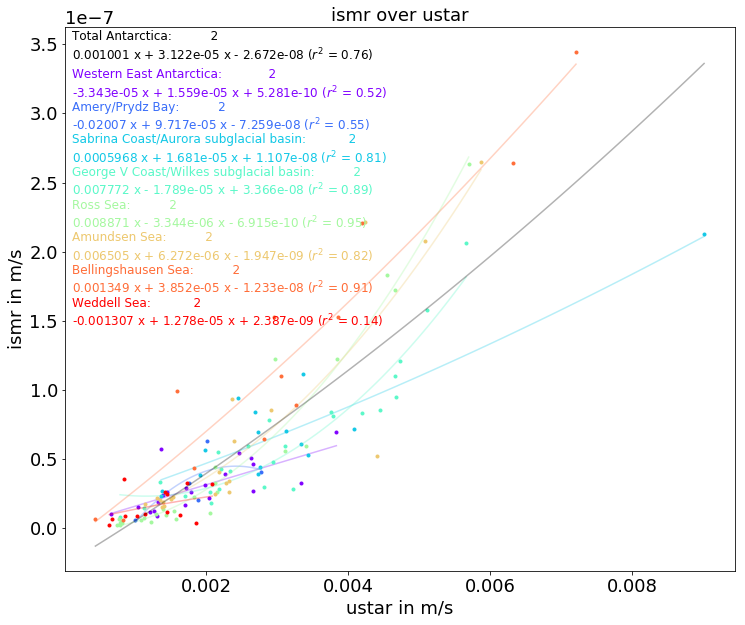

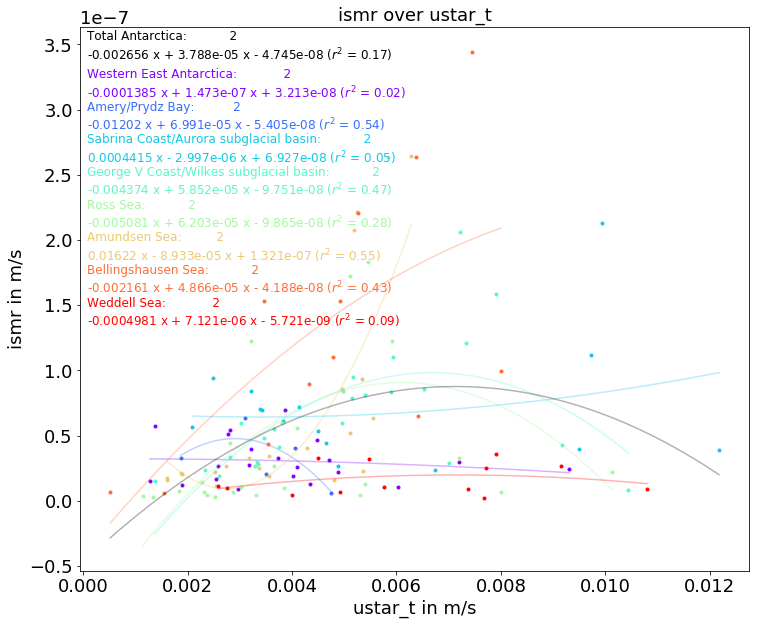

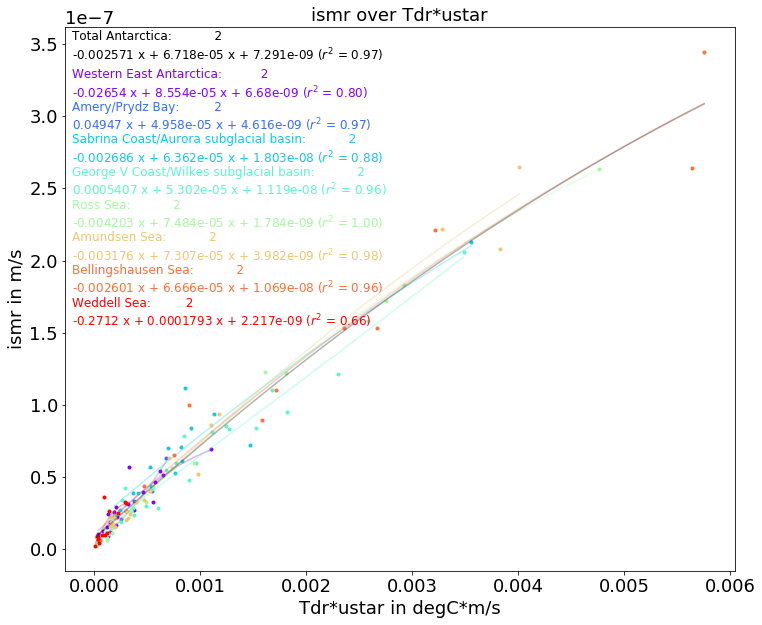

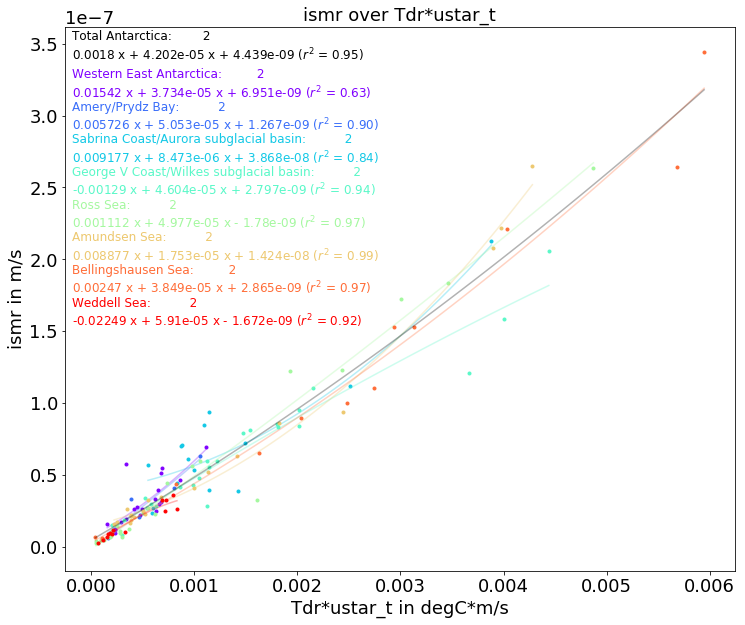

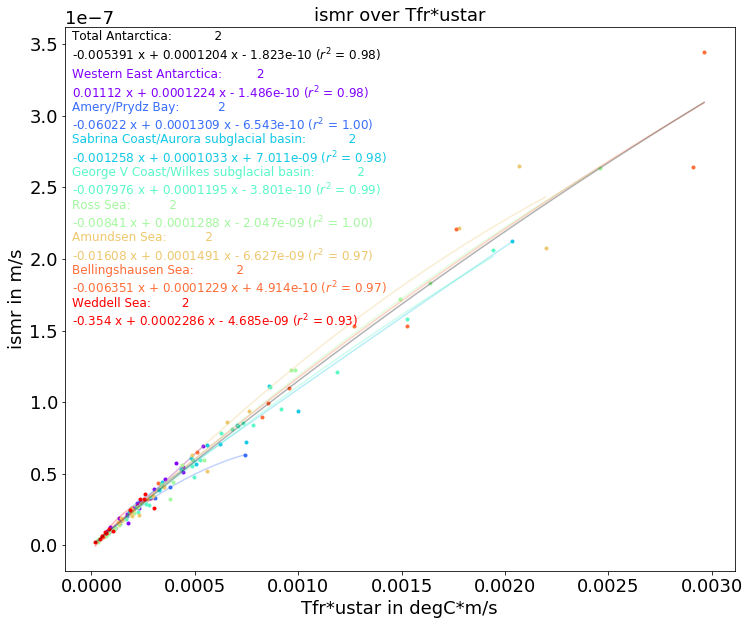

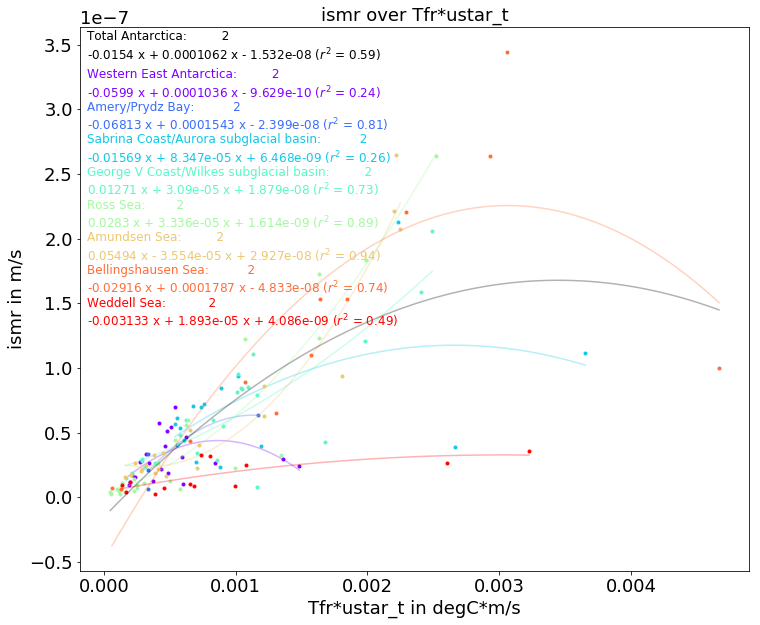

In [238]:
for x_name,xlab in zip(['ustar','ustar_t','Tdr*ustar','Tdr*ustar_t','Tfr*ustar','Tfr*ustar_t'],
                       ['m/s','m/s','degC*m/s','degC*m/s','degC*m/s','degC*m/s']):
    scatter_shelves_avg(x_name,'ismr','ismr over '+x_name,x_name+' in '+xlab,'ismr in m/s',shelves_dict={k:v for k,v in shelves2.items() if k in shelves4})

# relations between 4 km tides vs no_tides

In [910]:
grid_path = os.path.join(data_dir,'preprocessing','processed','waom4_grd.nc')
avg_path = os.path.join(data_dir,'analysis','raw','waom4','ocean_avg_0009.nc')
avg_nt_path = os.path.join(data_dir,'analysis','raw','waom4_nt','ocean_avg_0009.nc')
sector_masks_path = os.path.join(data_dir,'analysis','interim','mask_sector_4.npy') 
shelves_masks_path = os.path.join(data_dir,'analysis','interim','shelves4.npy')
grd4 = xr.open_dataset(grid_path)
avg4= xr.open_mfdataset(avg_path,chunks={"xi_rho":200,"eta_rho":200})
avg4_nt= xr.open_dataset(avg_nt_path,chunks={"xi_rho":200,"eta_rho":200})
sector4 = np.load(sector_masks_path).item()
shelves4 = np.load(shelves_masks_path).item()

In [877]:
mask4 = ((grd4.zice<0) & (grd4.mask_rho==1)).load()
m4_nt = avg4_nt.m.where(mask4).mean('ocean_time').squeeze().load()
m4 = avg4.m.where(mask4).mean('ocean_time').squeeze().load()
Sm4_nt = avg4.salt.isel(s_rho=30).where(mask4).mean('ocean_time').squeeze().load()
Sm4 = avg4_nt.salt.isel(s_rho=30).where(mask4).mean('ocean_time').squeeze().load()
Tpot4_nt = avg4_nt.temp.isel(s_rho=30).where(mask4).mean('ocean_time').squeeze().load()
Tpot4 = avg4.temp.isel(s_rho=30).where(mask4).mean('ocean_time').squeeze().load()
zice4 = grd4.zice.where(mask4).load()
Tm4_nt = calc_insituTemp(mask4,Tpot4_nt,Sm4,zice4)
Tm4 = calc_insituTemp(mask4,Tpot4,Sm4,zice4)
Tm4_nt.to_netcdf(os.path.join(int_dir,'situTemp4_nt.nc'))
Tm4.to_netcdf(os.path.join(int_dir,'situTemp4.nc'))
#Tm2 = xr.open_dataarray(os.path.join(int_dir,'situTemp2.nc')).where(mask2).load()

MemoryError: 

In [895]:
Cd=5.0e-3
Cdrt = np.sqrt(Cd)

def calc_ustar(u,v,mask):
    u = u.values
    v = v.values
    # Interpolate u to the rho-grid
    w_bdry_u = u[:,0]
    middle_u = 0.5*(u[:,0:-1] + u[:,1:])
    e_bdry_u = u[:,-1]
    u_rho = np.concatenate((w_bdry_u[:,None], middle_u, e_bdry_u[:,None]), axis=1)
    # Interplate v to the rho-grid
    s_bdry_v = v[0,:]
    middle_v = 0.5*(v[0:-1,:] + v[1:,:])
    n_bdry_v = v[-1,:]
    v_rho = np.concatenate((s_bdry_v[None,:], middle_v, n_bdry_v[None,:]), axis=0)
    
    mag = np.sqrt(u_rho**2+v_rho**2)
    ustar = Cdrt*mag
    return xr.DataArray(ustar,dims=('eta_rho','xi_rho'),name='ustar').where(mask)

In [903]:
u4_nt = avg4_nt.u.isel(s_rho=30).mean('ocean_time').load()
v4_nt = avg4_nt.v.isel(s_rho=30).mean('ocean_time').load()
u4 = avg4.u.isel(s_rho=30).mean('ocean_time').load()
v4 = avg4.v.isel(s_rho=30).mean('ocean_time').load()

ustar4_nt = calc_ustar(u4_nt,v4_nt,mask4)
ustar4 = calc_ustar(u4,v4,mask4)

Tfr4_nt,Sfr4_nt,Tdr4_nt = calc_fr(Tm4_nt.load(),Sm4_nt.load(),zice4,ustar4_nt,grd4.f.where(mask4),m4_nt.load(),mask4)
Tfr4,Sfr4,Tdr4 = calc_fr(Tm4.load(),Sm4.load(),zice4,ustar4,grd4.f.where(mask4),m4.load(),mask4)

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/xarray/core/computation.py:560: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/xarray/core/computation.py:560: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


In [939]:
import matplotlib
matplotlib.rcParams.update({'font.size': 22}) 

def plot_map(da,grd,title,cbar_label,cmap,vrange):
    plt.close()
    fig,ax = plt.subplots(figsize=(10,8))
    ax.axis('off')
    ax.set_aspect('equal')
    ax.contourf(grd.mask_rho.where(grd.mask_rho==0),colors=(('0.6','0.6','0.6')))
    if vrange==None:
        mean = da.mean(dim=da.dims)
        std = da.std(dim=da.dims)
        vmin=-2*std
        vmax=+2*std
    else:
        vmin,vmax=vrange
    plot = da.plot(ax=ax,vmin=vmin,vmax=vmax,cmap=cmap,cbar_kwargs={'label': cbar_label})
    ax.set_title(title)
    ax.set_ylim([250/2,2500/2])
    ax.set_xlim([200/2,2900/2])
    plt.tight_layout()
    #plt.savefig(os.path.join(fig_dir,'tmp','map_'+title.replace('/','_')+'.png'),format='png',dpi=400,bbox_inches = "tight")
    plt.show()

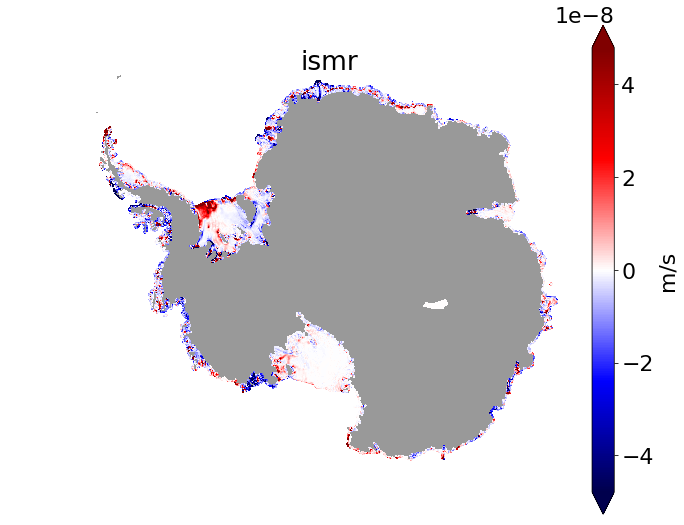

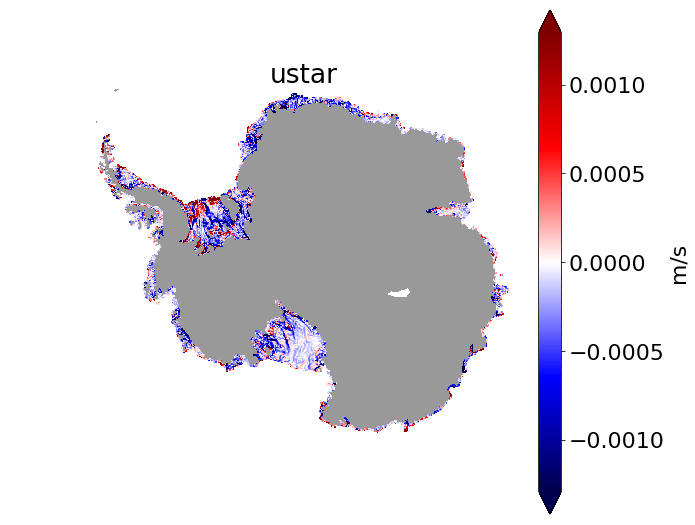

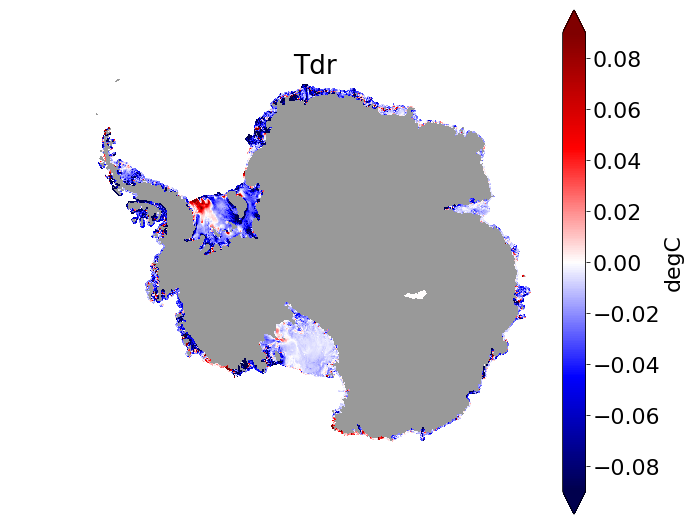

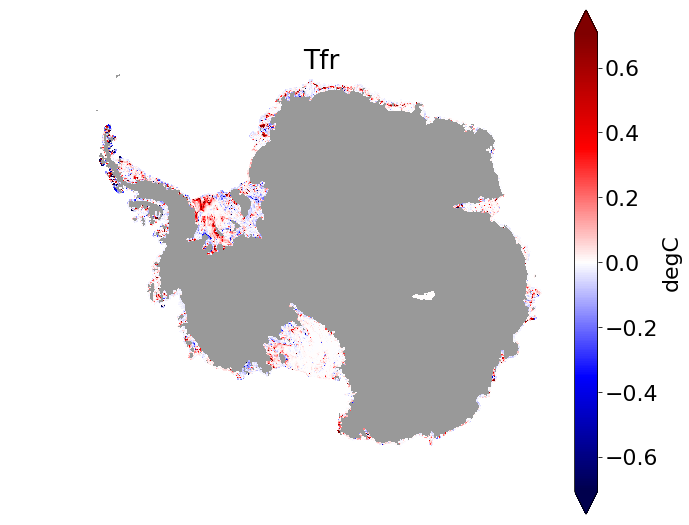

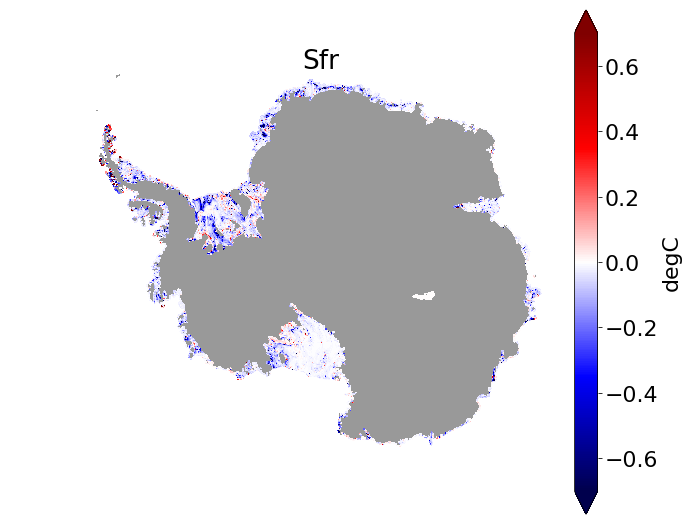

In [952]:
dm4 = m4-m4_nt
dustar4 = ustar4-ustar4_nt
dTdr4 = Tdr4-Tdr4_nt
dTfr4 = Tfr4-Tfr4_nt
dSfr4 = Sfr4-Sfr4_nt

for da,title,cbt,cmap,vrange in zip([dm4,dustar4,dTdr4,dTfr4,dSfr4],
                             ['ismr','ustar','Tdr','Tfr','Sfr'],
                             ['m/s','m/s','degC','degC','degC'],
                             [plt.cm.seismic,plt.cm.seismic,plt.cm.seismic,plt.cm.seismic,plt.cm.seismic],
                             [None,None,None,None,None]):
    plot_map(da,grd4,title,cbt,cmap,vrange)

In [945]:
big_shelves4 = {k: v for k, v in shelves4.items() if v['mask'].any() and shelves2[k]["A"]>5}

In [953]:
def make_avg_map(d4):
    shelf_map = np.zeros_like(grd4.mask_rho)
    for k,v in big_shelves4.items():
        d4i = d4.where(v['mask']).mean().values
        shelf_map[v['mask']]=d4i
        
    return xr.DataArray(shelf_map,dims=('eta_rho','xi_rho')).where(mask4)

avg_map={}
for d4,name in zip([dm4,dustar4,dTdr4,dTfr4,dSfr4],['dm4','dustar4','dTdr4','dTfr4','dSfr4']):
    avg_map[name] = make_avg_map(d4)

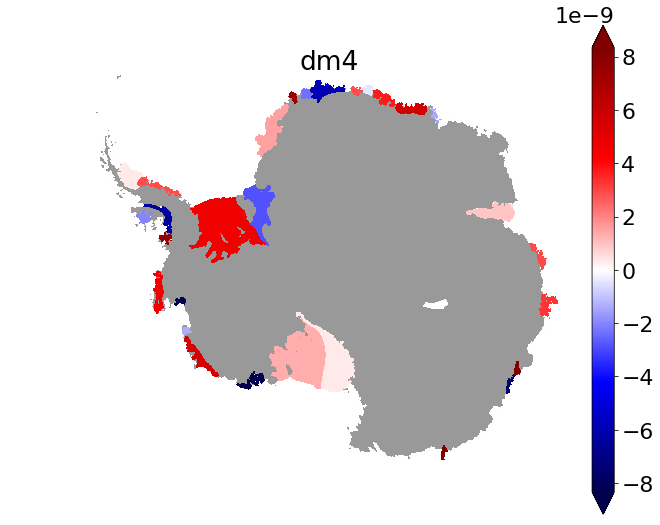

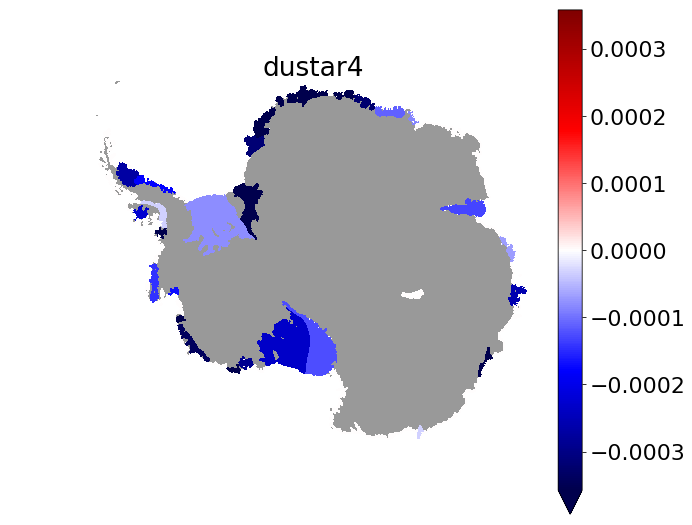

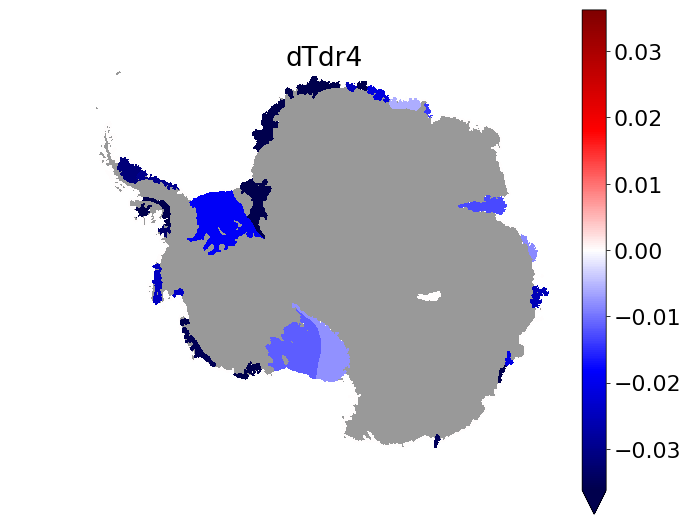

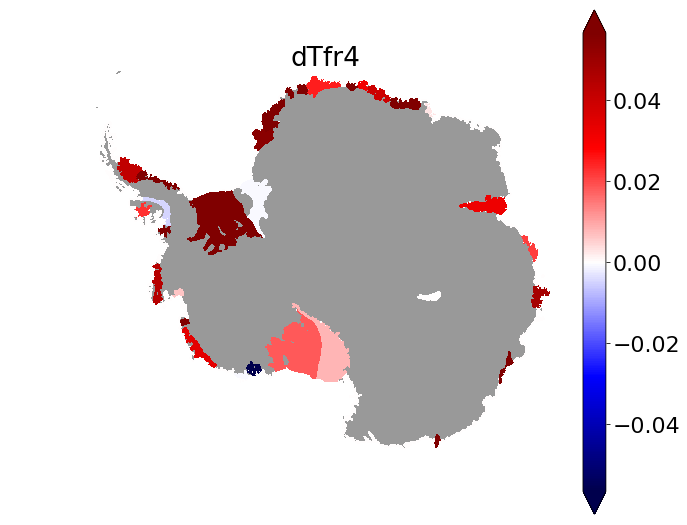

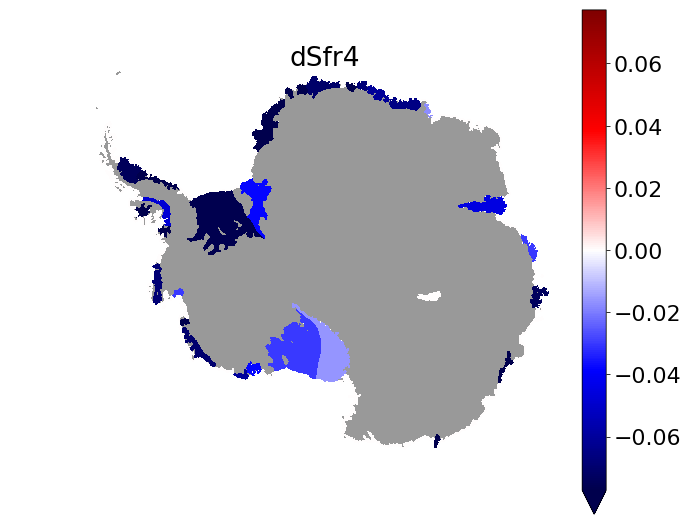

In [954]:
for k,v in avg_map.items():
    plot_map(v,grd4,k,'',plt.cm.seismic,None)

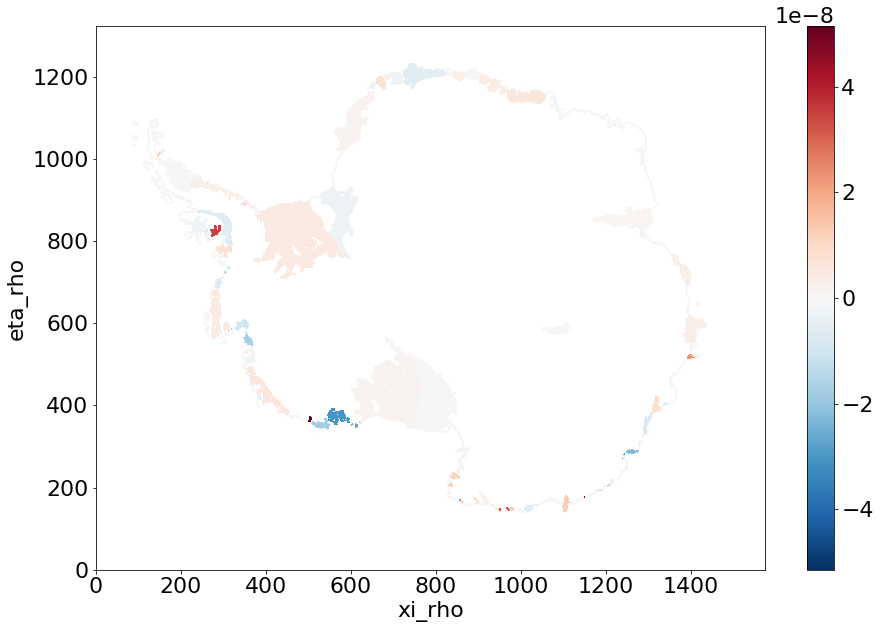

In [924]:
plt.close()
shelf_map.plot(size=10)
plt.show()

In [705]:
def plot_shelves(x_quant,y_quant,title,xlab,ylab,shelves_dict):
    n =  len(shelves_dict)
    color=iter(plt.cm.rainbow(np.linspace(0,1,n)))

    plt.close()
    fig,ax = plt.subplots(figsize=(10,8))
    
    x_all=[]
    y_all=[]

    for key,data in log_progress(shelves_dict.items(),every=2):
        c = next(color)
            
        x = x_quant.squeeze().where(data['mask']).values.flatten()
        mask = (np.isnan(x)==False)
        x = x[mask]
        y = y_quant.squeeze().where(data['mask']).values.flatten()[mask]
        

        ax.plot(x,y,'.',ms=0.1,c=c,label=key)
        #ax.legend(markerscale=100)
        ax.set_xlabel(xlab)
        ax.set_ylabel(ylab)
        ax.set_title(title)
        x_all.extend(list(x))
        y_all.extend(list(y))
    x_all = np.array(x_all)
    y_all = np.array(y_all)
    ax.set_xlim([x_all.mean()-1*x_all.std(),x_all.mean()+1*x_all.std()])
    ax.set_ylim([y_all.mean()-1*y_all.std(),y_all.mean()+1*y_all.std()])
    plt.savefig(os.path.join(fig_dir,'tmp','scatter_shelves_'+title.replace('/','_')+'.png'),format='png',dpi=400,bbox_inches = "tight")    

    plt.show() 

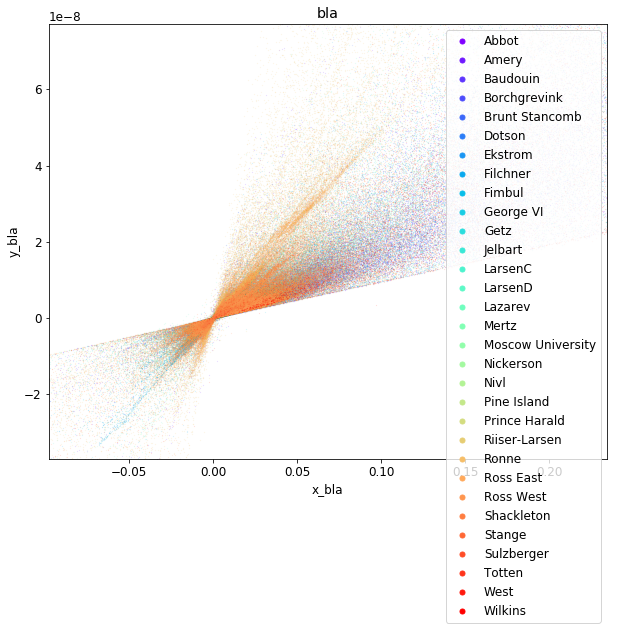

In [704]:
plot_shelves(Tdr2,m2,'bla','x_bla','y_bla',big_shelves2)

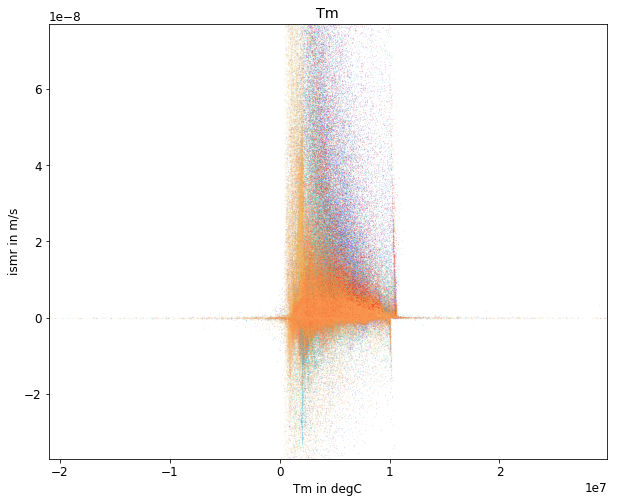

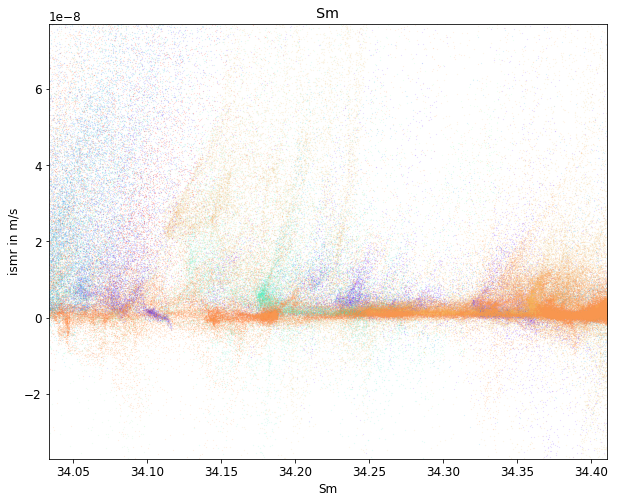

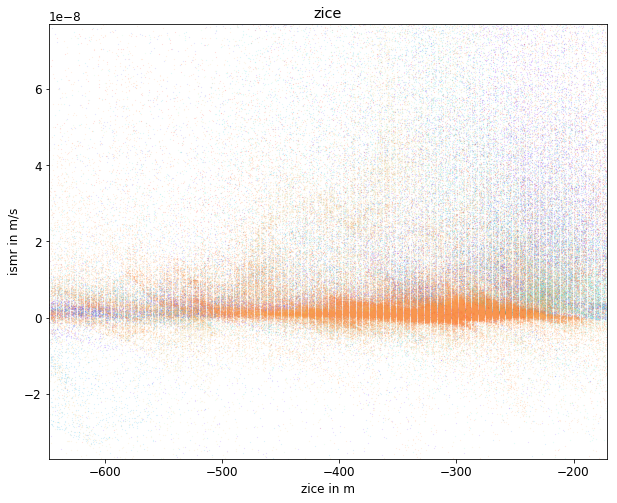

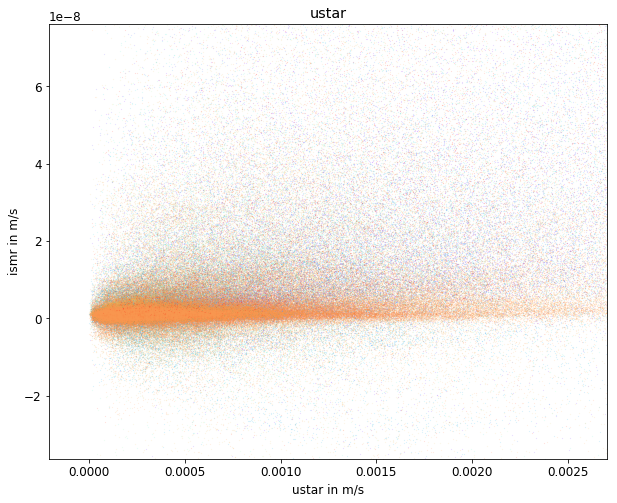

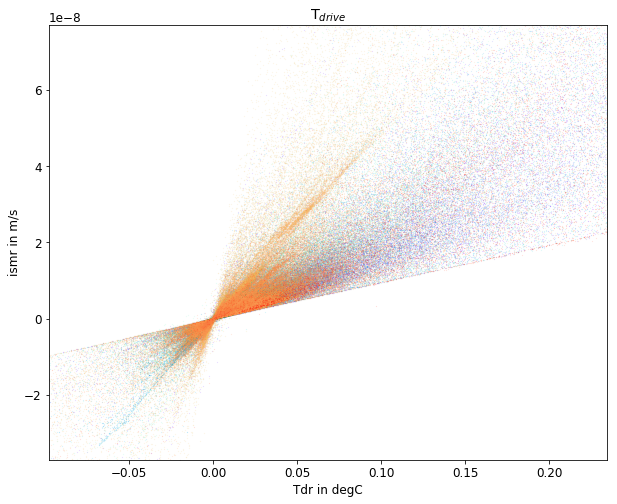

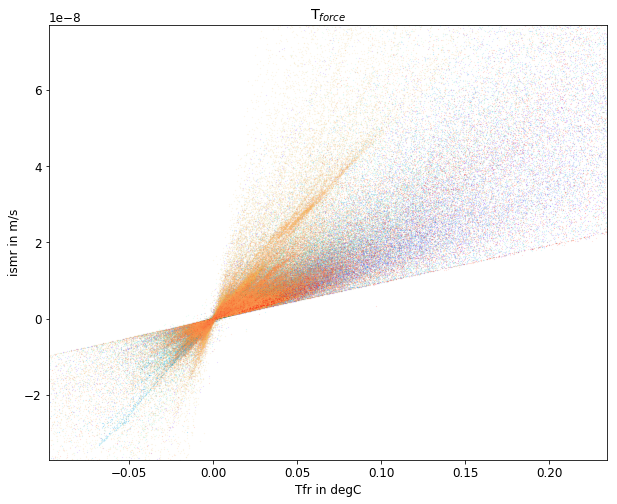

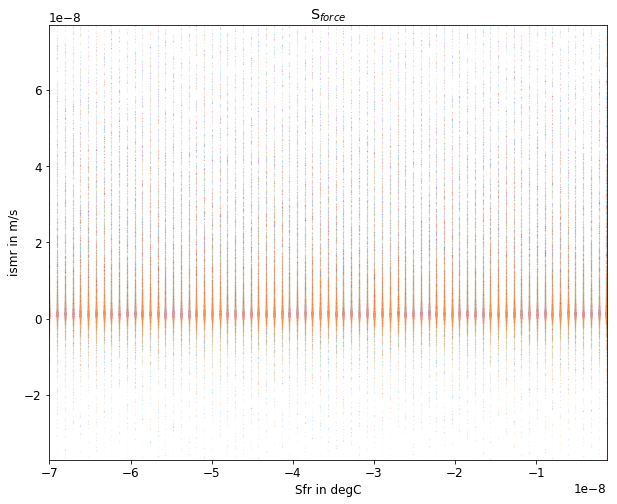

In [706]:
for qunat,title,xlab in zip([Tm2,Sm2,zice2,ustar2,Tdr2,Tfr2,Sfr2],
                            ['Tm','Sm','zice','ustar','T$_{drive}$','T$_{force}$','S$_{force}$'],
                             ['Tm in degC','Sm','zice in m','ustar in m/s','Tdr in degC','Tfr in degC','Sfr in degC']):
    plot_shelves(qunat,m2,title,xlab,'ismr in m/s',big_shelves2)

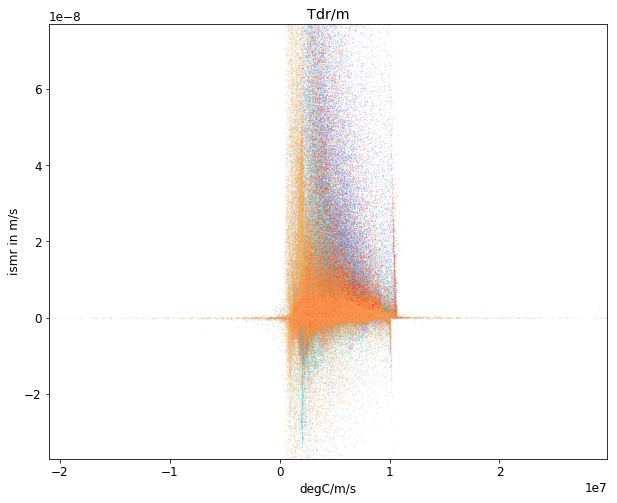

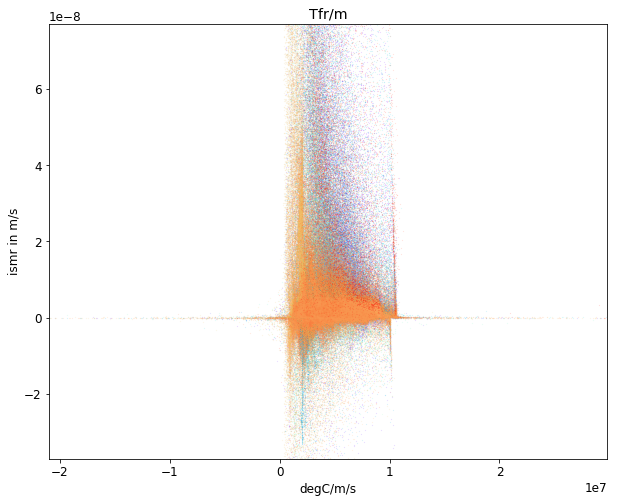

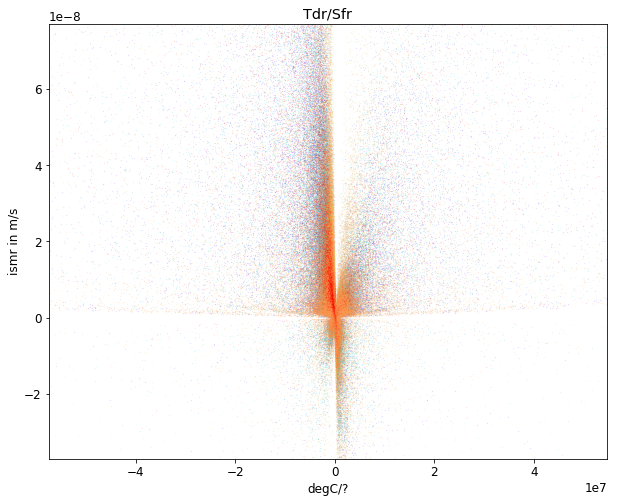

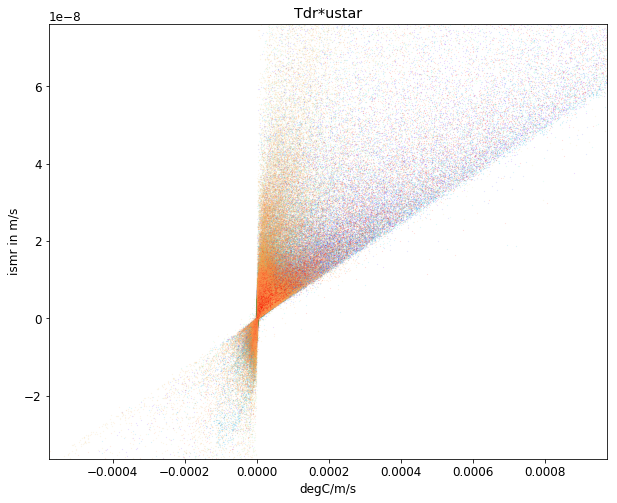

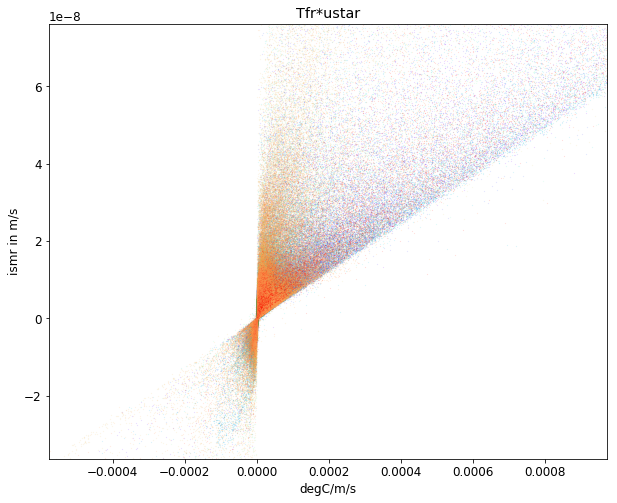

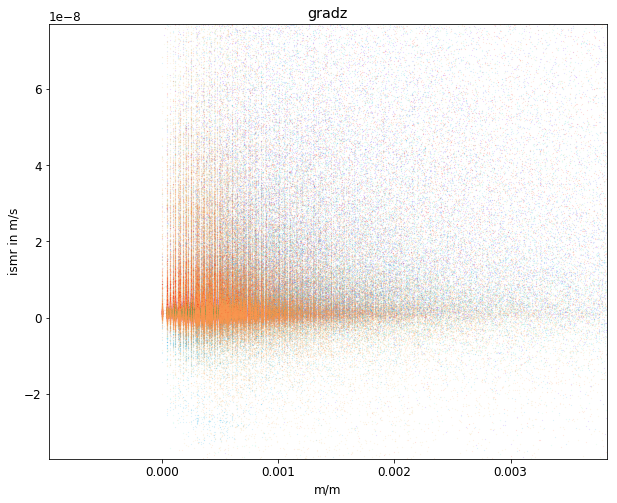

In [707]:
for qunat,title,xlab in zip([Tdr2/m2,Tfr2/m2,Tdr2/Sfr2,Tdr2*ustar2,Tfr2*ustar2,gradz],
                            ['Tdr/m','Tfr/m','Tdr/Sfr','Tdr*ustar','Tfr*ustar','gradz'],
                            ['degC/m/s','degC/m/s','degC/?','degC/m/s','degC/m/s','m/m']):
    plot_shelves(qunat,m2,title,xlab,'ismr in m/s',big_shelves2)

In [218]:
def get_fit(x,y):
    fit = np.polyfit(x[x>0],y[x>0],1)
    return np.poly1d(fit)

In [242]:
def plot_fast(star,m,tit,xlab,ylab):
    
    x = star.values.flatten()
    mask = (np.isnan(x)==False)
    x = x[mask]
    y = m.values.flatten()[mask]
    #fit = get_fit(x,y)

    plt.close()
    fig = plt.figure(figsize=(10,8))
    plt.plot(x,y,'.')
    #plt.plot(x,fit(x),'r-')
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    plt.title(tit)
    plt.show()   

Slope:  3.121143187462322e-07  Offset:  -8.5635576203834e-10


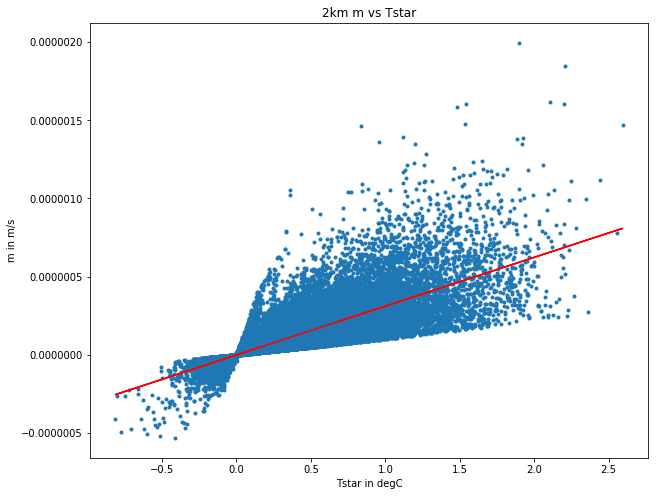

In [163]:
plot_fast(Tstar2,m2,'2km m vs Tstar','Tstar in degC','m in m/s')

Slope:  0.0003506687786645303  Offset:  -8.640233828436979e-09


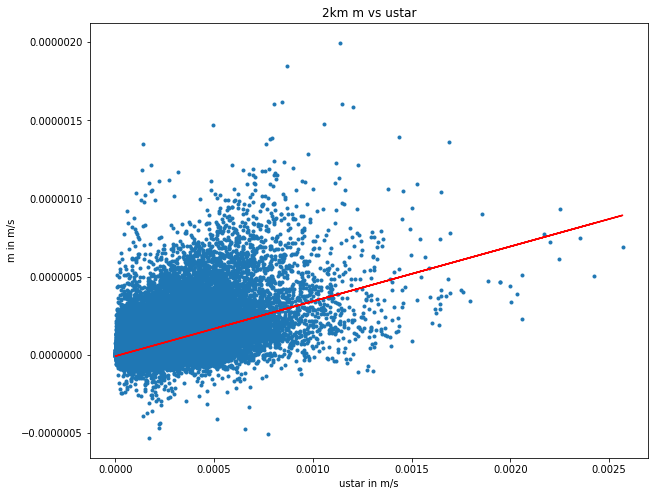

In [164]:
plot_fast(ustar2,m2,'2km m vs ustar','ustar in m/s','m in m/s')

Slope:  0.0009353652494405494  Offset:  1.034857408938058e-08


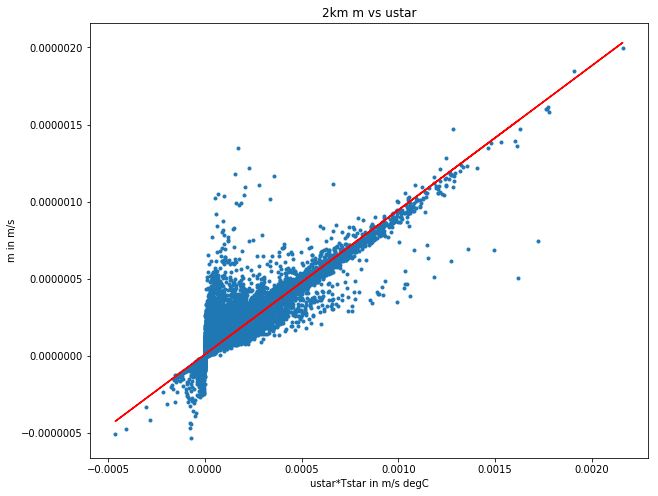

In [165]:
plot_fast(ustar2*Tstar2,m2,'2km m vs ustar','ustar*Tstar in m/s degC','m in m/s')

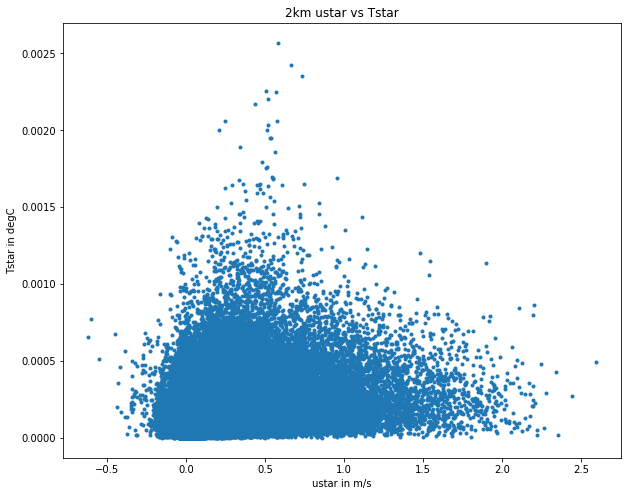

In [243]:
plot_fast(Tstar2,ustar2,'2km ustar vs Tstar','ustar in m/s','Tstar in degC')

In [249]:
def plot_bins(star,m,group,title,xlabel,ylabel):

    group = group.values.flatten()

    x_all = star.values.flatten()
    mask = (np.isnan(x_all) | np.isnan(group))==False
    x_all = x_all[mask]
    y_all = m.values.flatten()[mask]

    group = group[mask]
    bins = np.linspace(group.min(),group.max(),10)
    
    plt.close()
    plt.plot(x_all,y_all,'b.')
    #fit = get_fit(x_all,y_all)
    #plt.plot(x_all,fit(x_all),'r-')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show() 
    print('Group between: ALL POINTS')
    print('Points: ',np.size(x_all))
    print('Slope: ',fit[1],' Offset: ',fit[0])

    for lower,upper in zip(bins[:-1],bins[1:]):
        plt.close()
        fig = plt.figure()
        ii = (group>lower) & (group <upper)
        x = x_all[ii]
        y = y_all[ii]

        plt.plot(x,y,'b.')
        #fit = get_fit(x,y)
        #plt.plot(x,fit(x),'r-')
        plt.xlim(x_all.min(),x_all.max())
        plt.ylim(y_all.min(),y_all.max())
        plt.title(title)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.show() 
        print('Group between: ',lower,upper)
        print('% of points: ',np.size(x)/np.size(x_all)*100)
        print('Slope: ',fit[1],' Offset: ',fit[0])

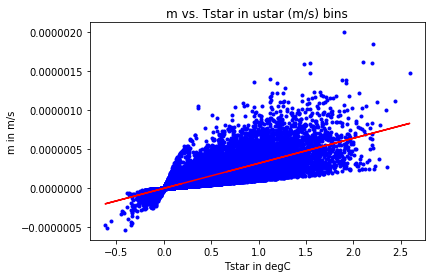

Group between: ALL POINTS
Points:  374455
Slope:  3.2023738879169286e-07  Offset:  -6.199991890188218e-10


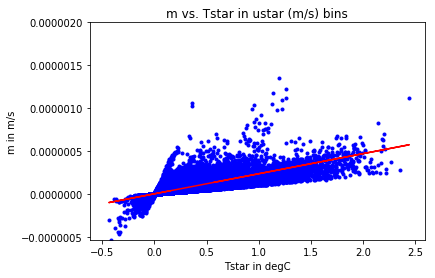

Group between:  9.174232218356337e-08 0.0002855010548551541
% of points:  93.63287978528795
Slope:  2.3328774629075438e-07  Offset:  2.54381628899207e-09


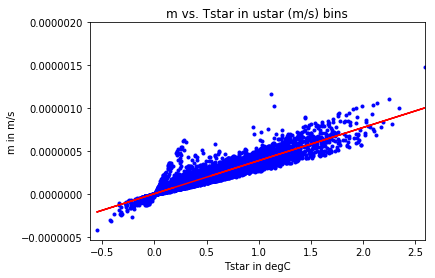

Group between:  0.0002855010548551541 0.0005709103673881247
% of points:  5.469014968420772
Slope:  3.846276908974223e-07  Offset:  3.599821980827365e-09


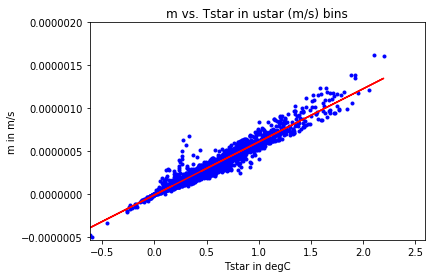

Group between:  0.0005709103673881247 0.0008563196799210953
% of points:  0.7133033341790068
Slope:  6.165782671613962e-07  Offset:  -1.0503104917965172e-08


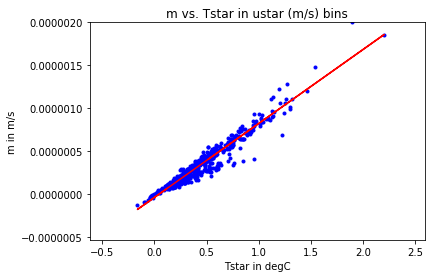

Group between:  0.0008563196799210953 0.0011417289924540658
% of points:  0.13406150271728243
Slope:  8.593894749285207e-07  Offset:  -3.919890537746902e-08


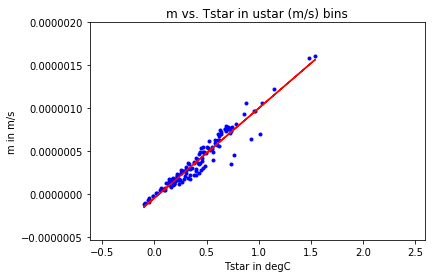

Group between:  0.0011417289924540658 0.0014271383049870364
% of points:  0.03525123179020176
Slope:  1.0436274713584913e-06  Offset:  -4.623085949660162e-08


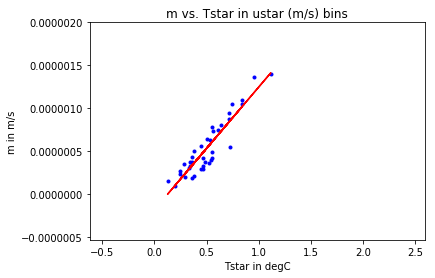

Group between:  0.0014271383049870364 0.001712547617520007
% of points:  0.010148081878997477
Slope:  1.4250876384598088e-06  Offset:  -1.8170789472586937e-07


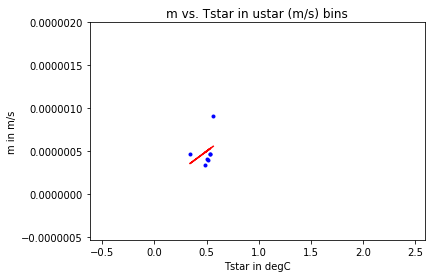

Group between:  0.001712547617520007 0.0019979569300529777
% of points:  0.001869383504025851
Slope:  8.981097006432854e-07  Offset:  4.8463256307760135e-08


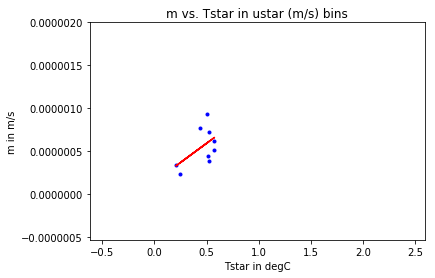

Group between:  0.0019979569300529777 0.002283366242585948
% of points:  0.0024034930766046654
Slope:  8.92591709265595e-07  Offset:  1.43522602223467e-07


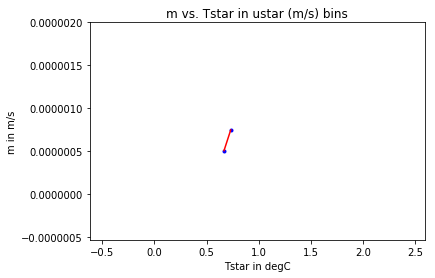

Group between:  0.002283366242585948 0.0025687755551189184
% of points:  0.0005341095725788146
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


In [239]:
plot_bins(Tstar2,m2,ustar2,'m vs. Tstar in ustar (m/s) bins','Tstar in degC','m in m/s')

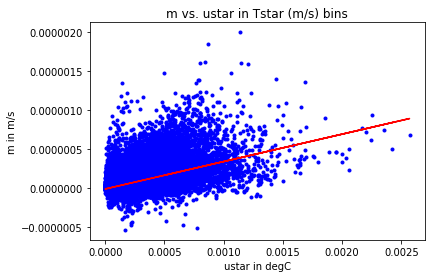

Group between: ALL POINTS
Points:  374455
Slope:  0.0003506687786645303  Offset:  -8.640233828436979e-09


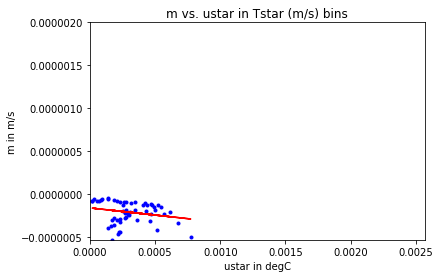

Group between:  -0.6190300939928219 -0.26209986331966956
% of points:  0.015222122818496216
Slope:  -0.00016647316626238506  Offset:  -1.6150239243033192e-07


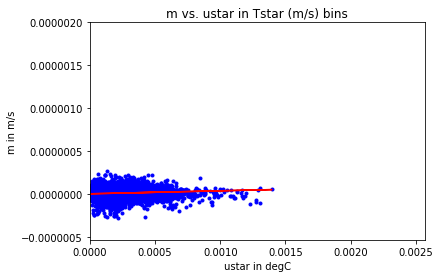

Group between:  -0.26209986331966956 0.09483036735348283
% of points:  78.32476532560655
Slope:  3.4908306648337126e-05  Offset:  2.6401385137311463e-09


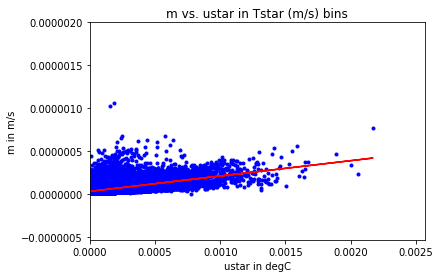

Group between:  0.09483036735348283 0.45176059802663526
% of points:  17.628019388177485
Slope:  0.00017836437767977057  Offset:  3.1095928562188095e-08


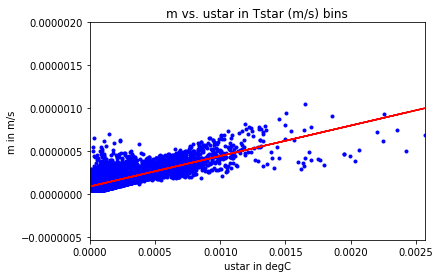

Group between:  0.45176059802663526 0.8086908286997876
% of points:  2.732504573313215
Slope:  0.00035412123838496  Offset:  8.790926328680932e-08


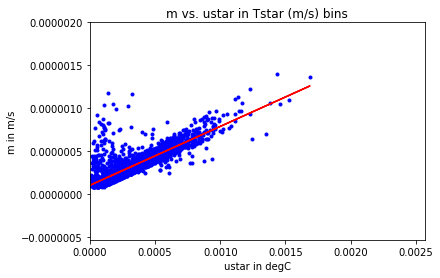

Group between:  0.8086908286997876 1.16562105937294
% of points:  0.8527059326220774
Slope:  0.0006845002090884811  Offset:  1.0162197133542866e-07


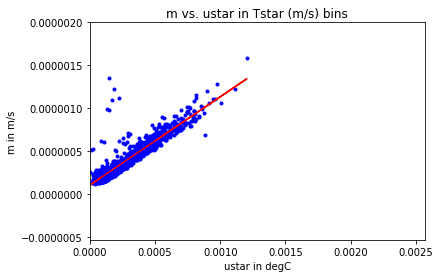

Group between:  1.16562105937294 1.5225512900460925
% of points:  0.3041754015836349
Slope:  0.0010268519850240524  Offset:  1.0427940125832693e-07


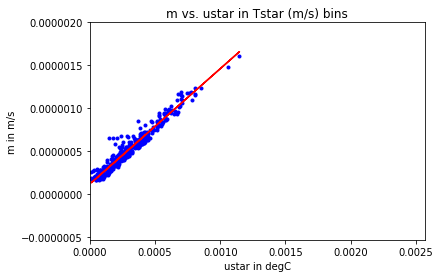

Group between:  1.5225512900460925 1.8794815207192448
% of points:  0.11189595545526164
Slope:  0.0013404373400523531  Offset:  1.1733203421381256e-07


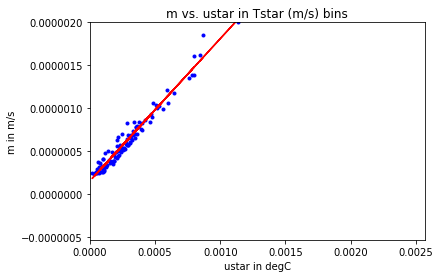

Group between:  1.8794815207192448 2.236411751392397
% of points:  0.028574862132966578
Slope:  0.0016544130499060324  Offset:  1.52721889836987e-07


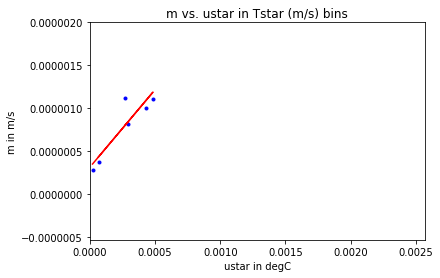

Group between:  2.236411751392397 2.5933419820655494
% of points:  0.0016023287177364437
Slope:  0.0018026557515355155  Offset:  3.1307449073016645e-07


In [237]:
plot_bins(ustar2,m2,Tstar2,'m vs. ustar in Tstar (m/s) bins','ustar in degC','m in m/s')

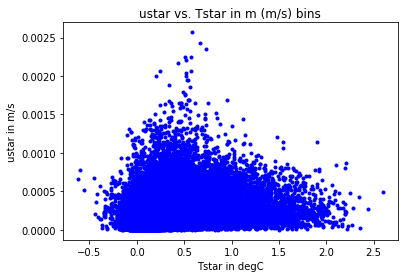

Group between: ALL POINTS
Points:  403008
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/numpy/core/_methods.py:32: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial)
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/numpy/core/_methods.py:28: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial)


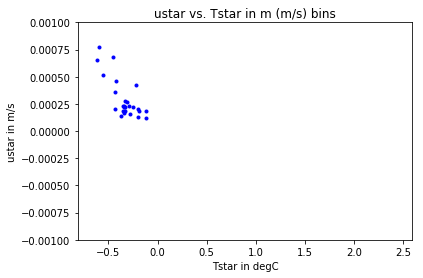

Group between:  -5.32385627138865e-07 -2.514369346802899e-07
% of points:  0.01588057805304113
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


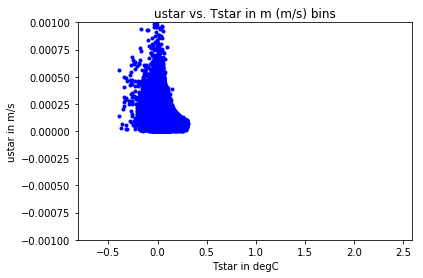

Group between:  -2.514369346802899e-07 2.9511757778285184e-08
% of points:  78.74732015245355
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


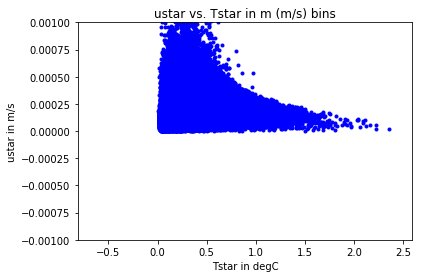

Group between:  2.9511757778285184e-08 3.104604502368602e-07
% of points:  20.226397490868667
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


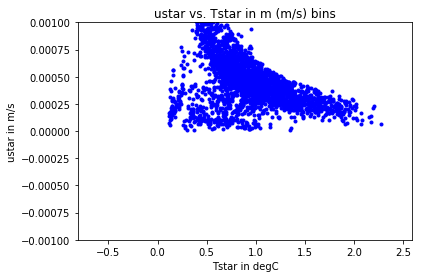

Group between:  3.104604502368602e-07 5.914091426954353e-07
% of points:  0.8210755121486422
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


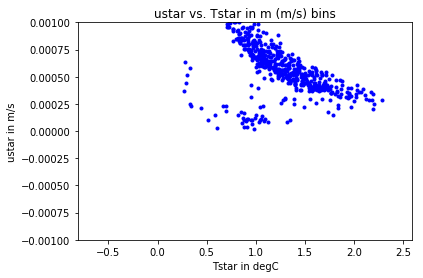

Group between:  5.914091426954353e-07 8.723578351540104e-07
% of points:  0.15086549150389073
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


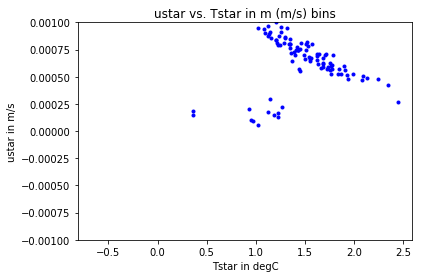

Group between:  8.723578351540104e-07 1.1533065276125853e-06
% of points:  0.030272351913609656
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


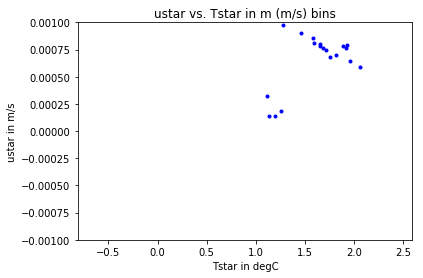

Group between:  1.1533065276125853e-06 1.4342552200711607e-06
% of points:  0.005707082737811656
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


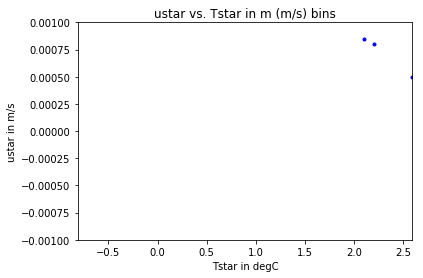

Group between:  1.4342552200711607e-06 1.7152039125297356e-06
% of points:  0.0017369382245513737
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


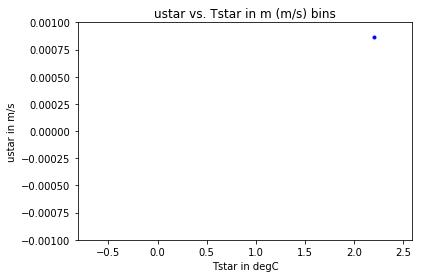

Group between:  1.7152039125297356e-06 1.9961526049883105e-06
% of points:  0.00024813403207876765
Slope:  3.7356299270743743e-06  Offset:  -1.9881703346567377e-06


In [250]:
plot_bins(Tstar2,ustar2,m2,'ustar vs. Tstar in m (m/s) bins','Tstar in degC','ustar in m/s')

In [146]:
mask4=((grd4.mask_rho==1) & (grd4.zice < 0.0))

ustar4 = calc_ustar(avg4.u,avg4.v,mask4)
Tstar4 = calc_Tstar(avg4.salt,avg4.temp,grd4.zice,mask4)
mstar4 = avg4.m.where(mask4).mean('ocean_time')

ustar4nt = calc_ustar(avg4_nt.u,avg4_nt.v,mask4)
Tstar4nt = calc_Tstar(avg4_nt.salt,avg4_nt.temp,grd4.zice,mask4)
mstar4nt = avg4_nt.m.where(mask4).mean('ocean_time')

In [4]:
mask2=((grd2.mask_rho==1) & (grd2.zice < 0.0))

ustar2 = calc_ustar(u2,v2,mask2)
Tstar2 = calc_Tstar(salt2,temp2,grd2.zice,mask2)
mstar2 = m2.where(mask2).mean('ocean_time')

NameError: name 'Cd' is not defined

In [115]:
def get_fit(x,y):
    fit = np.polyfit(x[x>0],y[x>0],1)
    return np.poly1d(fit)

In [ ]:
plt.close()
plot(Tstar.flatten().dropna)

In [268]:
def plot_star(x4in,x4ntin,x2in,xlim,ylim,xlabel,out_path=False):
    plt.close()
    fig,axes = plt.subplots(ncols=3,nrows=3,figsize=(14,12))

    for ax,(sec_name,sec_mask) in log_progress(zip(axes.flatten(),sector4.items()),every=2):

        mask4sec = sec_mask & mask4
        y4 = mstar4.values[mask4sec]*s2a
        x4 = x4in.values[mask4sec]
        fit4 = get_fit(x4,y4)

        y4nt = mstar4nt.values[mask4sec]*s2a
        x4nt = x4ntin.values[mask4sec]
        fit4nt = get_fit(x4nt,y4nt)

        mask2sec = sector2[sec_name] & mask2
        y2 = mstar2.values[mask2sec]*s2a
        x2 = x2in.values[mask2sec]
        fit2 = get_fit(x2,y2)

        ax.plot(x2,y2,'r.',alpha=1,markersize=1)
        ax.plot(x2,fit2(x2),'r-',alpha=1,label='2km')

        ax.plot(x4,y4,'b.',alpha=1,markersize=1)
        ax.plot(x4,fit4(x4),'b-',alpha=1,label='4km')

        ax.plot(x4nt,y4nt,'g.',alpha=1,markersize=1)
        ax.plot(x4nt,fit4nt(x4nt),'g-',alpha=1,label=' 4km no tides')

        ax.set_title(sec_name)

        for ax in axes.flatten():
            ax.set_xlim(xlim)
            ax.set_ylim(ylim)

        for ax in axes.flatten()[6:]:
            ax.set_xlabel(xlabel)
        for ax in axes.flatten()[[0,3,6]]:
            ax.set_ylabel('Ice shelf melting (m/yr)')

    axes[0,2].legend()
    plt.tight_layout()
    
    if out_path:
        plt.savefig(out_path,dpi=300,bbox_to_anchor='tight')
    plt.show()

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


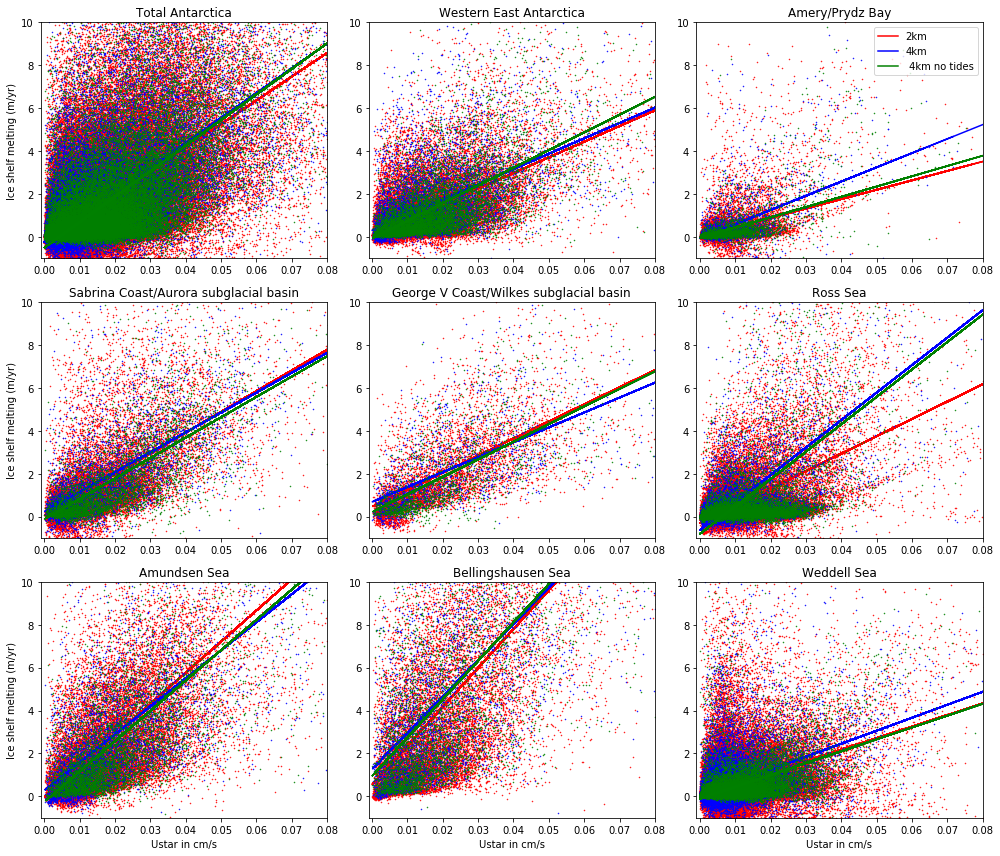

In [269]:
plot_star(ustar4*100,ustar4nt*100,ustar2*100,[-0.001,0.08],[-1,10],'Ustar in cm/s',
         os.path.join(fig_dir,'tmp','ustar.png'))

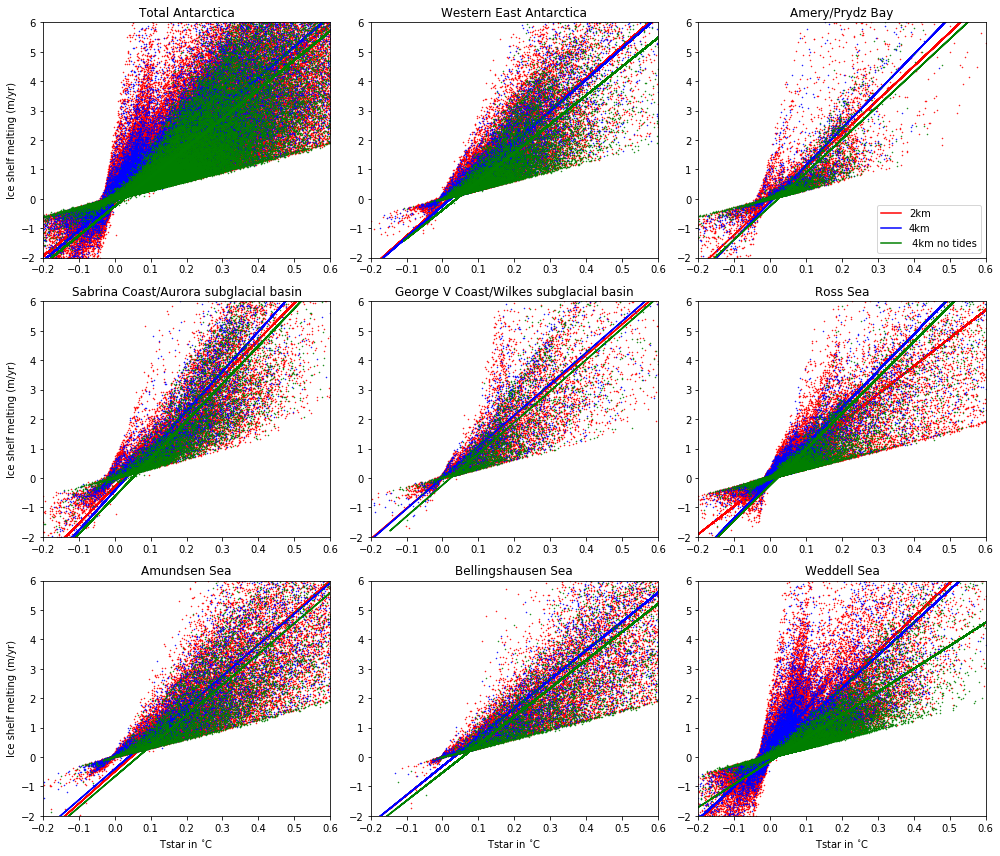

In [240]:
plot_star(Tstar4,Tstar4nt,Tstar2,[-0.2,0.6],[-2,6],'Tstar in $^{\circ}$C',
         os.path.join(fig_dir,'tmp','Tstar.png'))

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


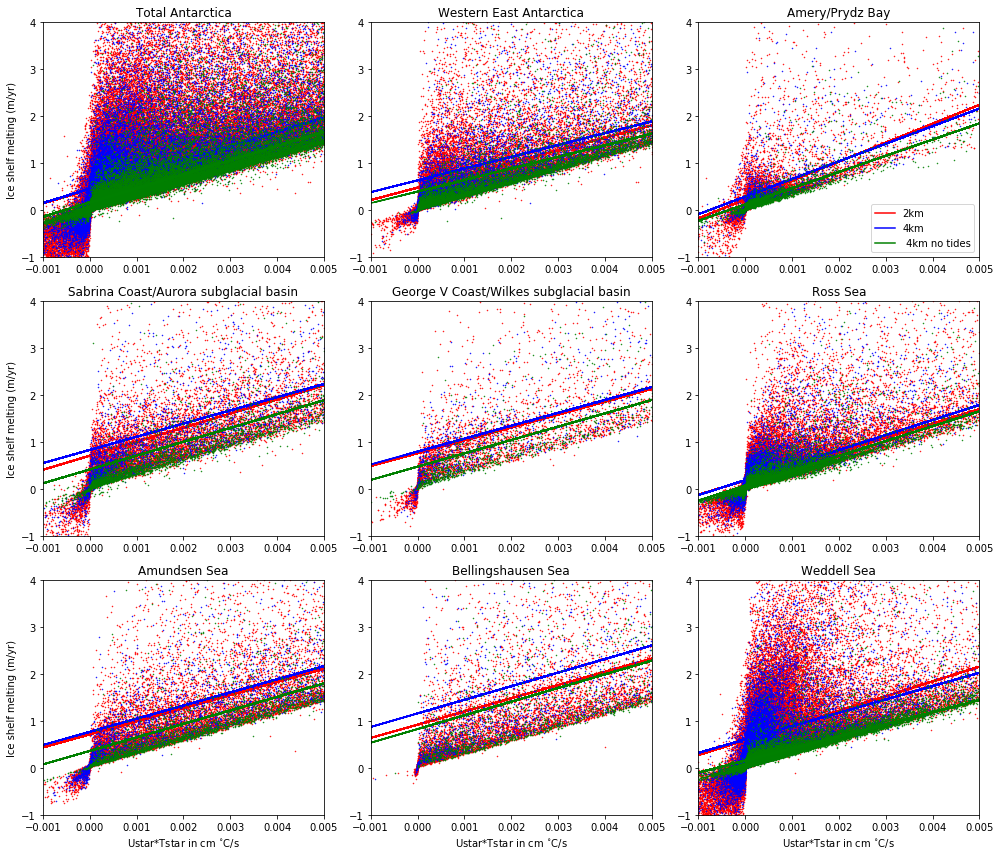

In [272]:
plot_star(ustar4*100*Tstar4,ustar4nt*100*Tstar4nt,ustar2*100*Tstar2,[-0.001,0.005],[-1,4],'Ustar*Tstar in cm $^{\circ}$C/s',
os.path.join(fig_dir,'tmp','ustarTstar.png'))

In [231]:
def plot_star_map(star,levels,label,cmap,out_path=False):


    plt.close()
    fig,ax = plt.subplots(figsize=(14,10'Tstar in $^{\circ}$C'))
    ax.contourf(grd4.mask_rho.where(grd4.mask_rho==0),colors=(('0.6','0.6','0.6')))
    img = star.plot.contourf(ax=ax,levels=levels,add_colorbar=False,cmap=cmap)
    plt.colorbar(img,ax=ax,label=label)
    for k,sec_mask in sector4.items():
            sec_mask.where((grd.mask_rho ==1)&(grd.zice==0.0)).plot.contour(colors=('black'),linewidths=0.1,ax=ax) 
    ax.set_aspect('equal')
    ax.axis('off')
    plt.tight_layout()
    if out_path:
        plt.savefig(out_path,dpi=300,bbox_to_anchor='tight')
    plt.show()

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/matplotlib/contour.py:1230: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


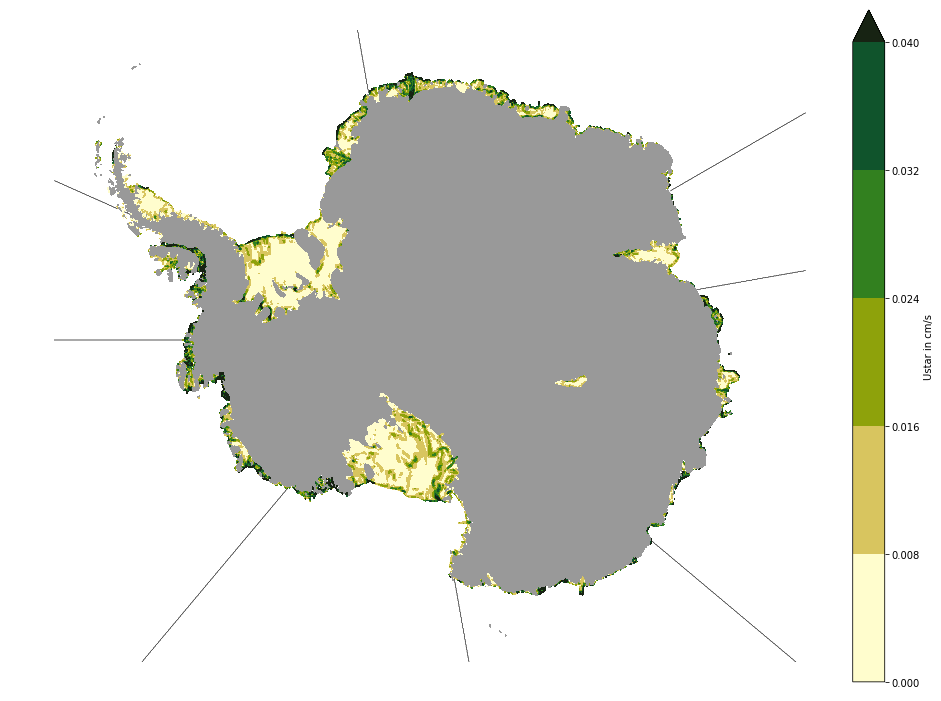

In [244]:
plot_star_map(ustar4*100,np.linspace(0,0.04,6),'Ustar in cm/s',ocm.speed,
         os.path.join(fig_dir,'tmp','ustar_map.png'))

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/matplotlib/contour.py:1230: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


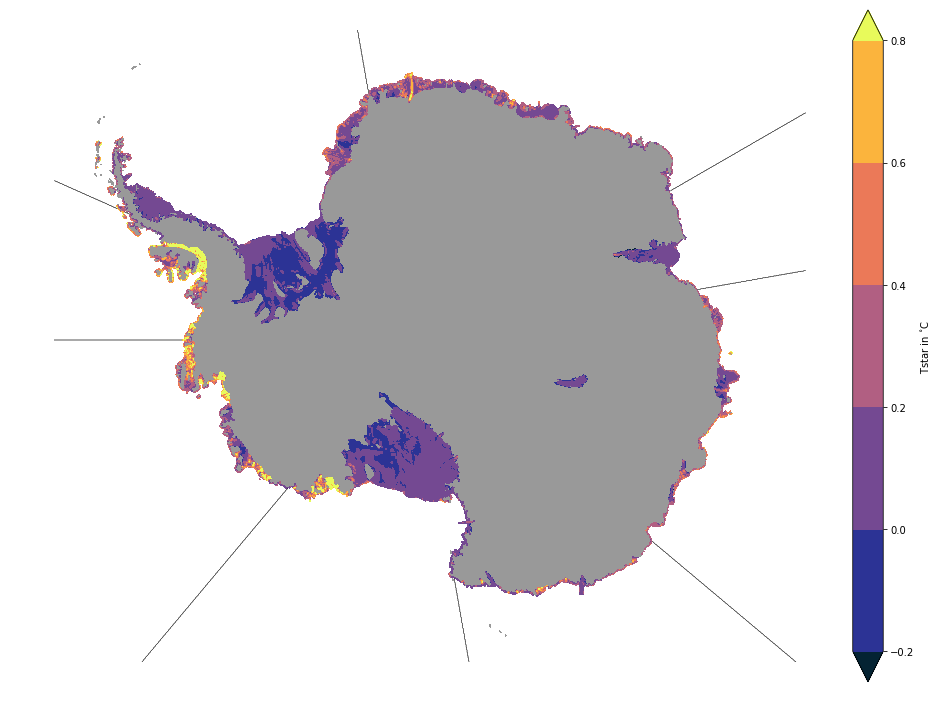

In [245]:
plot_star_map(Tstar4,np.linspace(-0.2,0.8,6),'Tstar in $^{\circ}$C',ocm.thermal,
         os.path.join(fig_dir,'tmp','Tstar_map.png'))

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/matplotlib/contour.py:1230: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


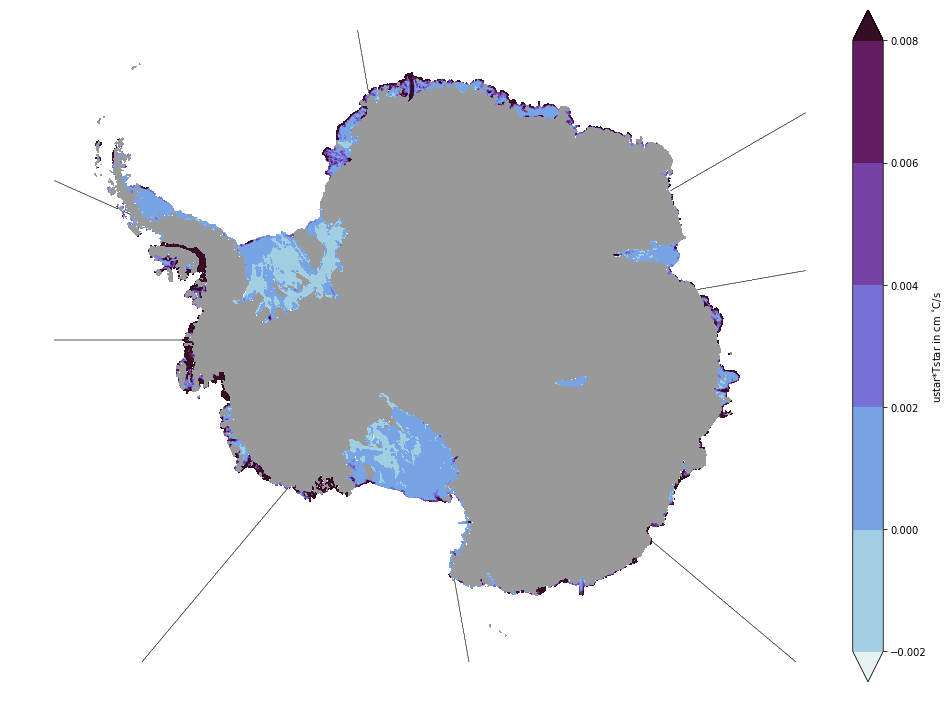

In [263]:
plot_star_map(Tstar4*ustar4*100,np.linspace(-0.002,0.008,6),'ustar*Tstar in cm $^{\circ}$C/s',ocm.dense,
         os.path.join(fig_dir,'tmp','ustrTstar_map.png'))

In [6]:
shelves_path = os.path.join(data_dir,'analysis','interim','shelves2.npy')
shelves = np.load(shelves_path).item()

In [12]:
test = dict((k, shelves[k]) for k in ('Abbot', 'Ronne', 'Amery'))

In [35]:
for shelf_name,shelf_data in log_progress(shelves.items(),every=2):
    mask = shelf_data['mask']
    shelves[shelf_name]['ustar']=calc_ustar(u2,v2,mask).mean()
    shelves[shelf_name]['tstar']=calc_Tstar(salt2,temp2,grd2.zice,mask).mean()
    shelves[shelf_name]['mstar']=m2.where(mask).mean()

In [91]:
import pandas as pd
melt = pd.read_csv(os.path.join(proj_dir,'reports','tables','2km_mass_loss_all.csv'),index_col=0)
melt.loc['Pine Island']['A']

5.688085712174944

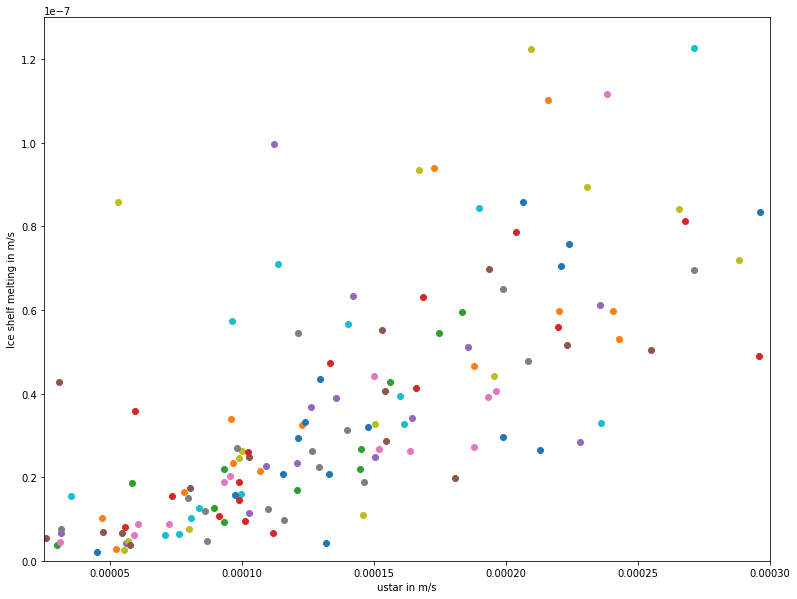

In [138]:
%matplotlib inline
plt.close()
fig,ax = plt.subplots(figsize=(13,10))
for name,data in shelves.items():
    x = data['ustar'].values
    y = data['mstar'].values
    if np.isnan([x,y]).any():
        #print(name+' out due to nan')
        continue
    #if melt.loc[name]['A'] < 5: 
        #print(name+' out due to small')
     #   continue
    #print(name,x,y)
    ax.scatter(x, y)
    #ax.annotate(name,(x,y))
ax.set_ylabel('Ice shelf melting in m/s')
ax.set_xlabel('ustar in m/s')
ax.set_xlim((0.000025,0.0003))
ax.set_ylim((0,0.00000013))
plt.savefig(os.path.join(fig_dir,'tmp','ustar_is_all'),dpi=300,bbox_to_anchor='tight')
plt.show()

In [63]:
x=3
y=np.nan
np.isnan([x,y]).any()

True

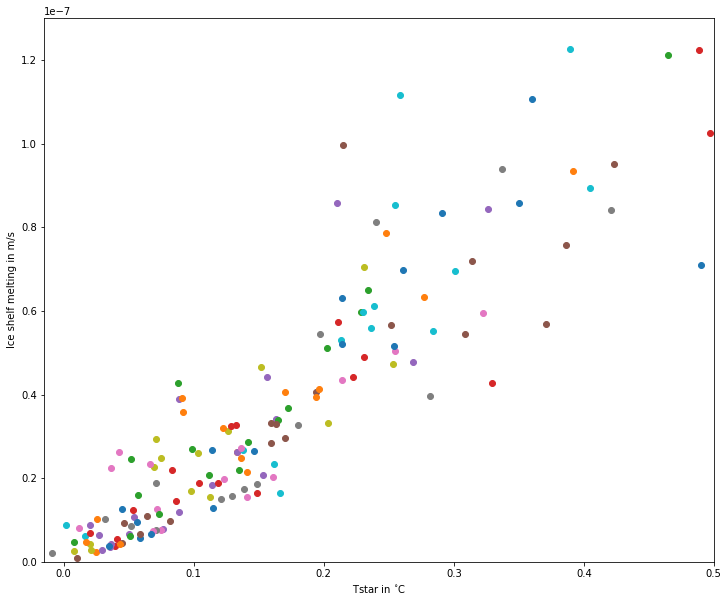

In [136]:
%matplotlib inline
plt.close()
fig,ax = plt.subplots(figsize=(12,10))
for name,data in shelves.items():
    x = data['tstar']
    y = data['mstar']
    if np.isnan([x,y]).any():
        #print(name+' out due to nan')
        continue
    #if melt.loc[name]['A'] < 5: 
        #print(name+' out due to small')
     #   continue
    #print(name,x,y)
    ax.scatter(x, y)
    #ax.annotate(name,(x,y))
ax.set_ylabel('Ice shelf melting in m/s')
ax.set_xlabel('Tstar in $^{\circ}$C')
ax.set_xlim((-0.015,0.5))
ax.set_ylim((0,0.00000013))
plt.savefig(os.path.join(fig_dir,'tmp','tstar_is_all'),dpi=300,bbox_to_anchor='tight')
plt.show()

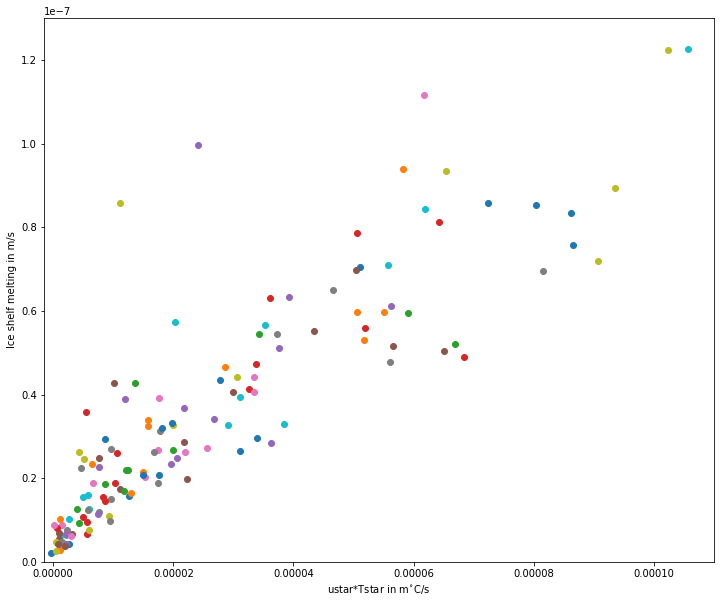

In [139]:
plt.close()
fig,ax = plt.subplots(figsize=(12,10))
for name,data in shelves.items():
    x = data['tstar']*data['ustar']
    y = data['mstar']
    if np.isnan([x,y]).any():
        #print(name+' out due to nan')
        continue
    #if melt.loc[name]['A'] < 5: 
        #print(name+' out due to small')
     #   continue
    #print(name,x,y)
    ax.scatter(x, y)
    #ax.annotate(name,(x,y))
ax.set_ylabel('Ice shelf melting in m/s')
ax.set_xlabel('ustar*Tstar in m$^{\circ}$C/s')
ax.set_xlim((-0.0000015,0.00011))
ax.set_ylim((0,0.00000013))
plt.savefig(os.path.join(fig_dir,'tmp','ustarTstar_is_all'),dpi=300,bbox_to_anchor='tight')
plt.show()

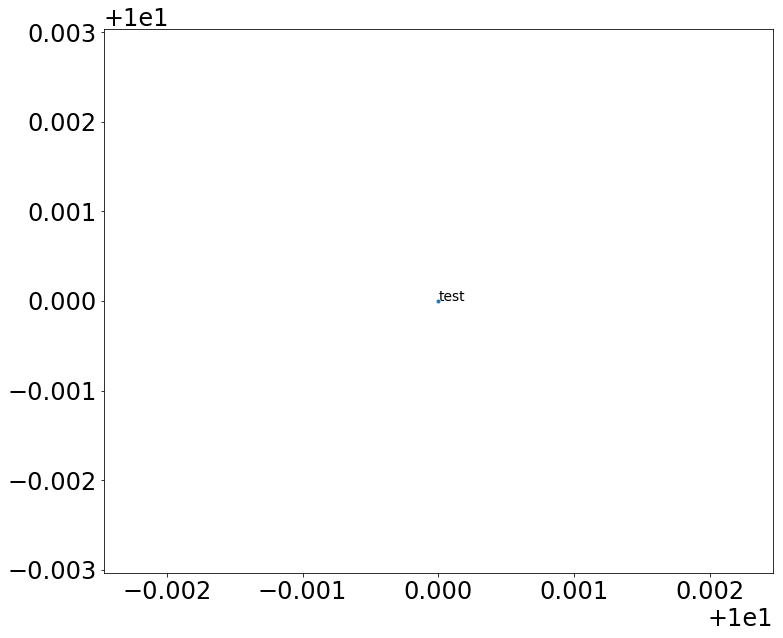

In [585]:
plt.close()
fig,ax = plt.subplots(figsize=(12,10))
ax.scatter(10,10,marker='.')
ax.annotate('test',(10,10),size='xx-small')
plt.show()

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  


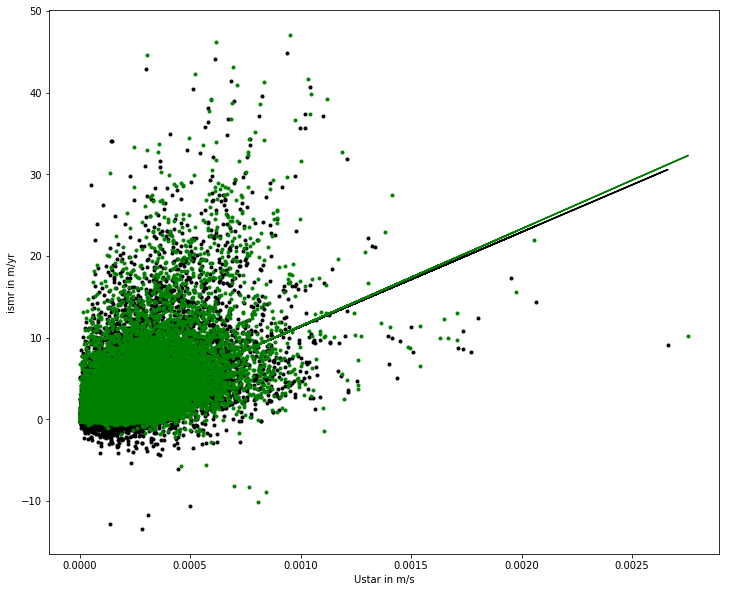

In [124]:
plot_star(ustar,ustar_nt,m,m_nt,'Ustar in m/s')

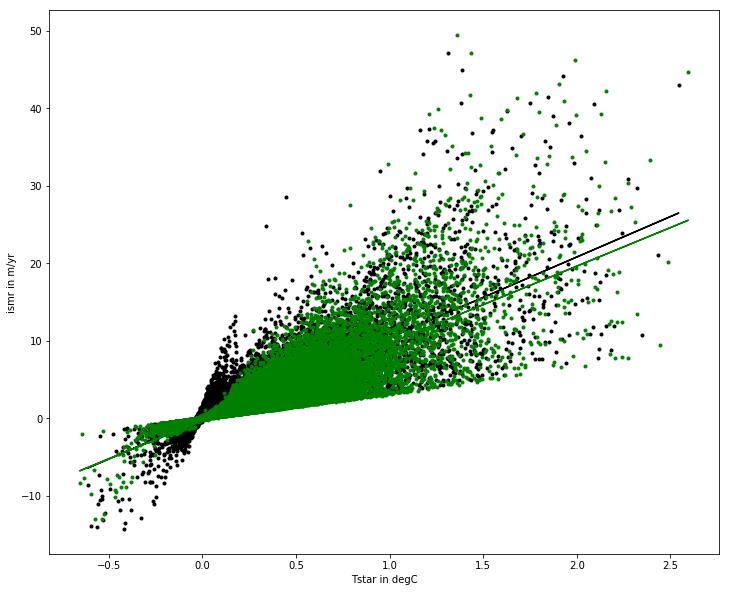

In [125]:
plot_star(Tstar,Tstar_nt,m,m_nt,'Tstar in degC')

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  


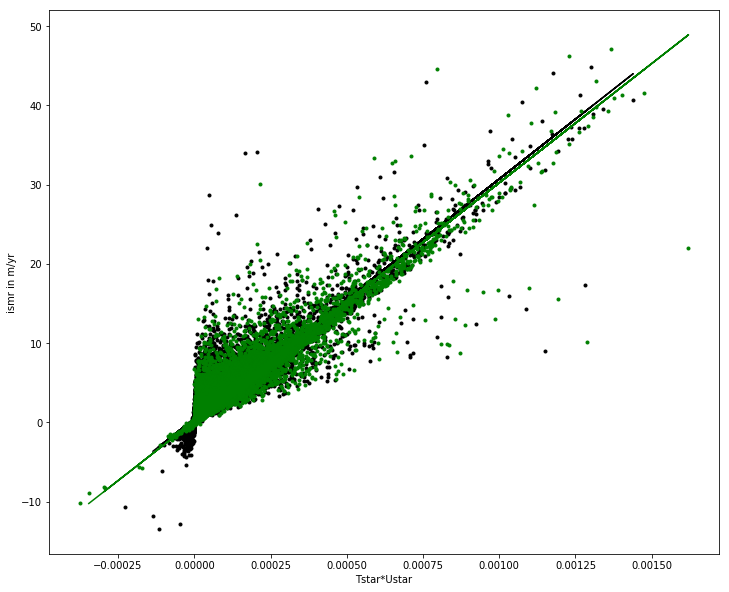

In [126]:
plot_star(Tstar*ustar,Tstar_nt*ustar_nt,m,m_nt,'Tstar*Ustar')

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in greater
  if sys.path[0] == '':


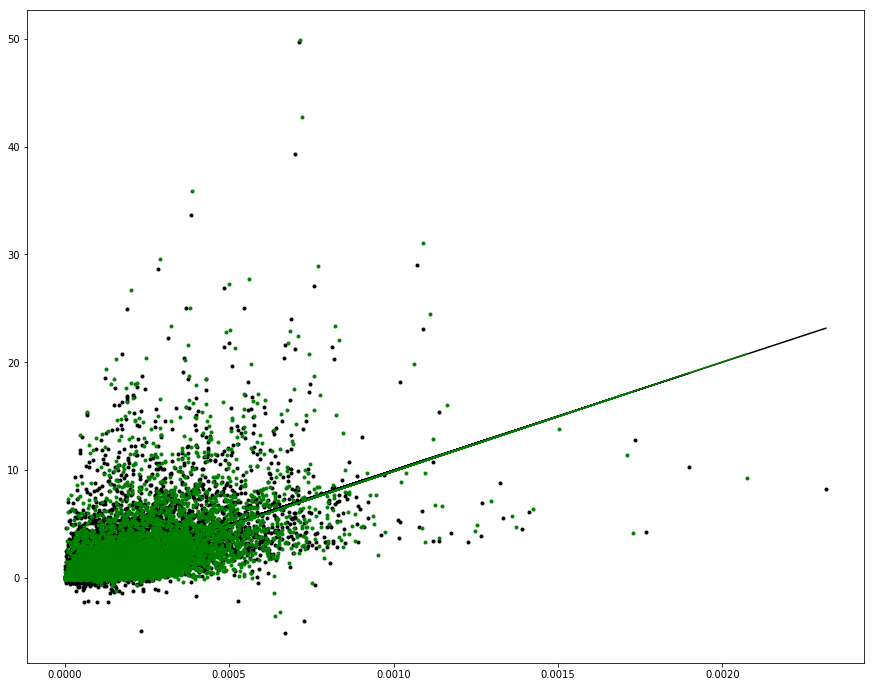

In [108]:
from scipy.stats import linregress

s2a = 3600*24*365.25
mask = (grd.mask_rho==1) & (grd.zice < 0.0)

y = m.values[mask]*s2a
x = ustar.values[mask]
fit = np.polyfit(x[x>0],y[x>0],1)
fit_fn = np.poly1d(fit) 
y2 = m_nt.values[mask]*s2a
x2 = ustar_nt.values[mask]
fit2 = np.polyfit(x2[x2>0],y2[x2>0],1)
fit_fn2 = np.poly1d(fit2)

plt.close()
fig,ax = plt.subplots(figsize=(15,12))
plt.plot(x,y,'k.',x,fit_fn(x),'k-',x2,y2,'g.',x2,fit_fn2(x2),'g-')
#plt.savefig(os.path.join(fig_dir,'ismr_vs_depth.png'),transparent=True,dpi=300)
plt.show()

In [105]:
fit

array([ 1.01503973e+04, -2.68975278e-01])

In [107]:
fit2

array([ 1.01503973e+04, -2.68975278e-01])

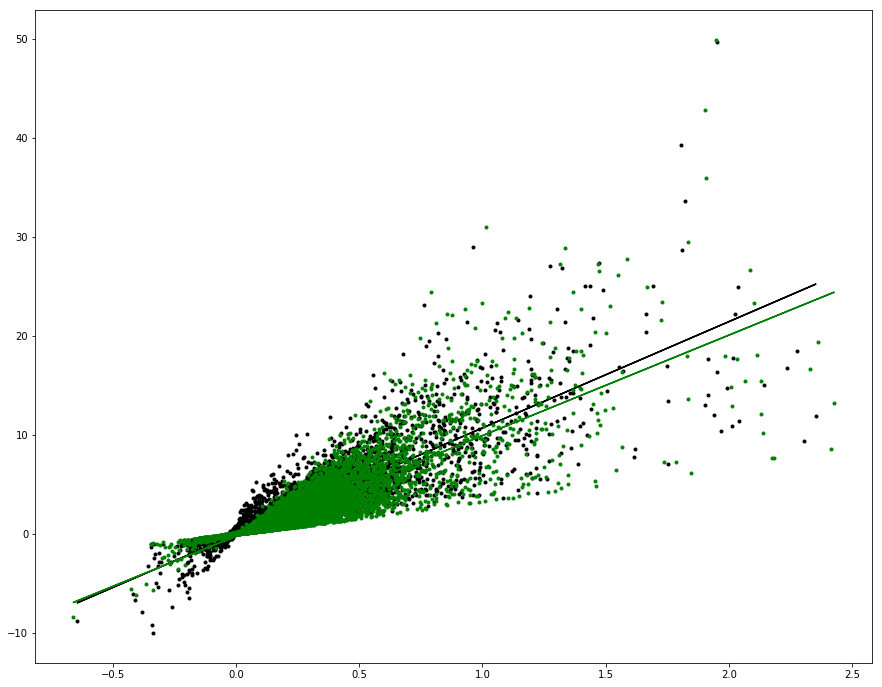

In [109]:
x = Tstar.values[mask]
fit = np.polyfit(x[x>0],y[x>0],1)
fit_fn = np.poly1d(fit) 
x2 = Tstar_nt.values[mask]
fit2 = np.polyfit(x2[x2>0],y2[x2>0],1)
fit_fn2 = np.poly1d(fit2)

plt.close()
fig,ax = plt.subplots(figsize=(15,12))
plt.plot(x,y,'k.',x,fit_fn(x),'k-',x2,y2,'g.',x2,fit_fn2(x2),'g-')
#plt.savefig(os.path.join(fig_dir,'ismr_vs_depth.png'),transparent=True,dpi=300)
plt.show()

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


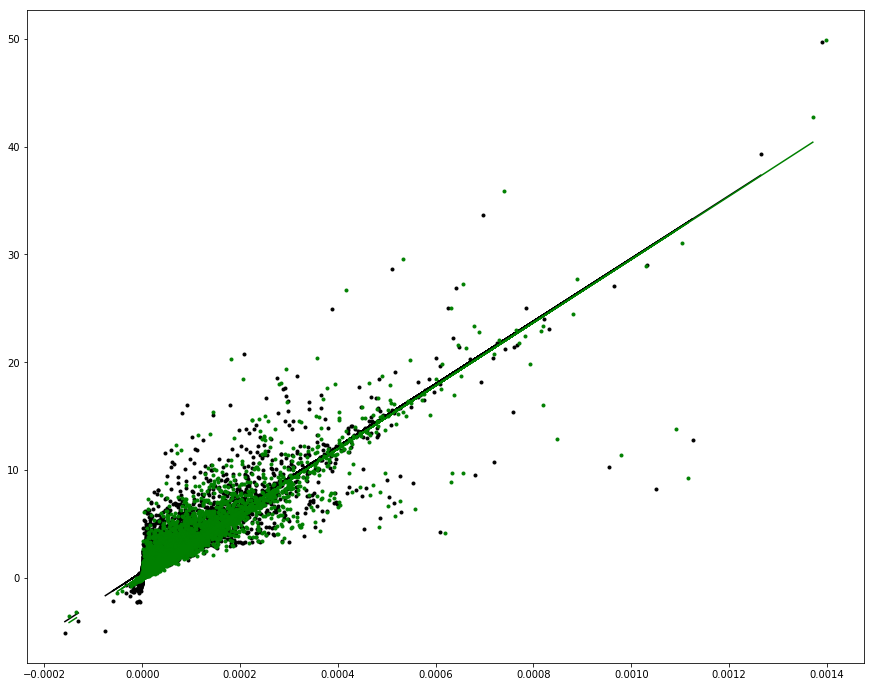

In [110]:
x = (Tstar*ustar).values[mask]
fit = np.polyfit(x[x>0],y[x>0],1)
fit_fn = np.poly1d(fit) 
x2 = (Tstar_nt*ustar_nt).values[mask]
fit2 = np.polyfit(x2[x2>0],y2[x2>0],1)
fit_fn2 = np.poly1d(fit2)

plt.close()
fig,ax = plt.subplots(figsize=(15,12))
plt.plot(x,y,'k.',x,fit_fn(x),'k-',x2,y2,'g.',x2,fit_fn2(x2),'g-')
#plt.savefig(os.path.join(fig_dir,'ismr_vs_depth.png'),transparent=True,dpi=300)
plt.show()

In [86]:
linregress?

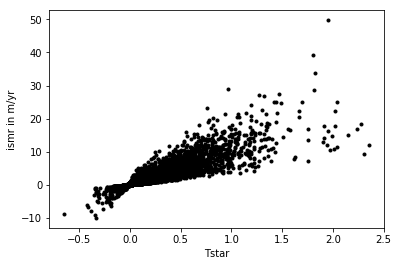

In [59]:
s2a = 3600*24*365.25
mask = (grd.mask_rho==1) & (grd.zice < 0.0)
y = m.values[mask]*s2a
x = Tstar.values[mask]
plt.close()
fig,ax = plt.subplots()
plt.plot(x,y,'k.')
plt.xlabel('Tstar')
plt.ylabel('ismr in m/yr')
#plt.savefig(os.path.join(fig_dir,'ismr_vs_depth.png'),transparent=True,dpi=300)
plt.show()

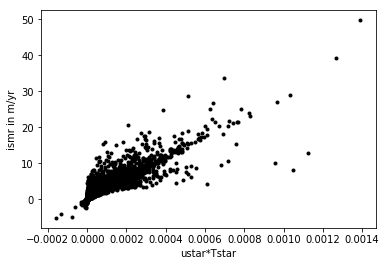

In [60]:
s2a = 3600*24*365.25
mask = (grd.mask_rho==1) & (grd.zice < 0.0)
y = m.values[mask]*s2a
x = (ustar*Tstar).values[mask]
plt.close()
fig,ax = plt.subplots()
plt.plot(x,y,'k.')
plt.xlabel('ustar*Tstar')
plt.ylabel('ismr in m/yr')
#plt.savefig(os.path.join(fig_dir,'ismr_vs_depth.png'),transparent=True,dpi=300)
plt.show()

In [755]:
grad = np.gradient(zice2,10000)
magGradz = np.sqrt(grad[0]**2 + grad[1]**2)
gradz2 = xr.DataArray(magGradz,dims=('eta_rho','xi_rho'),name='gradz').where(mask2)
gradz2.name = 'gradZice'

In [675]:
matplotlib.rcParams.update({'font.size': 12}) 

def plot_sector(x_qunat,y_quant,title,xlab,ylab):
    n =  len(sector2)-1
    color=iter(plt.cm.rainbow(np.linspace(0,1,n)))

    plt.close()
    fig,ax = plt.subplots(figsize=(10,8))

    x_all = []
    y_all = []
    for key,data in sector2.items():
        if key == 'Total Antarctica': continue
        c = next(color)
        x = x_qunat.where(data).values.flatten()
        mask = (np.isnan(x)==False)
        x = x[mask]
        y = y_quant.where(data).values.flatten()[mask]

        ax.plot(x,y,'.',ms=0.1,c=c,label=key)
        ax.legend(markerscale=100,fancybox=True, framealpha=0.5)
        #ax.set_xlim([x.mean()-1*x.std(),x.mean()+1*x.std()])
        #ax.set_ylim([y.mean()-1*y.std(),y.mean()+1*y.std()])
        ax.set_xlabel(xlab)
        ax.set_ylabel(ylab)
        ax.set_title(title)
        x_all.extend(list(x))
        y_all.extend(list(y))
    x_all = np.array(x_all)
    y_all = np.array(y_all)
    ax.set_xlim([x_all.mean()-1*x_all.std(),x_all.mean()+1*x_all.std()])
    ax.set_ylim([y_all.mean()-1*y_all.std(),y_all.mean()+1*y_all.std()])
    #plt.savefig(os.path.join(fig_dir,'tmp','scatter_sector_'+title.replace('/','_')+'.png'),format='png',dpi=400,bbox_inches = "tight")
    plt.show()   

In [ ]:
for qunat,title,xlab in zip([Tm2,Sm2,zice2,ustar2,Tdr2,Tfr2,Sfr2],
                            ['Tm','Sm','zice','ustar','T$_{drive}$','T$_{force}$','S$_{force}$'],
                             ['Tm in degC','Sm','zice in m','ustar in m/s','Tdr in degC','Tfr in degC','Sfr in degC']):
    plot_sector(qunat,m2,title,xlab,'ismr in m/s')

In [ ]:
for qunat,title,xlab in zip([Tdr2/m2,Tfr2/m2,Tdr2/Sfr2,Tdr2*ustar2,Tfr2*ustar2,gradz],
                            ['Tdr/m','Tfr/m','Tdr/Sfr','Tdr*ustar','Tfr*ustar','gradz'],
                            ['degC/m/s','degC/m/s','degC/?','degC/m/s','degC/m/s','m/m']):
    plot_sector(qunat,m2,title,xlab,'ismr in m/s')


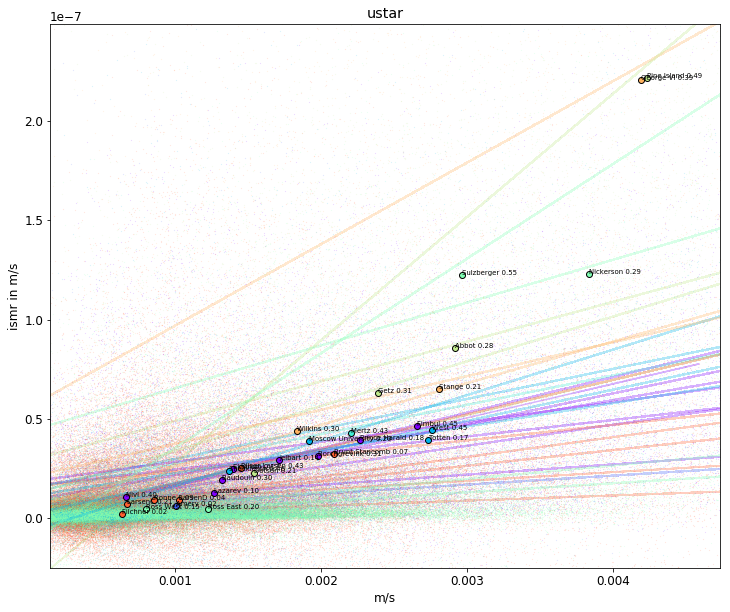

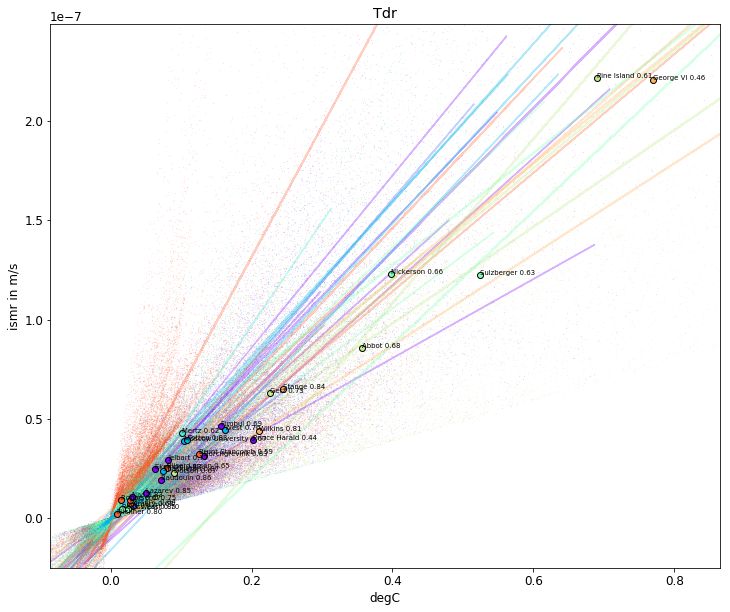

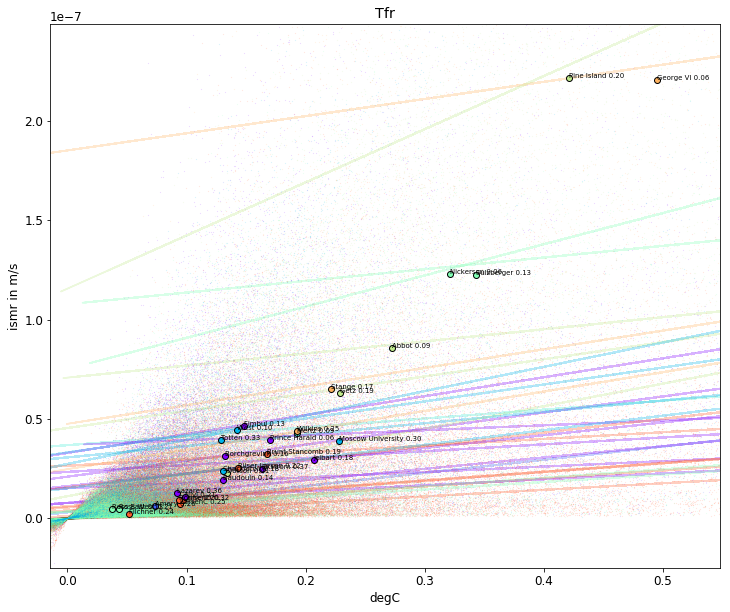

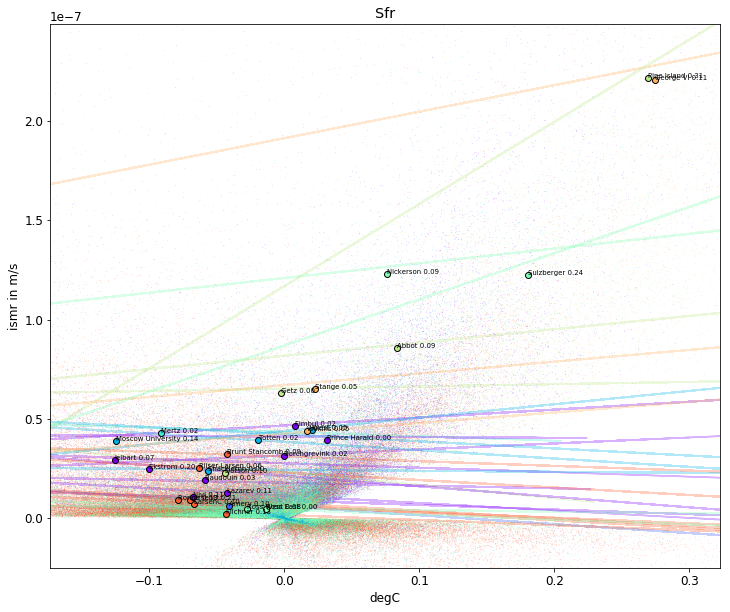

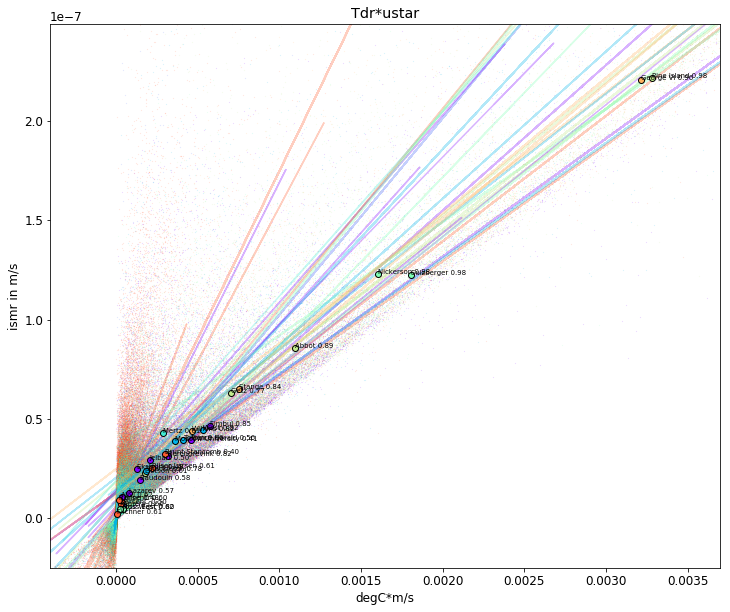

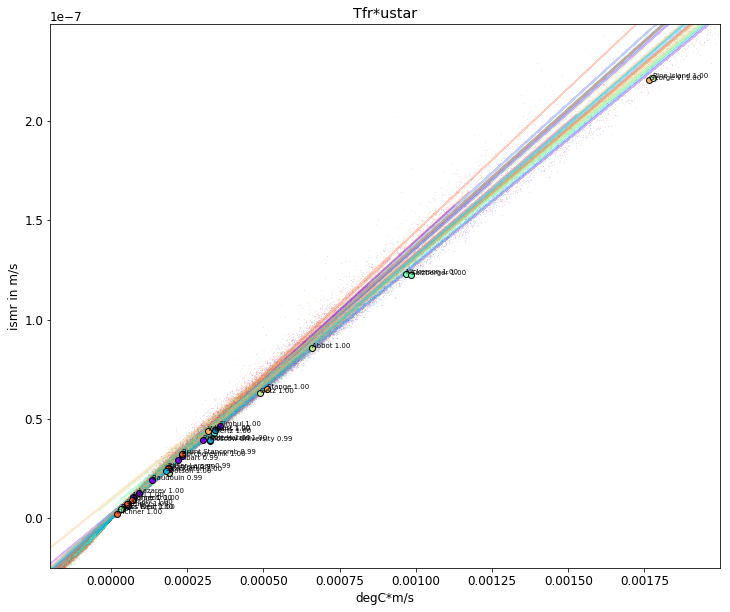

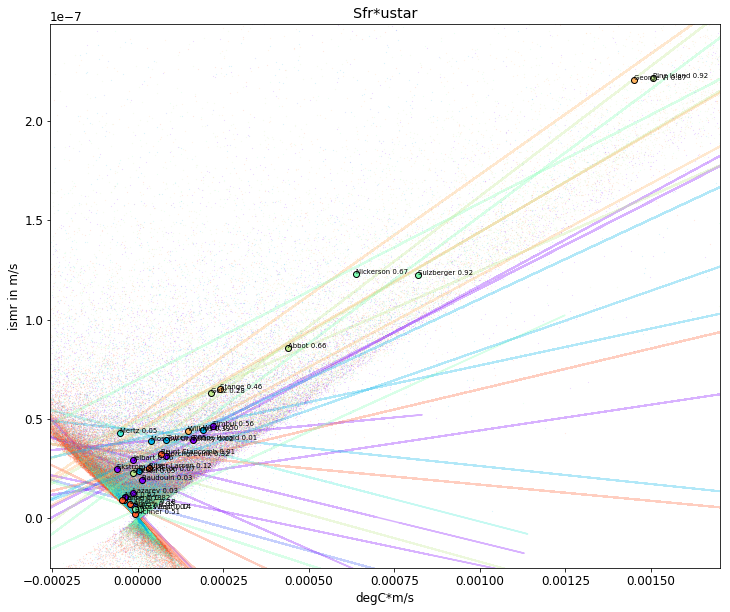

In [867]:
for qunat,title,xlab in zip([ustar2,Tdr2,Tfr2,Sfr2,Tdr2*ustar2,Tfr2*ustar2,Sfr*ustar2],
                            ['ustar','Tdr','Tfr','Sfr','Tdr*ustar','Tfr*ustar','Sfr*ustar'],
                             ['m/s','degC','degC','degC','degC*m/s','degC*m/s','degC*m/s']):
    plot_shelves_agg(qunat,m2,title,xlab,'ismr in m/s',big_shelves2)

In [10]:
for quant_y,title_y,ylab in zip([m2/Tdr2,m2/ustar2],
                                ['ismr/Tdr','ismr/ustar'],
                                ['m/s / degC','m/s / m/s']):
    for quant_x,title_x,xlab in zip([ustar2,Tdr2,Tfr2,Sfr2,Tdr2*ustar2,Tfr2*ustar2,Sfr*ustar2],
                                ['ustar','Tdr','Tfr','Sfr','Tdr*ustar','Tfr*ustar','Sfr*ustar'],
                                 ['m/s','degC','degC','degC','degC*m/s','degC*m/s','degC*m/s']):
        plot_shelves_agg(quant_x,quant_y,title_y+' over '+title_x,xlab,ylab,big_shelves2)

NameError: name 'Sfr' is not defined

In [ ]:
from sklearn.decomposition import PCA

X = cells.drop('ismr',axis=1)
y = cells['ismr']
model = PCA(n_components=2)
model.fit(X)
X_2D = model.transform(X)

cells['PCA1'] = X_2D[:,0]
cells['PCA2'] = X_2D[:,1]

ax = sns.lmplot('PCA1','PCA2',data=cells,fit_reg=False,hue='ismr',palette='bwr',height=10)
ax._legend.remove()

KeyboardInterrupt: 

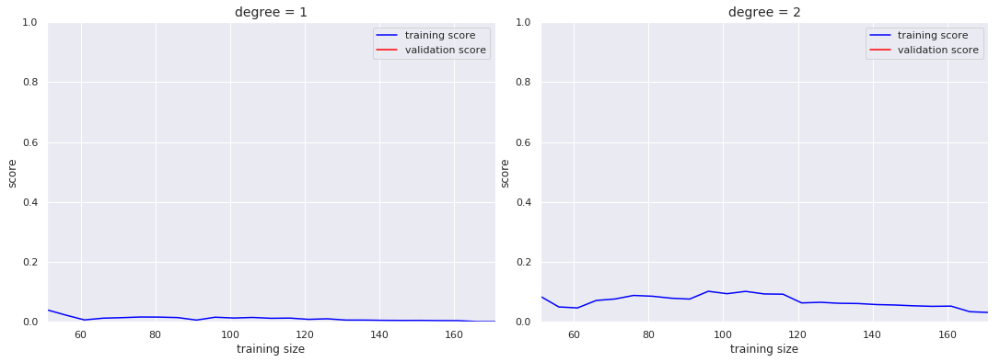

In [108]:
from sklearn.model_selection import learning_curve

X = melt['Tfr'].values.reshape(-1,1)
y = melt['ustar'].values.reshape(-1,1)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

for i, degree in enumerate([1, 2]):
    N, train_lc, val_lc = learning_curve(PolynomialRegression(degree),
                                         X, y, cv=7,
                                         train_sizes=np.linspace(0.3, 1, 25))

    ax[i].plot(N, np.mean(train_lc, 1), color='blue', label='training score')
    ax[i].plot(N, np.mean(val_lc, 1), color='red', label='validation score')
    ax[i].hlines(np.mean([train_lc[-1], val_lc[-1]]), N[0], N[-1],
                 color='gray', linestyle='dashed')

    ax[i].set_ylim(0, 1)
    ax[i].set_xlim(N[0], N[-1])
    ax[i].set_xlabel('training size')
    ax[i].set_ylabel('score')
    ax[i].set_title('degree = {0}'.format(degree), size=14)
    ax[i].legend(loc='best')

In [107]:
learning_curve?

In [111]:
from mpl_toolkits.mplot3d import Axes3D

%matplotlib notebook

n = 100

x = Tfr2.values.flatten()[::n]
y = ustar2.values.flatten()[::n]
z = m2.values.flatten()[::n]
#c = m2.values.flatten()[::n]

mask = ~np.isnan(x) & ~np.isnan(y) & ~np.isnan(z)

x = x[mask]
y = y[mask]
z = z[mask]
#c = c[mask]

<IPython.core.display.Javascript object>


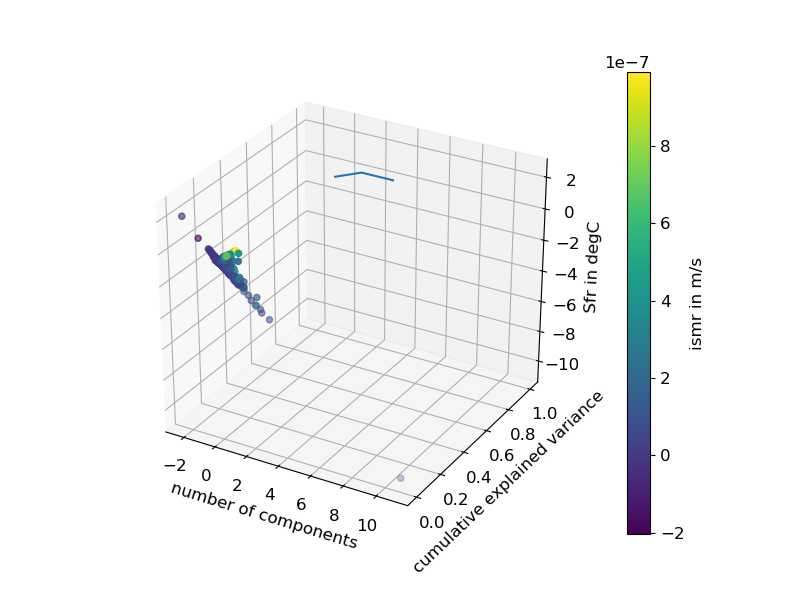

In [25]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111,projection='3d') 

#ax.set_aspect('equal')
plot = ax.scatter(x,y,z,c=c)

ax.set_xlabel('Tfr in degC')
ax.set_ylabel('ustar in m/s')
ax.set_zlabel('Sfr in degC')

plt.colorbar(plot,ax=ax,label='ismr in m/s')

plt.show()

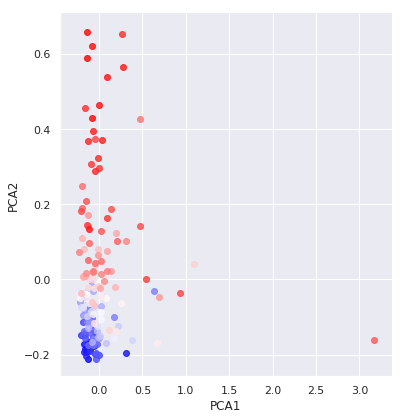

In [9]:
from sklearn.decomposition import PCA
X = avg.drop('ismr',axis=1)
y = avg['ismr']
model = PCA(n_components=2)
model.fit(X)
X_2D = model.transform(X)

avg['PCA1'] = X_2D[:,0]
avg['PCA2'] = X_2D[:,1]

ax = sns.lmplot('PCA1','PCA2',data=avg,fit_reg=False,hue='ismr',palette='bwr',height=6)
ax._legend.remove()

In [174]:
x = Tfr2.values
y = ustar2.values
eta = grd2.eta_rho.values
xi = grd2.xi_rho.values

eta,xi = np.meshgrid(xi,eta)

mask = ~np.isnan(x) & ~np.isnan(y)
n=1
x = x[mask][::n]
y = y[mask][::n]

eta = eta[mask][::n]
xi = xi[mask][::n]

x[x<0]=-x[x<0]

data = np.vstack([x, y]).T

BIC_AIC_test(data)

KeyboardInterrupt: 

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/sklearn/mixture/base.py:265: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


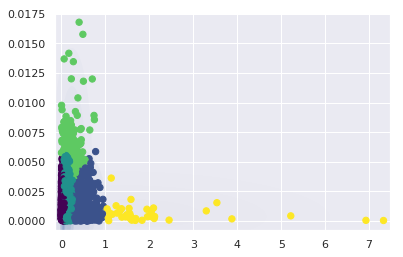

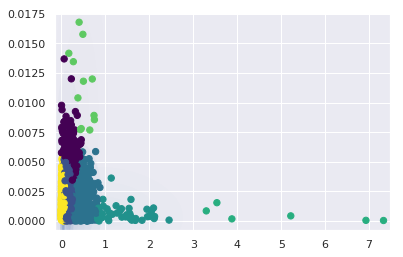

In [55]:
model = GaussianMixture(n_components=5,covariance_type='full').fit(data)

plot_gmm(model,data)

In [284]:
BMG = ustar2.copy()
for j,i,d in zip(xi,eta,model1.predict(data)):
    BMG[j-1,i-1] = d 

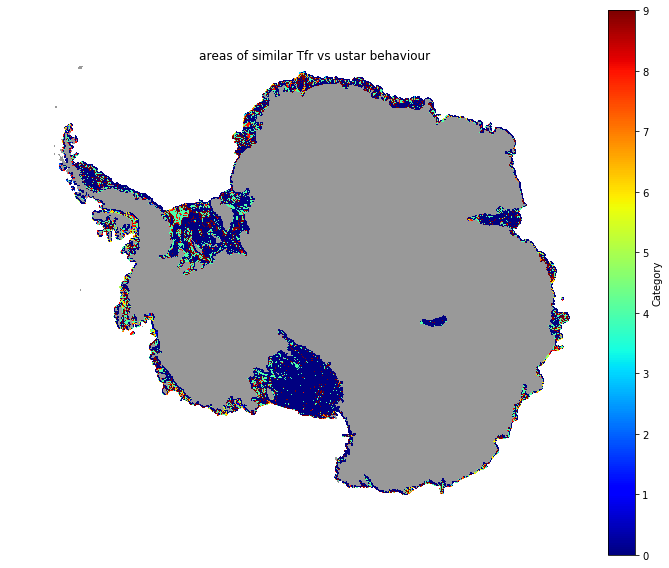

In [297]:
plot_map(BMG,grd2,'areas of similar Tfr vs ustar behaviour','Category',cmap='jet',vrange=[0,9])

In [456]:
plot_map(BMG,grd2,'areas of similar Tfr vs ustar behaviour','Category',cmap='jet',vrange=[0,9])

NameError: name 'BMG' is not defined

## ice shelf averages

In [144]:
s2a = 3600*24*365.25
for k,v in log_progress(shelves2.items(),every=2):
        shelves2[k]['std']=m2.where(v['mask']).std()*s2a

In [140]:
def map_shelves_avg(name,grd,title,cbar_label,cmap,shelves_dict,vrange=None):
    
    shelf_map = np.zeros_like(grd.mask_rho)
    for key,values in log_progress(shelves_dict.items(),every=2):
        shelf_map[values['mask']]=v[name]
        
    shelf_map = xr.DataArray(shelf_map,dims=('eta_rho','xi_rho')).where((grd.zice<0)&(grd.mask_rho==1)&(shelf_map!=0))
    
    plt.close()
    fig,ax = plt.subplots(figsize=(10,8))
    ax.axis('off')
    ax.set_aspect('equal')
    ax.contourf(grd.mask_rho.where(grd.mask_rho==0),colors=(('0.6','0.6','0.6')))
    
    
    plot = shelf_map.plot(ax=ax,cmap=cmap,cbar_kwargs={'label': cbar_label})
    ax.set_title(title)
    ax.set_ylim([250,2500])
    ax.set_xlim([200,2900])
    plt.tight_layout()
    #plt.savefig(os.path.join(fig_dir,'tmp','map_'+title.replace('/','_')+'.png'),format='png',dpi=400,bbox_inches = "tight")
    plt.show()

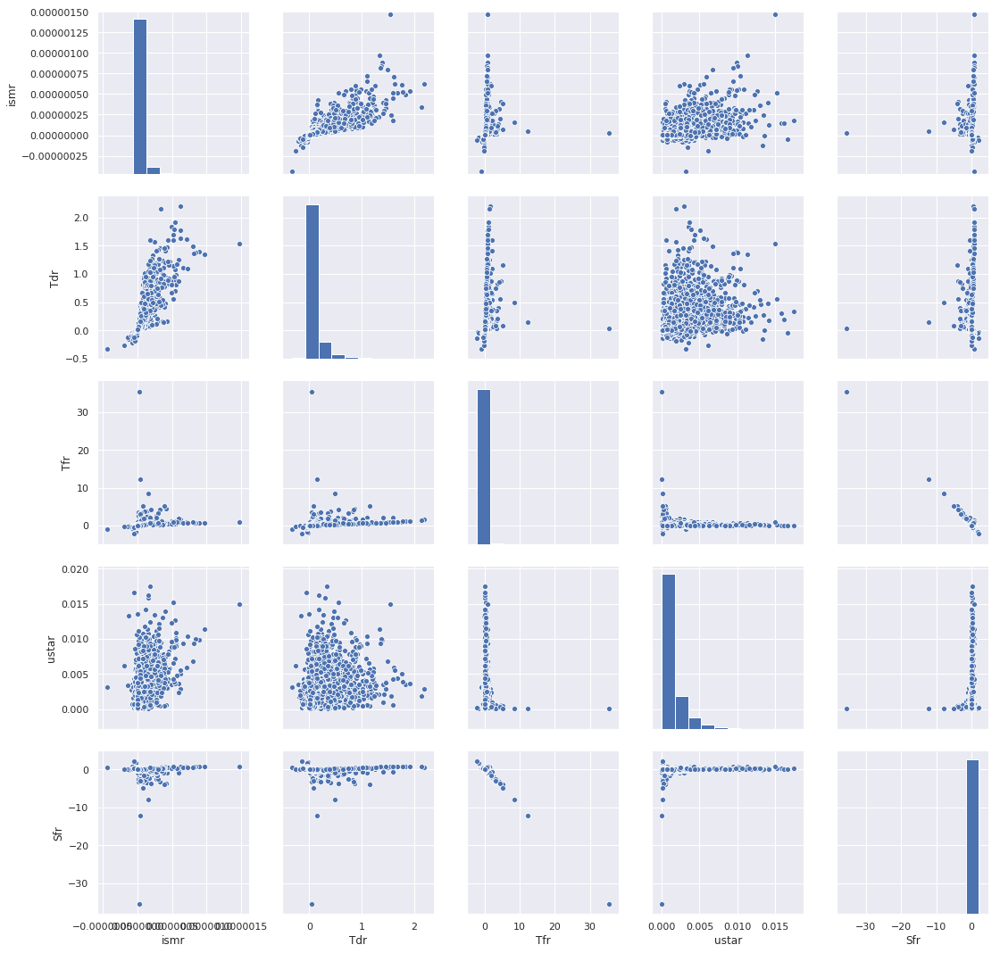

In [36]:
n = 1
cells = pd.DataFrame.from_dict({'ismr':m2.values.flatten()[::n],'Tfr':Tfr2.values.flatten()[::n],
                        'Sfr':Sfr2.values.flatten()[::n],'ustar':ustar2.values.flatten()[::n],
                        'Tdr':Tdr2.values.flatten()[::n]}).dropna(axis=0,how='any')

cells  = cells.sample(10000)

def scale_ax(axes,quant):
    axes.set_ylim(quant.min()-0.5*quant.std(),quant.max()+0.5*quant.std())
    
    return

ax = sns.pairplot(cells,height=3,vars=['ismr','Tdr','Tfr','ustar','Sfr'])

scale_ax(ax.axes[0,0],cells['ismr'])

[0.87607163 0.99999208 1.         1.         1.        ]


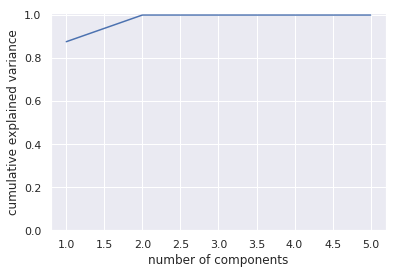

In [14]:
from sklearn.decomposition import PCA
X = cells[['ismr','Tfr','ustar','Sfr','Tdr']].T
pca = PCA().fit(X)
print(np.cumsum(pca.explained_variance_ratio_))

plt.close()
plt.plot(np.arange(5)+1,np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.ylim([0,1.01])
plt.show()

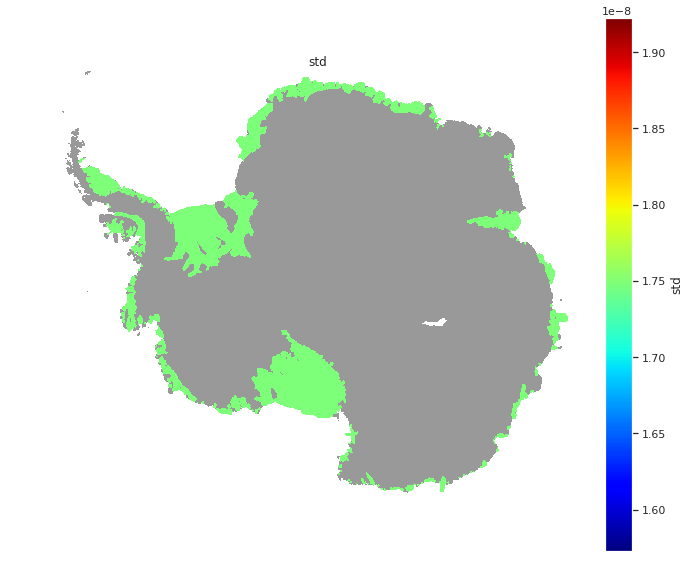

In [141]:
map_shelves_avg('std',grd2,'std','std',cmap='jet',shelves_dict=shelves2)

In [130]:
import pandas as pd
avg = pd.DataFrame.from_dict(shelves2).T[['ismr','ustar','Tdr','Tfr','Sfr','Tfr*ustar']].dropna(axis=0,how='any').astype(float)

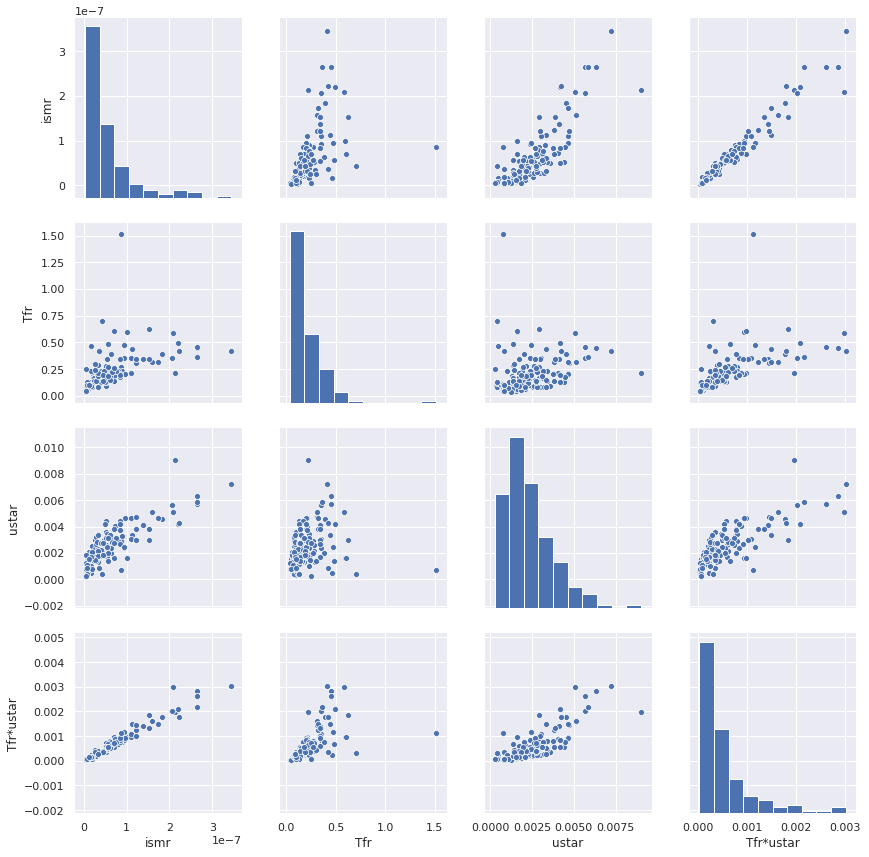

In [37]:
%matplotlib inline
import seaborn as sns; sns.set()
ax = sns.pairplot(avg,height=3,vars=['ismr','Tfr','ustar','Tfr*ustar'])
scale_ax(ax.axes[0,0],avg['ismr'])    

In [253]:
import matplotlib as mpl
def scatter_avg_3D(x_name,y_name,color_name,title,xlab,ylab,shelves_dict=shelves2,save=False):
   
    matplotlib.rcParams.update({'font.size': 22}) 

    plt.close()
    fig,ax = plt.subplots(figsize=(16,6))
    
    c_min = min([shelves2[k]['ismr'] for k,v in shelves2.items()])
    c_max = max([shelves2[k]['ismr'] for k,v in shelves2.items()])
    cmap = plt.get_cmap('rainbow')
    
    for shelf_key,shelf_data in shelves_dict.items():

        x = shelf_data[x_name]
        y = shelf_data[y_name]
        c = cmap((shelf_data[color_name]-c_min)/(c_max-c_min))

        ax.plot(x,y,'.',c=c)
    
    norm = mpl.colors.Normalize(vmin=c_min,vmax=c_max)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm,label='ismr in m/s')
    
    ylim = ax.get_ylim()    
    x_min,x_max = ax.get_xlim()
    x=np.linspace(0,x_max,100)
    
    for c in np.linspace(0.00003,0.003,10):
        ax.plot(x,c/x,'k-',alpha=0.1)
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title,fontsize=22)
    ax.set_ylim(ylim)
    
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_shelfavg_'+title.replace('/','_').replace(' ','_')+'.png'),format='png',dpi=300,bbox_inches = "tight")    
    
    plt.show()

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


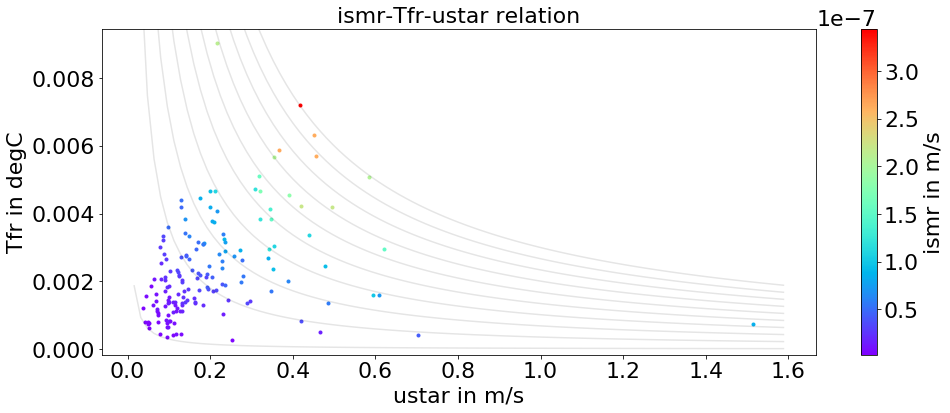

In [254]:
scatter_avg_3D('Tfr','ustar','ismr','ismr-Tfr-ustar relation','ustar in m/s','Tfr in degC',save=True)

In [201]:
shelves2['Abbot']['GM']

3

In [51]:
import matplotlib
def scatter_shelves_avg(x_name,y_name,title,xlab,ylab,shelves_dict=shelves2,big=False,save=False):
    
    matplotlib.rcParams.update({'font.size': 18})
    colors = plt.cm.viridis(np.linspace(0,3,n))
    plt.close()
    fig,ax = plt.subplots(figsize=(12,10))
    
    ypos=0.87
    
    x_all = []
    y_all = []
    
    for gm in np.arange(3):
        
        x_gm = []
        y_gm = []
        
        shelves_dict_sel = {k:v for k,v in shelves_dict.items() if v['gm']==gm}

        for shelf_key,shelf_data in shelves_dict_sel.items():

            if big:
                if shelf_data['A'] > 5:
                    continue

            x = shelf_data[x_name]
            y = shelf_data[y_name]

            ax.plot(x,y,'.',c='k')
            #        ax.annotate(key,(x,y),size='x-small')

            x_gm.append(x)
            y_gm.append(y)
            
            x_all.append(x)
            y_all.append(y)
    
        x_gm = np.array(x_gm).squeeze()
        y_gm = np.array(y_gm).squeeze()
    
        plot_regres(ax,x_gm,y_gm,str(gm),0.1,ypos,'k',1)    
        ypos=ypos-0.06
    
    x_all = np.array(x_all).squeeze()
    y_all = np.array(y_all).squeeze()
    
    plot_regres(ax,x_all,y_all,'Total Antarctica',0.1,0.94,'k',1)
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title,fontsize=18)
    
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_shelfavg_'+title.replace('/','_').replace(' ','_')+'.png'),format='png',dpi=300,bbox_inches = "tight")    
    
    plt.show()
    
    return

In [216]:
plot_regres?

TypeError: expected 1D vector for x

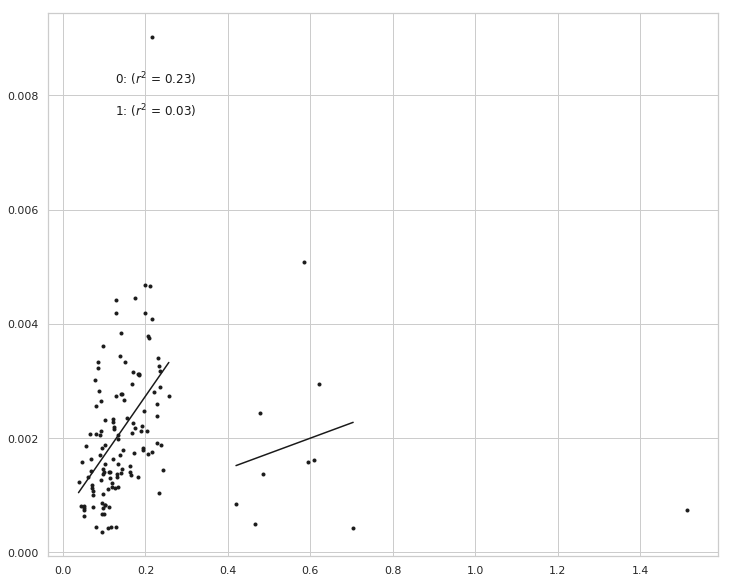

In [220]:
scatter_shelves_avg('Tfr','ustar','','','',shelves_dict=shelves2,big=False,save=False)

In [251]:
#%%writefile ../../src/visualization/scatter_shelves_agg.py
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from tools.log_progress import log_progress
import matplotlib as mpl
import cmocean.cm as ocm

mpl.rcParams.update({'font.size': 12}) 

# Polynomial Regression
def polyfit(x, y, degree, zeroCept=False):
    results = {}

    if zeroCept==False:
        coeffs = np.polyfit(x, y, degree)
    else:
        coeffs = np.append(np.polyfit(x, y/x, degree-1),0)

    # r-squared
    p = np.poly1d(coeffs)
    # fit values, and mean
    yhat = p(x)                         # or [p(z) for z in x]
    ybar = np.sum(y)/len(y)          # or sum(y)/len(y)
    ssreg = np.sum((yhat-ybar)**2)   # or sum([ (yihat - ybar)**2 for yihat in yhat])
    sstot = np.sum((y - ybar)**2)    # or sum([ (yi - ybar)**2 for yi in y])
    Rsquared = ssreg / sstot
    
    xp =np.linspace(min(x),max(x),100)
    
    return xp,p,Rsquared

def plot_regres(ax,x_all,y_all,tit,xpos,ypos,color,deg,poly_print=False):
    xp,p,Rsquared = polyfit(x_all,y_all,deg)        
    ax.plot(xp,p(xp),'-',label='constrained poly fit',alpha=1,c=color)
    if poly_print:
        ax.text(xpos,ypos,tit+':'+str(p)+' ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,fontsize=12,color=color)
    else:
        ax.text(xpos,ypos,tit+': ($r^2$ = %.2f)' %(Rsquared),transform=ax.transAxes,fontsize=12,color=color)
        
    return p
    
def scatter_shelves_agg(x,y,title,xlab,ylab,deg,save=False):
    matplotlib.rcParams.update({'font.size': 18})
    n = len(shelves_dict)
    colors = iter(ocm.phase(np.linspace(0,1,n)))
    shelfcol = {} 
    for key,data in shelves_dict.items():
        shelves_dict[key]['color'] = next(colors)
    
    plt.close()
    fig,ax = plt.subplots(figsize=(12,10))
    
    x_all=[]
    y_all=[]
    
    x_big=[]
    y_big=[]

    ypos=0.925
    xpos=0.01
    for key,data in log_progress(shelves_dict.items(),every=2):
        
        if key == 'Pine Island':
            xpos = 0.4
            ypos = 0.975
        
        x = x_quant.squeeze().where(data['mask']).values.flatten()
        y = y_quant.squeeze().where(data['mask']).values.flatten()
        mask = (np.isnan(x)==False)
        mask[np.isnan(y)]=False
        x = x[mask]
        y = y[mask]
        
        if data['A']<5: continue
            #ax.plot(x,y,'.',ms=0.05,c='gray',label=key,alpha=0.5)
            #if x.size>1:
            #    xp,p,Rsquared = polyfit(x,y,1)
            #    ax.plot(xp,p(xp),ms=0.1,c='gray',label='linear fit',alpha=0.5)
        else:
            c=data['color']
            ax.plot(x,y,'.',ms=0.1,c=c,label=key,alpha=0.5)
            xp,p,Rsquared = polyfit(x,y,2)
            ax.plot(xp,p(xp),c=c,label='linear fit',alpha=1)
            
            shelves_dict[key]['polyfit'] = p
            shelves_dict[key]['r2'] = Rsquared
        
            plot_regres(ax,x,y,key,xpos,ypos,c,deg)
            ypos=ypos-0.025
       # x_all.extend(x)
       # y_all.extend(y)
        
    for key,data in log_progress(shelves_dict.items(),every=2):
        
        x = x_quant.squeeze().where(data['mask']).mean().values
        y = y_quant.squeeze().where(data['mask']).mean().values
        
        x_all.append(x)
        y_all.append(y)
        
        if data['A']<5:
            ax.plot(x,y,'.',label=key,c='gray',alpha=0.5)
        else:
            c=data['color']
            ax.plot(x,y,'o',markeredgecolor='k',label=key,c=c)
            ax.annotate(key,(x,y),size='xx-small')
            
            x_big.append(x)
            y_big.append(y)
        
    x_all = np.array(x_all).squeeze()
    y_all = np.array(y_all).squeeze()
    plot_regres(ax,x_all,y_all,'ice shelf averages all',0.01,0.975,'gray',deg)
    
    x_big = np.array(x_big).squeeze()
    y_big = np.array(y_big).squeeze()
    plot_regres(ax,x_big,y_big,'ice shelf averages big',0.01,0.95,'k',deg)
    
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title)
    ax.set_xlim([min(x_all)-0.5*np.std(x_all),max(x_all)+0.5*np.std(x_all)])
    ax.set_ylim([min(y_all)-0.5*np.std(y_all),max(y_all)+0.5*np.std(y_all)])
    
    
    
    if save:
        plt.savefig(os.path.join(fig_dir,'scatter_shelves_agg_'+title.replace('/','_')+'.png'),format='png',bbox_inches = "tight")    

    plt.show()   

In [ ]:
from scipy.optimize import curve_fit

def func(x,a,b,c):
    return a*(x**b)+c

s2a = 365.25*3600*24

xdata = avg['Tfr']
ydata = avg['ustar']*s2a
xtest = np.linspace(xdata.min(),xdata.max(),100)

plt.close()
fig,ax = plt.subplots()
ax.plot(xdata, ydata, 'b.', label='data')
popt, pov = curve_fit(func,xdata,ydata)
ax.plot(xtest, func(xtest, *popt), 'r-',
        label='fit: a=%5.5f, b=%5.3f, c=%5.3f' % tuple(popt))

def func(x,a,b):
    return a*(x**b)
popt, pcov = curve_fit(func, xdata, ydata)
ax.plot(xdata, func(xdata, *popt), 'g--',
        label='fit: a=%5.3f, b=%5.3f' % tuple(popt))
plt.legend()

In [243]:
ustar_mean = {}
for k,v in sector2.items():
    ustar_mean[k] = np.mean([shelves2[k2]['ustar'] for k2,v in shelves2.items() if v['sector']==k])
ustar_mean['Total Antarctica'] = np.mean([v for k,v in ustar_mean.items() if k!='Total Antarctica'])

/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ubuntu/bigStick/anaconda3/envs/antarctic_melting/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [193]:
def calc_melt_frc_front(Tm_base,Tfr_base,salt,grd,shelves_dict):
    
    dA =(grd.pm*grd.pn)**-1
    a = -0.057
    b = 0.0939
    c = 7.61e-4
    
    for k,v in log_progress(shelves_dict.items(),every=2):
        
        weights = dA.where(v['mask'])/ dA.where(v['mask']).sum()
        Tm_shelf = (Tm_base*weights).sum()
        Tfr_shelf = (Tfr_base*weights).sum()
        
        dV = grd.dV.where(v['front_mask'])
        weights=dV/dV.sum()
        S_front = (salt*weights).sum()
        z_front = (grd.z*weights).sum()
        
        Tb = Tm_shelf-Tfr_shelf
        TF_front = a*S_front + b + c*z_front
        
        shelves_dict[k]['Tm_base'] = Tm_shelf
        shelves_dict[k]['Tfr_base'] = Tfr_shelf
        shelves_dict[k]['Tb'] = Tb
        shelves_dict[k]['TF_front'] = TF_front
        shelves_dict[k]['S_front'] = S_front
        shelves_dict[k]['z_front'] = z_front
        shelves_dict[k]['Tfr_front'] = v['Tm_front']-Tb
        shelves_dict[k]['Tdr_front'] = v['Tm_front']-TF_front
        
    return shelves_dict

In [279]:
shelves2 = calc_melt_frc_front(Tm2,Tfr2,salt2,grd2,shelves2)